<a href="https://colab.research.google.com/github/tsachiblau/sparseGANProject/blob/master/GAN_roy_w_pursuiter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

setting up

In [0]:
from keras.optimizers import Adam
import numpy as np

np.random.seed(10)

noise_dim = 100



batch_size = 16
steps_per_epoch = 3750  # batch_size * steps_per_epoch = epoch size (train size)
epochs = 5

img_rows, img_cols, channels = 28, 28, 1
sparse_dim = img_rows * img_cols * channels

optimizer = Adam(0.0002, 0.5) 
#optimizer = Adam(0.001)

import data set

In [2]:
from keras.datasets import mnist

(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = (x_train.astype(np.float32) - 127.5) / 127.5  # normalize between +1 -1

x_train = x_train.reshape(-1, img_rows*img_cols*channels) # each image as vector
x_test = x_test.reshape(-1, img_rows*img_cols*channels) # each image as vector


np.random.shuffle(x_train)
print(x_train.shape)

11493376/11490434 [==============================] - 1s 0us/step
(60000, 784)


creating gan:

In [0]:
# generator:
from keras.models import Sequential
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import Input
from keras.models import Model
from keras.initializers import RandomNormal
from keras.layers import Dense, Conv2D, Flatten, Reshape, Dropout, AveragePooling2D, MaxPooling2D, BatchNormalization

# input: image size
# output: noise size
def create_reconstructor():
    reconstructor = Sequential()

    reconstructor.add(Dense(512, input_dim=img_cols*img_rows*channels))
    reconstructor.add(LeakyReLU(0.2))

    reconstructor.add(Dense(256))
    reconstructor.add(LeakyReLU(0.2))

    reconstructor.add(Dense(noise_dim))
    reconstructor.add(LeakyReLU(0.2))

    #reconstructor.compile(loss='mean_squared_error', optimizer='sgd')
    return reconstructor

# input: noise size
# output: image size
def create_generator():
    generator = Sequential()
    
    generator.add(Dense(256, input_dim=noise_dim))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(512))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(1024))
    generator.add(BatchNormalization())
    generator.add(LeakyReLU(0.2))

    generator.add(Dense(img_rows*img_cols*channels, activation='tanh'))
    # remove this to return to FC scheme
    generator.add(Reshape((img_rows, img_cols, channels)))
    #generator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return generator

# input: image size
# output: 1 number - 1 real 0 fake
# descriminator:
def create_descriminator():
    discriminator = Sequential()
    #16 - better
    discriminator.add(Conv2D(16, (3, 3), strides=(2,2),padding='same', kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    #32 - better
    discriminator.add(Conv2D(32, (3, 3), strides=(2,2), padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    # 64 - better
    discriminator.add(Conv2D(64, (3, 3), strides=(2,2), padding='same', kernel_initializer=RandomNormal(0, 0.02)))
    discriminator.add(BatchNormalization())
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Flatten())
    discriminator.add(Dropout(0.4))
    discriminator.add(Dense(1, activation='sigmoid'))   # 1 number which indicates real / fake
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator
    
"""
def create_descriminator():
    discriminator = Sequential()
     
    discriminator.add(Dense(1024, input_dim=img_rows*img_cols*channels))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(512))
    discriminator.add(LeakyReLU(0.2))

    discriminator.add(Dense(256))
    discriminator.add(LeakyReLU(0.2))
    
    discriminator.add(Dense(1, activation='sigmoid'))
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator
"""
# build GAN
discriminator = create_descriminator()
generator = create_generator()
reconstructor = create_reconstructor()

discriminator.trainable = False   # will be trained separately, not as GAN

gan_input = Input(shape=(noise_dim,))

fake_image = generator(gan_input)

fake_image_vec = Flatten()(fake_image)  # will enter reconstructor


gan_output = discriminator(fake_image)

vae_output = reconstructor(fake_image_vec)

vae = Model(gan_input, vae_output)
vae.compile(loss='mean_squared_error', optimizer='sgd') #todo: consider MAE


gan = Model(gan_input, gan_output)
gan.compile(loss='binary_crossentropy', optimizer=optimizer)













Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


train the GAN:

(None, 784)
(None, 100)


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch: 0 	 Discriminator Loss: 0.24623315036296844 		 Generator Loss: 3.267835855484009 		 Reconstructor Loss: 0.9457851648330688 
Epoch: 1 	 Discriminator Loss: 0.2589292526245117 		 Generator Loss: 3.885723829269409 		 Reconstructor Loss: 0.9594258069992065 
Epoch: 2 	 Discriminator Loss: 0.23936159908771515 		 Generator Loss: 3.946578025817871 		 Reconstructor Loss: 1.0347537994384766 
Epoch: 3 	 Discriminator Loss: 0.21601106226444244 		 Generator Loss: 5.366122722625732 		 Reconstructor Loss: 1.0479507446289062 
Epoch: 4 	 Discriminator Loss: 0.26192808151245117 		 Generator Loss: 4.450636386871338 		 Reconstructor Loss: 1.0151227712631226 
Epoch: 5 	 Discriminator Loss: 0.2654881477355957 		 Generator Loss: 3.3728604316711426 		 Reconstructor Loss: 0.9949914216995239 
Epoch: 6 	 Discriminator Loss: 0.21870771050453186 		 Generator Loss: 3.5679547786712646 		 Reconstructor Loss: 1.0137231349945068 
Epoch: 7 	 Discriminator Loss: 0.33633220195770264 		 Generator Loss: 4.90957164764

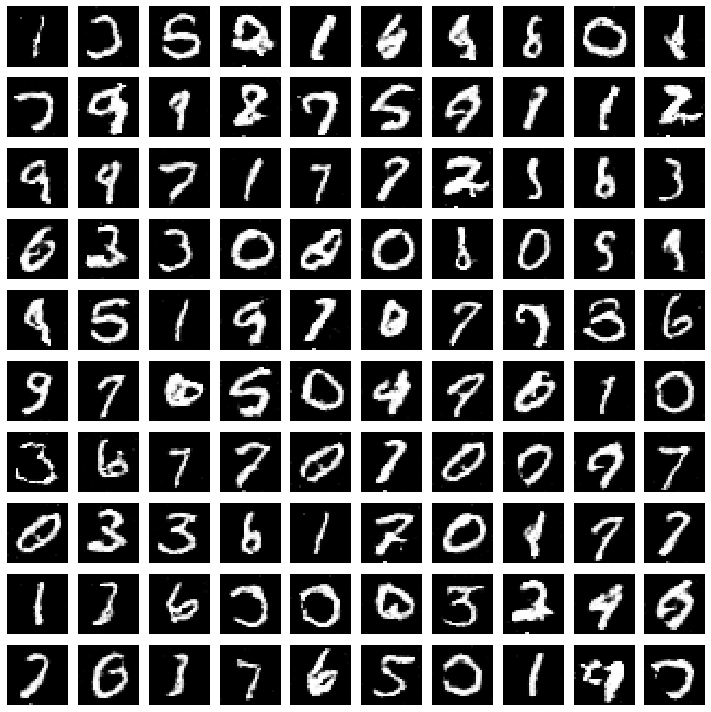

In [0]:
import matplotlib.pyplot as plt


for epoch in range(epochs):  
    for batch in range(steps_per_epoch): 
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        fake_x = generator.predict(noise) # create G(z)

        real_x = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)] # sample real image
        #remove below to return to FC scheme
        real_x = real_x.reshape(fake_x.shape)

        x = np.concatenate((real_x, fake_x))

        disc_y = np.zeros(2*batch_size)
        disc_y[:batch_size] = 0.9

        # train_on_batch recieves data and desired output
        d_loss_fake = discriminator.train_on_batch(x[:batch_size], disc_y[:batch_size])
        d_loss_real = discriminator.train_on_batch(x[batch_size:-1], disc_y[batch_size:-1])
        # train GAN (descriminator weights are fixed)
        y_gen = np.ones(batch_size)
        g_loss = gan.train_on_batch(noise, y_gen)
        # train reconstructor
        if(batch)
          r_loss = vae.train_on_batch(noise[:batch_size],noise[:batch_size])

        

    print(f'Epoch: {epoch} \t Discriminator Loss: {(d_loss_fake+d_loss_real)/2} \t\t Generator Loss: {g_loss} \t\t Reconstructor Loss: {r_loss} ')


def show_images(noise):
    generated_images = generator.predict(noise)
    plt.figure(figsize=(10, 10))
    
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
        else:
            plt.imshow(image.reshape((img_rows, img_cols, channels)))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


noise = np.random.normal(0, 1, size=(100, noise_dim))
show_images(noise)





Train sparse dictionary: *RUN ONLY ONCE*

In [0]:
from sklearn.decomposition import DictionaryLearning
from numpy import loadtxt,savetxt
import matplotlib.pyplot as plt
from google.colab import files


# init a dictionary learning alg - based on LARS
# TODO - change to all data set and make redundant dictionary
d=DictionaryLearning(n_components=sparse_dim)
# train dictionary
d.fit(x_train)
dictionary = d.components_
savetxt('dictionary.csv', dictionary, delimiter=',')
# download to local machine
files.download('dictionary.csv') 

# we will download to a local file named dictionary_loaded
#*reconstruct* an image for sanity check
representation_vec = d.transform(x_train[1:2,:])
print(representation_vec.shape)
print(dictionary_loaded2.shape)
dictionary_loaded2 = np.transpose(dictionary_loaded2)
representation_vec = np.transpose(representation_vec)
ans = np.matmul(dictionary_loaded2,representation_vec)

plt.figure()
plt.imshow(ans.reshape((img_rows, img_cols)), cmap='gray')

plt.figure()
real_im = x_train[1:2,:]
plt.imshow(real_im.reshape((img_rows, img_cols)), cmap='gray')


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-3-f8731d9080ba>", line 11, in <module>
    d.fit(x_train)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/_dict_learning.py", line 1238, in fit
    positive_code=self.positive_code)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/decomposition/_dict_learning.py", line 551, in dict_learning
    code, S, dictionary = linalg.svd(X, full_matrices=False)
  File "/usr/local/lib/python3.6/dist-packages/scipy/linalg/decomp_svd.py", line 129, in svd
    full_matrices=full_matrices, overwrite_a=overwrite_a)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py", line 1823, in showtraceback
    stb = value._re

KeyboardInterrupt: ignored

reload trained dictionary from local machine - dictionary_loaded.csv

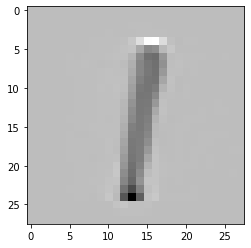

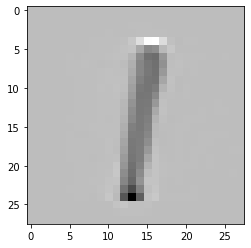

In [3]:
from numpy import loadtxt,savetxt
import matplotlib.pyplot as plt

dictionary_loaded2 = loadtxt('dictionary_loaded.csv', delimiter=',')
dictionary_loaded2 = np.array(dictionary_loaded2,dtype=np.float32) # format that is used in keras
# the above dict should enable training a regular gan

# sanity check
dictionary_loaded2 = np.transpose(dictionary_loaded2)
atom1 = (dictionary_loaded2)[:,0]
plt.figure()
plt.imshow(atom1.reshape((img_rows, img_cols)), cmap='gray')

first_atom = np.zeros(784)
first_atom[0] = 1
plt.figure()
ans = np.matmul(dictionary_loaded2,np.transpose(first_atom))
plt.imshow(ans.reshape((img_rows, img_cols)), cmap='gray')

Sanity test on dictionary

[ 0.03436248  0.03436248  0.03436248  0.03436248  0.03436248  0.03436248
  0.03436248  0.03436248  0.03436248  0.03436248  0.03436248  0.03436248
  0.03436126  0.03435722  0.03435959  0.03436236  0.03436248  0.03436248
  0.03436248  0.03436248  0.03436248  0.03436248  0.03436248  0.03436248
  0.03436248  0.03436248  0.03436248  0.03436248  0.03436248  0.03436248
  0.03436248  0.03436248  0.03436244  0.03436235  0.03436194  0.0343608
  0.03436666  0.03437388  0.03437438  0.03436788  0.03435844  0.03435289
  0.03437248  0.03442568  0.03441432  0.03436488  0.03437235  0.0343735
  0.03436887  0.03436092  0.03436141  0.03436195  0.03436248  0.03436248
  0.03436248  0.03436248  0.03436248  0.03436248  0.03436251  0.03436249
  0.03436416  0.03436303  0.03435951  0.03435313  0.03436487  0.03439062
  0.03442306  0.03442932  0.0344498   0.03449983  0.03450623  0.0345155
  0.03438831  0.03426142  0.03420307  0.03424123  0.0343274   0.03439284
  0.03437362  0.03435237  0.03436042  0.03436374  0.03

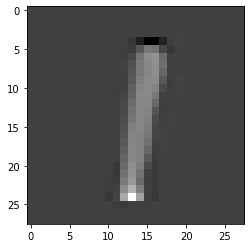

In [0]:
from sklearn.decomposition import DictionaryLearning

print(dictionary_loaded2[:,0] )

atom1 = (dictionary_loaded2)[:,0]
plt.figure()
plt.imshow(atom1.reshape((img_rows, img_cols)), cmap='gray')




In [0]:
L1_weight = 10   # Loss = data_fidelity + L1_weight * L1_norm
thr_value = 0.1

Trying to Create pursuit network for sanity check
Input : Image
Output: Image_r = D*Sparse

In [0]:
# with pursuit and thresholding approach
# generator:
from keras.utils import plot_model
from keras.models import Sequential
from keras import backend as K
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import Input
from keras.models import Model
from keras.initializers import RandomNormal, glorot_uniform
from keras.layers import Dense, Conv2D, Flatten, Reshape, Dropout, AveragePooling2D, MaxPooling2D, BatchNormalization, Lambda, ReLU, ThresholdedReLU, Activation
from tensorflow.linalg import matmul, matrix_transpose
from tensorflow.math import abs
from keras import regularizers


from keras.utils.generic_utils import get_custom_objects
import tensorflow as tf
from tensorflow import cast

# would cause small entries in absulute values to be set to zero and will create sparse vectors
def soft_threshlding(x):
  above_thr_pos = x * cast(x >= thr_value, tf.float32)
  below_thr_neg = x * cast(x <= -thr_value, tf.float32)
  return (above_thr_pos + below_thr_neg)

get_custom_objects().update({'soft_threshlding': Activation(soft_threshlding)})

def create_pursuiter():
    pursuiter = Sequential()
    init = RandomNormal(0,stddev=0.02)
    pursuiter.add(Dense(1024, kernel_initializer=init, input_dim=784,name="pursuiter_input"))
    pursuiter.add(BatchNormalization())
    pursuiter.add(LeakyReLU(0.2))

    pursuiter.add(Dense(1024,kernel_initializer=init,name="pursuiter_2nd"))
    pursuiter.add(BatchNormalization())
    pursuiter.add(LeakyReLU(0.2))

    pursuiter.add(Dense(sparse_dim, kernel_initializer=init,name="pursuiter_3rd"))
    pursuiter.add(BatchNormalization())
    # soft thresholding activation
    pursuiter.add(Activation(soft_threshlding, name='soft_threshlding'))

    #pursuiter.add(Lambda(lambda x: matrix_transpose(matmul(dictionary_loaded2,matrix_transpose(x))),name='mul_in_D'))

    #pursuiter.compile(loss='mean_squared_error', optimizer=optimizer)
    return pursuiter

pursuiter = create_pursuiter()
pursuiter.name = "pursuit_unit"
pursuiter_input = Input(shape=(784,))

sparse_vec = pursuiter(pursuiter_input) 

# a layer that creates the multiplication between the sparse tensor with dictionary to create image
fake_image_vec = Lambda(lambda x: matrix_transpose(matmul(dictionary_loaded2,matrix_transpose(x))),name='mul_in_D')(sparse_vec)


#pursuiter_full = Model(pursuiter_input, [fake_image_vec,sparse_vec])
#pursuiter_full.compile(loss=['mean_squared_error','mean_absolute_error'], optimizer=optimizer,loss_weights=[1,0])
pursuiter_full = Model(pursuiter_input, fake_image_vec)
pursuiter_full.compile(loss='mean_squared_error', optimizer=optimizer)
pursuiter_full.name = "pursuiter_full"

print(pursuiter_full.summary())
zeros = np.zeros(10000*784)
zeros=zeros.reshape(10000,784)
#model1=pursuiter_full.fit(x_train, [x_train,x_train], validation_data=(x_test, [x_test,zeros]), epochs=epochs, batch_size=16)
model1=pursuiter_full.fit(x_train, x_train, validation_data=(x_test, x_test), epochs=10, batch_size=16)

plot_model(pursuiter_full, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

plot_model(pursuiter, to_file='model_plot.png', show_shapes=True, show_layer_names=True)


Model: "pursuiter_full"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_21 (InputLayer)        (None, 784)               0         
_________________________________________________________________
pursuit_unit (Sequential)    (None, 784)               2668368   
_________________________________________________________________
mul_in_D (Lambda)            (None, 784)               0         
Total params: 2,668,368
Trainable params: 2,662,704
Non-trainable params: 5,664
_________________________________________________________________
None
Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 36s 600us/step - loss: 0.2377 - val_loss: 1676.1844
Epoch 2/10
60000/60000 [==============================] - 32s 534us/step - loss: 0.0782 - val_loss: 1207.9882
Epoch 3/10
50416/60000 [========================>.....] - ETA: 4s - loss: 0.0647

{'val_loss': [1684.7371626953125, 913.1123381835938, 1002.3588461914062, 843.9326375976563, 894.4054498046875, 1029.3403288085938, 990.5882129882813, 1007.5419294921875, 1054.5893450195313, 1112.1804073242188], 'loss': [0.26607393118739125, 0.08156835175454616, 0.06499877068698406, 0.058239109587669376, 0.05403695854942004, 0.05145916385650635, 0.04976319066683451, 0.048136981893579164, 0.0471495400339365, 0.04572537525395552]}


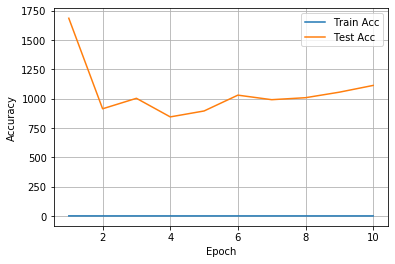

In [0]:
plt.figure()
print(model1.history)
plt.plot(range(1,len(model1.history['loss'])+1),model1.history['loss'], label='Train Acc')
plt.plot(range(1,len(model1.history['val_loss'])+1),model1.history['val_loss'], label='Test Acc')
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend()
plt.grid()
plt.show()

average support on train=  641.4687666666666
average support on test=  782.9436
Im_r, Im
sparse vector dim =  (1, 784)
sparse vector non zeros =  781
sparse vec max element is =  304.58716
positive number =  414
sparse vec average positive = 36.376102
negatives number =  367
sparse vec average negative = -36.284073


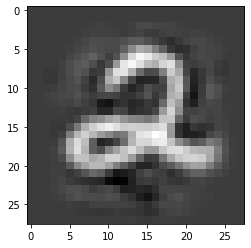

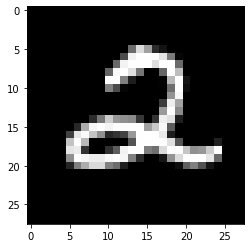

In [0]:
import random

x_train_pred = pursuiter.predict(x_train)
print("average support on train= ", np.count_nonzero(x_train_pred)/60000)

x_test_pred = pursuiter.predict(x_test)
print("average support on test= ", np.count_nonzero(x_test_pred)/10000)

im = random.randrange(0, 9999)
x_train.shape
x = np.array([x_test[im,:]])

# plt results
print("Im_r, Im")
plt.figure()
plt.imshow(pursuiter_full.predict(x)[0].reshape((img_rows, img_cols)), cmap='gray')

plt.figure()
plt.imshow(x[0].reshape((img_rows, img_cols)), cmap='gray')

# is it sparse?
pred = pursuiter.predict(x)
print("sparse vector dim = ", pred.shape)
print("sparse vector non zeros = ", np.count_nonzero(pred))
print("sparse vec max element is = ",np.max(pred))
print("positive number = ", np.count_nonzero(pred[pred>0]))
print("sparse vec average positive =",np.mean(pred[pred>0]))
print("negatives number = ", np.count_nonzero(pred[pred<0]))
print("sparse vec average negative =",np.mean(pred[pred<0]))


GAN + Reconstructor

Model: "Gen"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
init (Dense)                 (None, 256)               25856     
_________________________________________________________________
BN1 (BatchNormalization)     (None, 256)               1024      
_________________________________________________________________
Activation1 (LeakyReLU)      (None, 256)               0         
_________________________________________________________________
hidden1 (Dense)              (None, 512)               131584    
_________________________________________________________________
BN2 (BatchNormalization)     (None, 512)               2048      
_________________________________________________________________
Activation2 (LeakyReLU)      (None, 512)               0         
_________________________________________________________________
hidden2 (Dense)              (None, 1024)              525312  

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


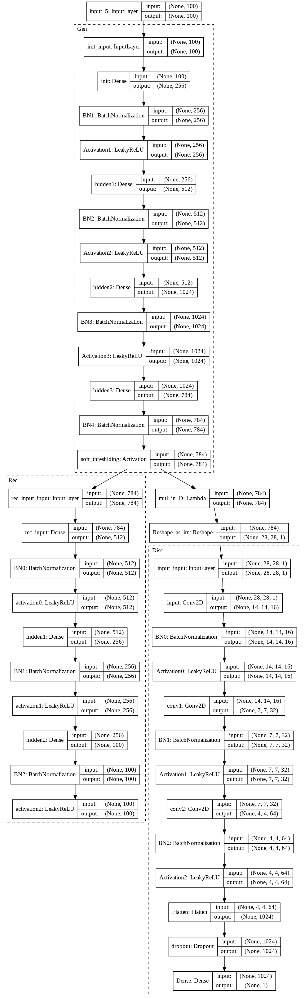

In [23]:
# with pursuit and thresholding approach
# generator:
from keras.utils import plot_model
from keras.models import Sequential
from keras import backend as K
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import Input
from keras.models import Model
from keras.initializers import RandomNormal, glorot_uniform
from keras.layers import Dense, Conv2D, Flatten, Reshape, Dropout, AveragePooling2D, MaxPooling2D, BatchNormalization, Lambda, ReLU, ThresholdedReLU, Activation
from tensorflow.linalg import matmul, matrix_transpose
from tensorflow.math import abs
from keras import regularizers
from keras.losses import kullback_leibler_divergence, binary_crossentropy


from keras.utils.generic_utils import get_custom_objects
import tensorflow as tf
from tensorflow import cast

# costum loss - symmetric KL divergence

def my_loss(y_actual,y_pred):
  #return kullback_leibler_divergence(y_actual,y_pred)
  #return 0.5*(kullback_leibler_divergence(y_actual,y_pred) + binary_crossentropy(y_actual,y_pred))
  return  binary_crossentropy(y_actual,y_pred)


# would cause small entries in absulute values to be set to zero and will create sparse vectors
def soft_threshlding(x):
  above_thr_pos = x * cast(x >= thr_value, tf.float32)
  below_thr_neg = x * cast(x <= -thr_value, tf.float32)
  return (above_thr_pos + below_thr_neg)

get_custom_objects().update({'soft_threshlding': Activation(soft_threshlding)})

# input: sparse vec size
# output: noise size
def create_reconstructor():
    reconstructor = Sequential()
    init = RandomNormal(0,stddev=0.02)

    reconstructor.add(Dense(512,  kernel_initializer=init, input_dim=sparse_dim,name="rec_input"))
    reconstructor.add(BatchNormalization(name="BN0"))
    reconstructor.add(LeakyReLU(0.2,name="activation0"))

    reconstructor.add(Dense(256, kernel_initializer=init,name="hidden1"))
    reconstructor.add(BatchNormalization(name="BN1"))
    reconstructor.add(LeakyReLU(0.2,name="activation1"))

    reconstructor.add(Dense(noise_dim, kernel_initializer=init,name="hidden2"))
    reconstructor.add(BatchNormalization(name="BN2"))
    reconstructor.add(LeakyReLU(0.2,name="activation2"))

    #reconstructor.compile(loss='mean_squared_error', optimizer='sgd')
    return reconstructor

# input: noise size
# output: sparse vec size
def create_generator():
    generator = Sequential()
    init = RandomNormal(0,stddev=0.02)
    generator.add(Dense(256, kernel_initializer=init, input_dim=noise_dim,name="init"))
    generator.add(BatchNormalization(name="BN1"))
    generator.add(LeakyReLU(0.2,name="Activation1"))

    generator.add(Dense(512,kernel_initializer=init,name="hidden1"))
    generator.add(BatchNormalization(name="BN2"))
    generator.add(LeakyReLU(0.2,name="Activation2"))

    generator.add(Dense(1024,kernel_initializer=init,name="hidden2"))
    generator.add(BatchNormalization(name="BN3"))
    generator.add(LeakyReLU(0.2,name="Activation3"))

    generator.add(Dense(sparse_dim, kernel_initializer=init,name="hidden3"))
    # soft thresholding activation
    generator.add(BatchNormalization(name="BN4"))
    generator.add(Activation(soft_threshlding, name='soft_threshlding'))
    return generator

# input: image size
# output: 1 number - 1 real 0 fake
# descriminator:
def create_descriminator():
    discriminator = Sequential()
    #16 - better
    discriminator.add(Conv2D(16, (3, 3), strides=(2,2),padding='same', kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02), input_shape=(img_cols, img_rows, channels),name="input"))
    discriminator.add(BatchNormalization(name="BN0"))
    discriminator.add(LeakyReLU(0.2,name="Activation0"))
    #32 - better
    discriminator.add(Conv2D(32, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv1"))
    discriminator.add(BatchNormalization(name="BN1"))
    discriminator.add(LeakyReLU(0.2,name="Activation1"))
    # 64 - better
    discriminator.add(Conv2D(64, (3, 3), strides=(2,2), padding='same',  kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="conv2"))
    discriminator.add(BatchNormalization(name="BN2"))
    discriminator.add(LeakyReLU(0.2,name="Activation2"))
    
    discriminator.add(Flatten(name="Flatten"))
    discriminator.add(Dropout(0.4,name="dropout"))
    discriminator.add(Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01),kernel_initializer=RandomNormal(0, 0.02),name="Dense"))   # 1 number which indicates real / fake
    
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    return discriminator

# build GAN
discriminator = create_descriminator()
generator = create_generator()
reconstructor = create_reconstructor()
# naming:
discriminator.name = "Disc"
generator.name = "Gen"
reconstructor.name = "Rec"
#
discriminator.trainable = False   # will be trained separately, not as GAN

gan_input = Input(shape=(noise_dim,))

# G(z) is a sparse vector
sparse_vec = generator(gan_input)   # sparse_dim size - it is thresholded

# a layer that creates the multiplication between the sparse tensor with dictionary to create image
fake_image_vec = Lambda(lambda x: matrix_transpose(matmul(dictionary_loaded2,matrix_transpose(x))),name='mul_in_D')(sparse_vec)
# reshape to image size - will be inserted to discriminator
fake_image = Reshape((img_rows, img_cols, channels),name="Reshape_as_im")(fake_image_vec)

gan_output = discriminator(fake_image)  # the descriminator output
vae_output = reconstructor(sparse_vec)  # the reconstructor output

vae = Model(gan_input, vae_output)
vae.compile(loss='mean_squared_error', optimizer='sgd')

# todo - double output double loss
gan = Model(gan_input, [gan_output,sparse_vec])
gan.compile(loss=[my_loss,'mean_absolute_error'], optimizer=optimizer,loss_weights=[1,L1_weight])

print(generator.summary())
print(discriminator.summary())
print(reconstructor.summary())
complete = Model(gan_input,[gan_output,vae_output])
plot_model(complete, to_file='model_plot.png', show_shapes=True, show_layer_names=True,expand_nested=True)


2nd approach train

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


results after iter  0  loss =  0.4593123197555542  support =  454.8125


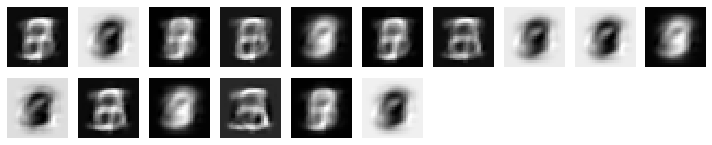

results after iter  100  loss =  0.4376736879348755  support =  346.0


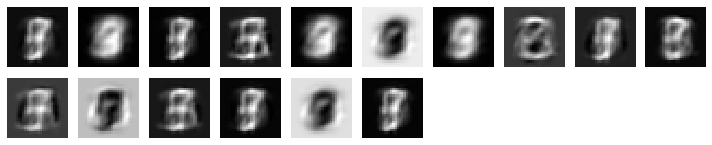

results after iter  200  loss =  0.42947134375572205  support =  469.25


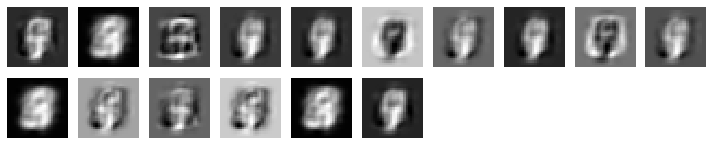

results after iter  300  loss =  0.43575042486190796  support =  429.375


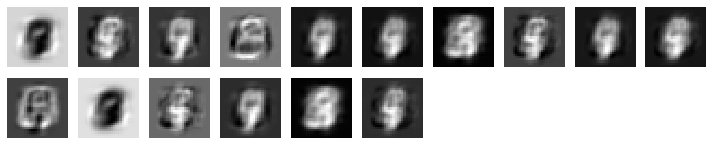

results after iter  400  loss =  0.42974966764450073  support =  333.75


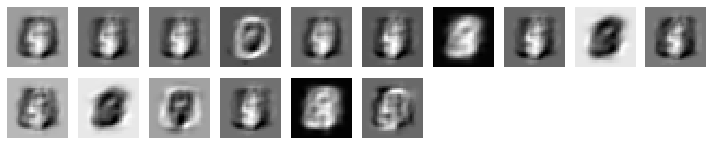

results after iter  500  loss =  0.3678886592388153  support =  699.125


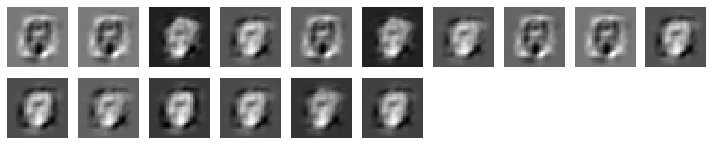

results after iter  600  loss =  0.3681960105895996  support =  548.625


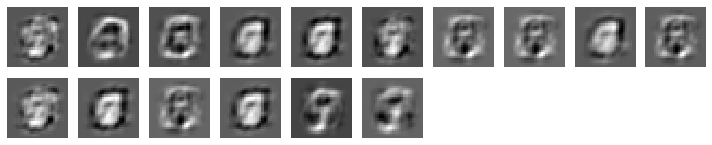

results after iter  700  loss =  0.3736514449119568  support =  484.6875


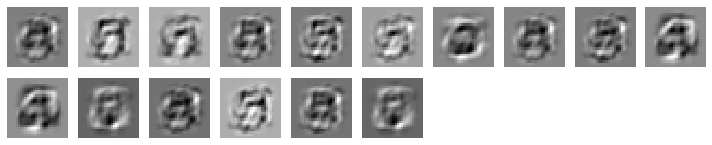

results after iter  800  loss =  0.3309057056903839  support =  477.625


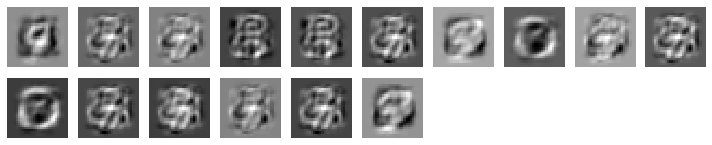

results after iter  900  loss =  0.35602644085884094  support =  479.0


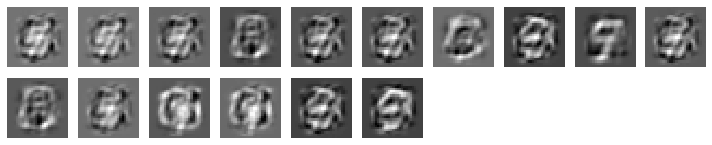

results after iter  1000  loss =  0.27254733443260193  support =  494.6875


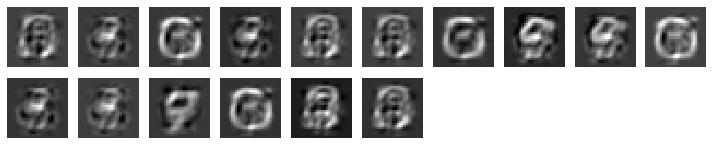

results after iter  1100  loss =  0.26792824268341064  support =  453.6875


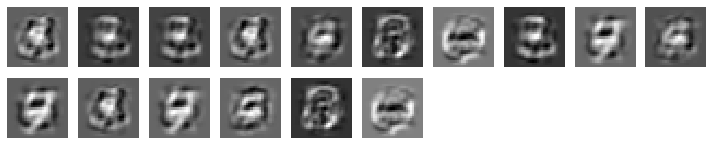

results after iter  1200  loss =  0.2871192693710327  support =  484.5625


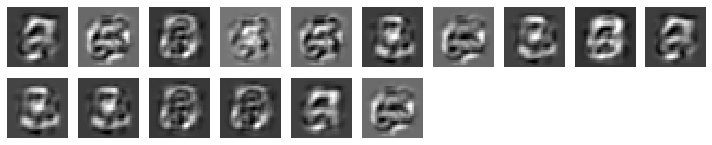

results after iter  1300  loss =  0.291116863489151  support =  459.375


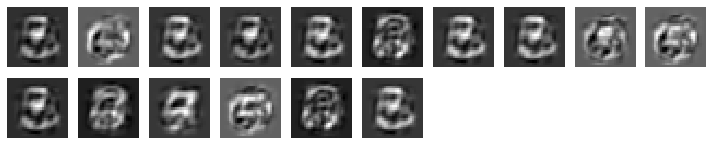

results after iter  1400  loss =  0.26539474725723267  support =  450.6875


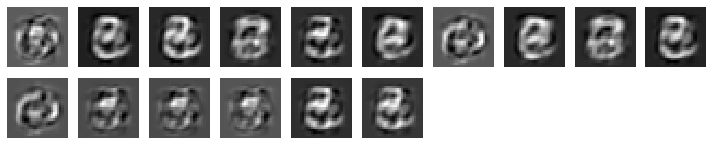

results after iter  1500  loss =  0.27729761600494385  support =  459.0625


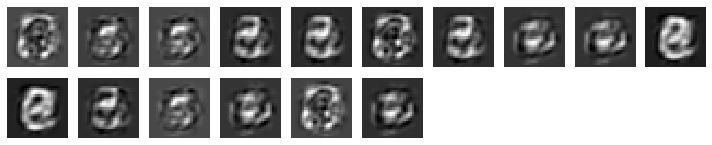

results after iter  1600  loss =  0.26645705103874207  support =  452.0


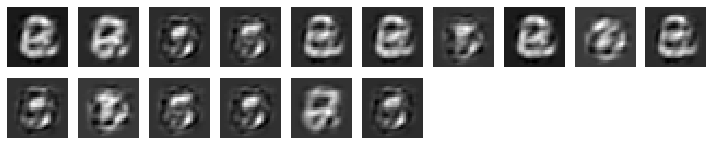

results after iter  1700  loss =  0.2785557508468628  support =  462.875


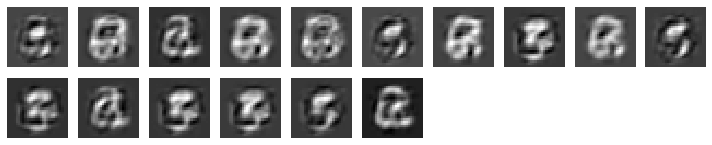

results after iter  1800  loss =  0.24291189014911652  support =  467.8125


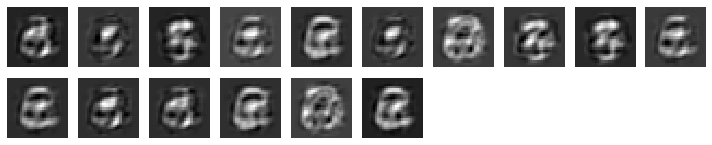

results after iter  1900  loss =  0.282634973526001  support =  445.9375


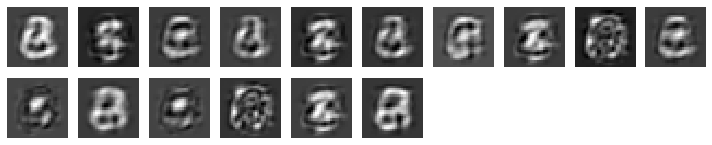

results after iter  2000  loss =  0.25662961602211  support =  483.75


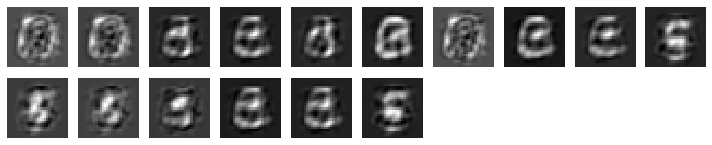

results after iter  2100  loss =  0.2794283926486969  support =  481.5


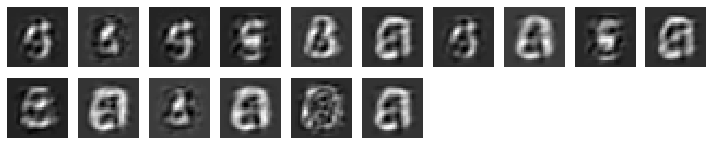

results after iter  2200  loss =  0.25995755195617676  support =  431.0625


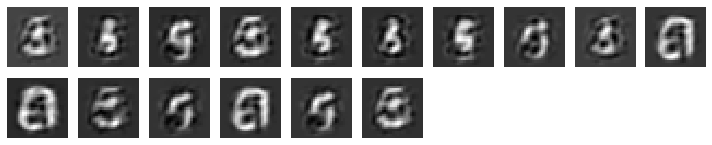

results after iter  2300  loss =  0.2802847623825073  support =  512.3125


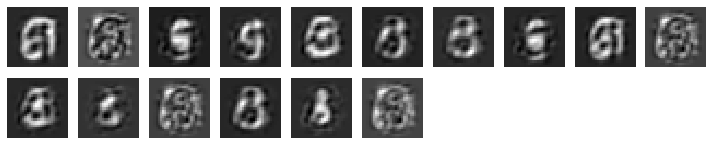

results after iter  2400  loss =  0.292322039604187  support =  417.25


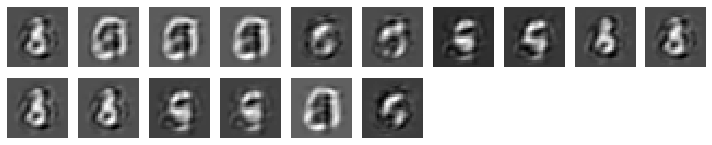

results after iter  2500  loss =  0.3045843839645386  support =  466.3125


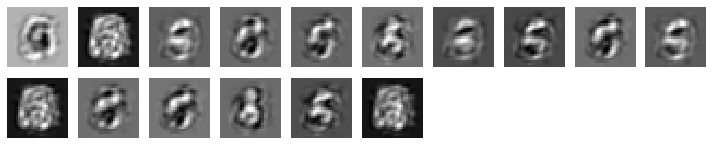

results after iter  2600  loss =  0.30284494161605835  support =  425.9375


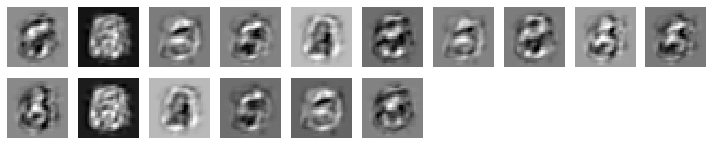

results after iter  2700  loss =  0.22756966948509216  support =  457.0625


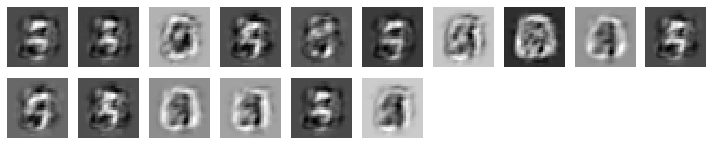

results after iter  2800  loss =  0.1950075924396515  support =  440.3125


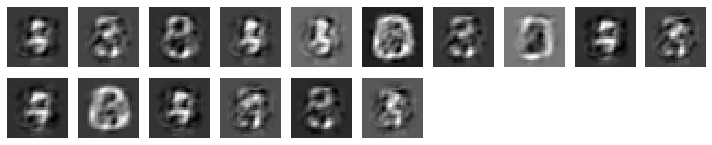

results after iter  2900  loss =  0.20692923665046692  support =  428.625


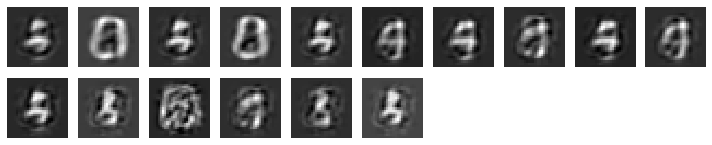

results after iter  3000  loss =  0.19418731331825256  support =  435.5625


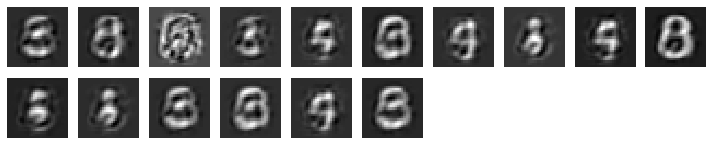

results after iter  3100  loss =  0.18499760329723358  support =  454.0625


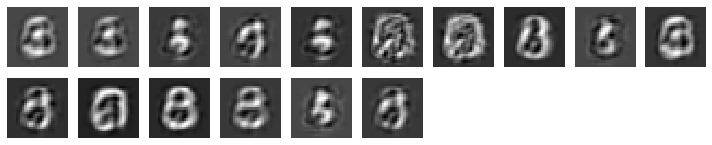

results after iter  3200  loss =  0.17245320975780487  support =  398.1875


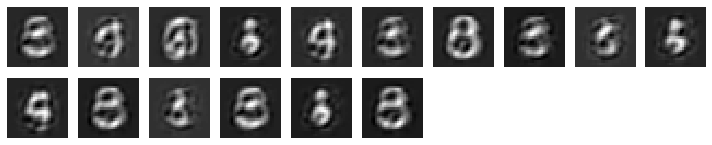

results after iter  3300  loss =  0.20270578563213348  support =  419.3125


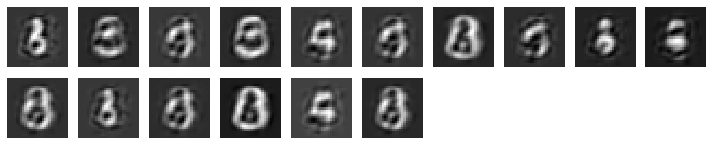

results after iter  3400  loss =  0.2093011438846588  support =  456.625


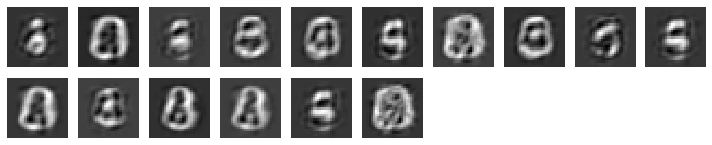

results after iter  3500  loss =  0.2042921781539917  support =  415.3125


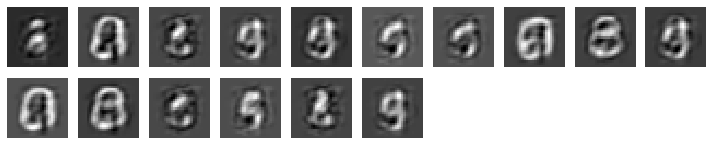

results after iter  3600  loss =  0.2030138373374939  support =  436.625


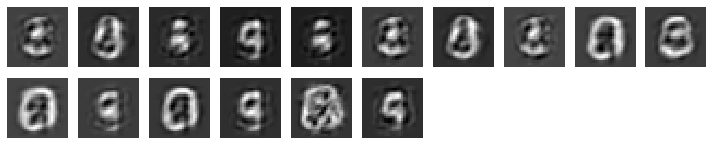

results after iter  3700  loss =  0.2263188660144806  support =  440.5


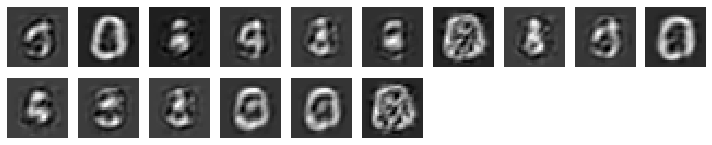

Epoch: 0 	 Discriminator Loss_fake: 0.34025630354881287 	 Discriminator Loss_real: 0.01418124046176672		 Generator Loss: [9.339445, 6.5084095, 0.28182608] 		 Reconstructor Loss:1.139782190322876


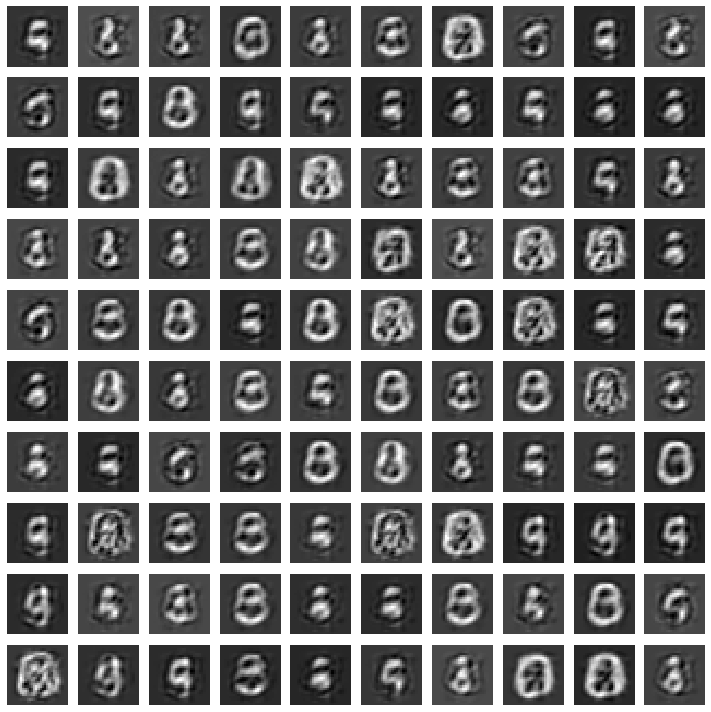

results after iter  3800  loss =  0.20181305706501007  support =  476.125


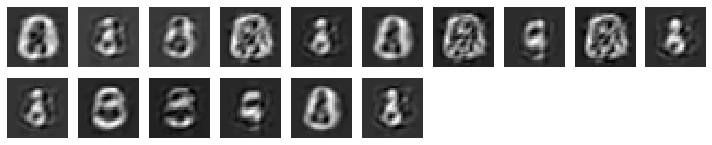

results after iter  3900  loss =  0.2706402540206909  support =  387.1875


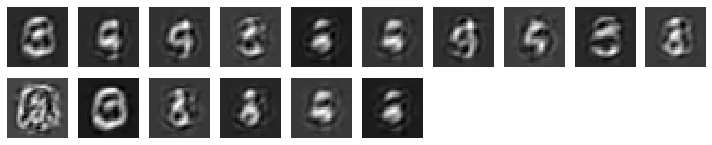

results after iter  4000  loss =  0.21581077575683594  support =  425.3125


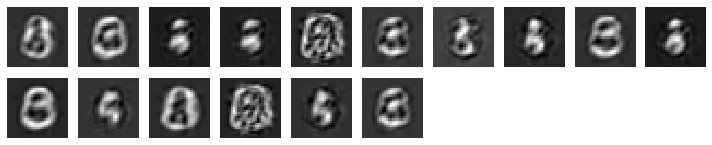

results after iter  4100  loss =  0.2326795905828476  support =  427.5


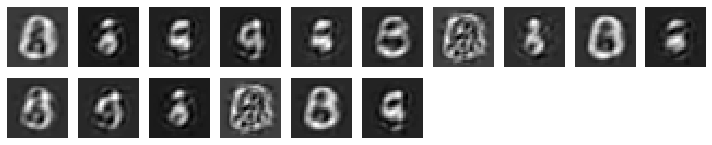

results after iter  4200  loss =  0.24667656421661377  support =  450.5


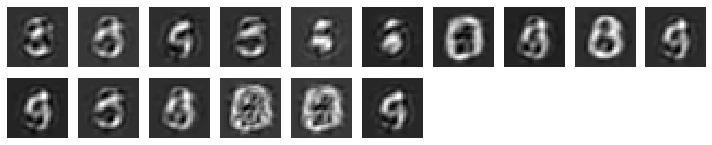

results after iter  4300  loss =  0.23282763361930847  support =  374.25


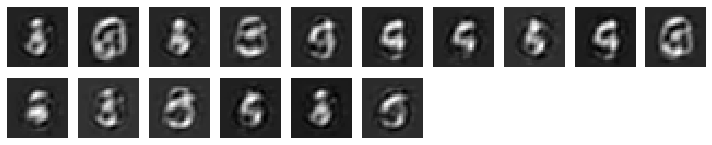

results after iter  4400  loss =  0.22050201892852783  support =  392.125


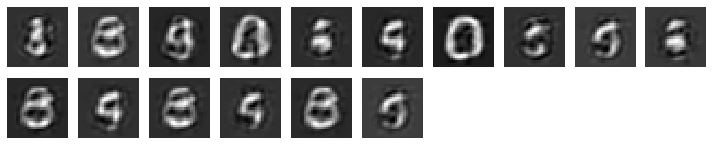

results after iter  4500  loss =  0.23080295324325562  support =  497.625


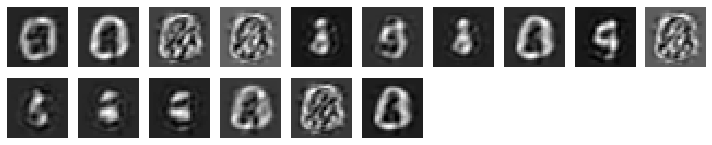

results after iter  4600  loss =  0.2656083106994629  support =  414.6875


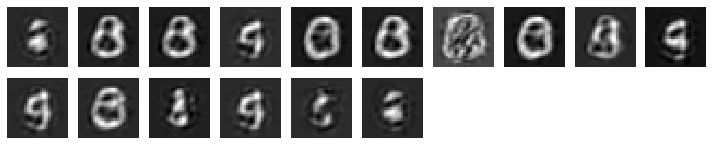

results after iter  4700  loss =  0.2336544692516327  support =  506.6875


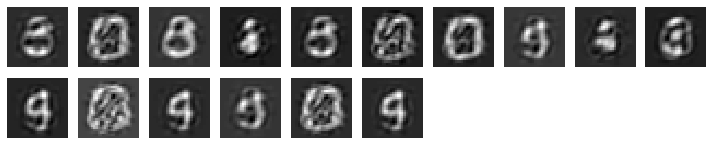

results after iter  4800  loss =  0.2271462082862854  support =  445.375


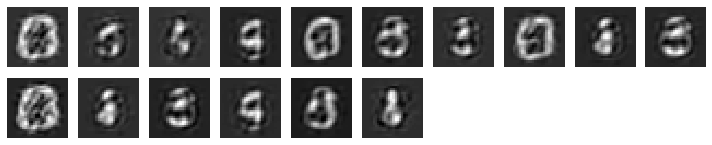

results after iter  4900  loss =  0.2473139464855194  support =  455.125


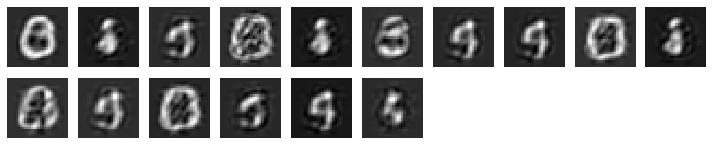

results after iter  5000  loss =  0.26732486486434937  support =  406.5625


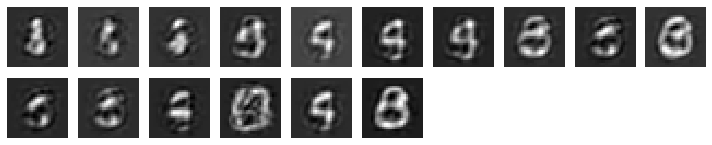

results after iter  5100  loss =  0.2300395667552948  support =  481.3125


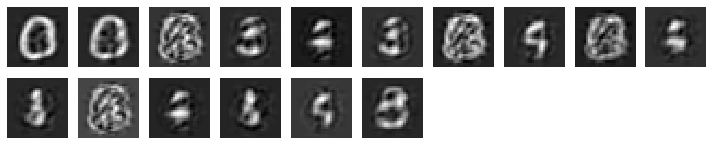

results after iter  5200  loss =  0.2327917516231537  support =  449.0


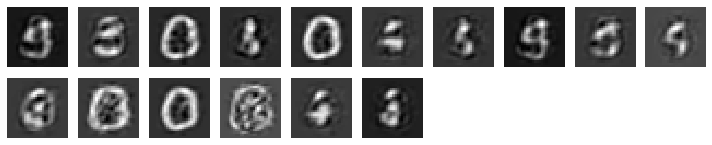

results after iter  5300  loss =  0.21736498177051544  support =  389.75


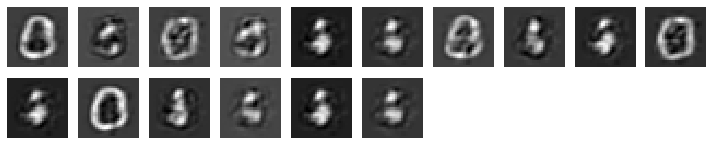

results after iter  5400  loss =  0.2206895351409912  support =  476.5


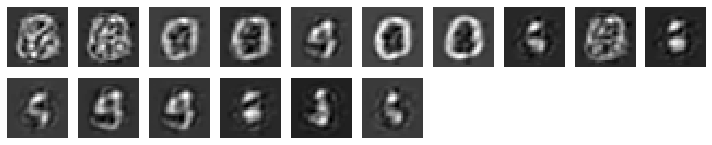

results after iter  5500  loss =  0.2682652175426483  support =  428.375


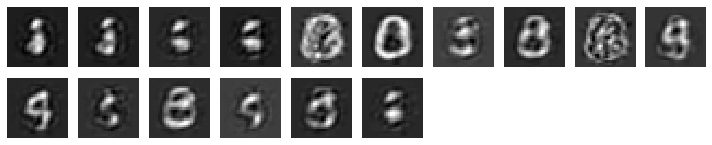

results after iter  5600  loss =  0.2310892939567566  support =  445.625


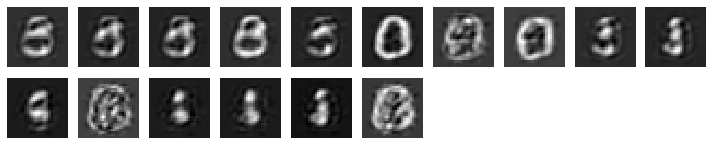

results after iter  5700  loss =  0.24232026934623718  support =  370.25


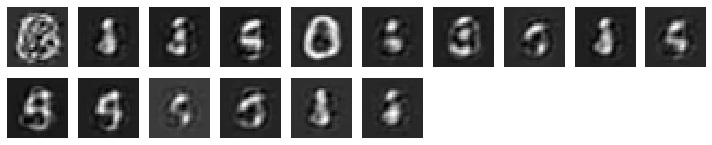

results after iter  5800  loss =  0.2503393888473511  support =  385.8125


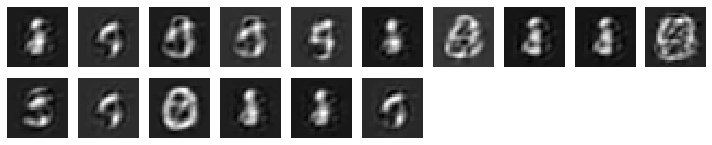

results after iter  5900  loss =  0.2428165227174759  support =  405.875


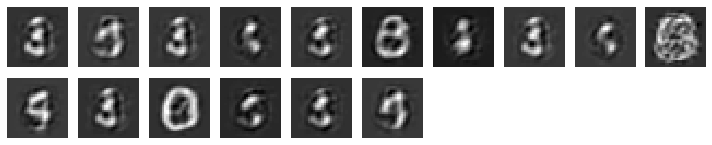

results after iter  6000  loss =  0.228920578956604  support =  433.6875


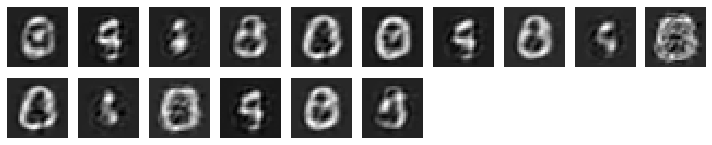

results after iter  6100  loss =  0.21241861581802368  support =  410.9375


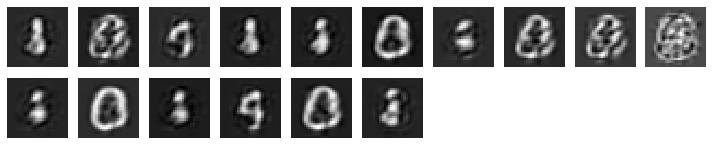

results after iter  6200  loss =  0.21482926607131958  support =  395.125


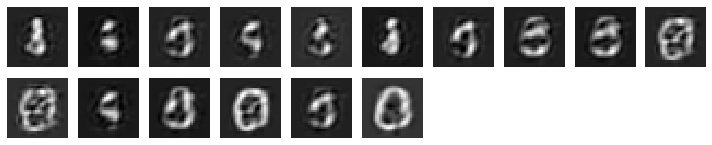

results after iter  6300  loss =  0.21618981659412384  support =  504.8125


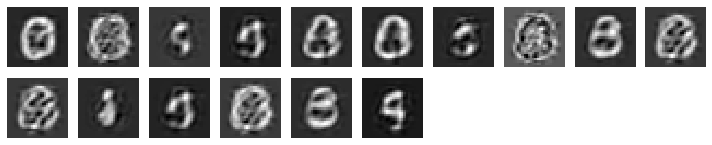

results after iter  6400  loss =  0.19824734330177307  support =  405.4375


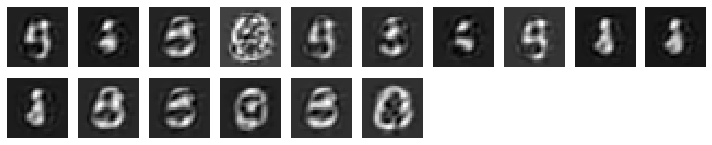

results after iter  6500  loss =  0.2056886851787567  support =  369.0


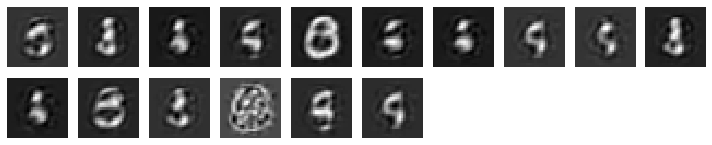

results after iter  6600  loss =  0.2136686146259308  support =  387.0625


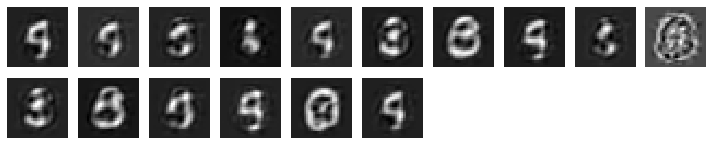

results after iter  6700  loss =  0.20365524291992188  support =  390.6875


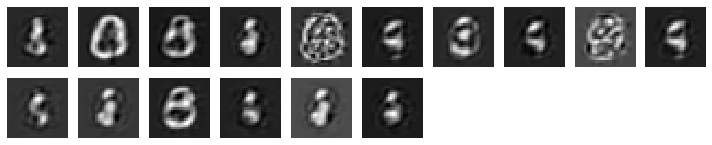

results after iter  6800  loss =  0.2511240839958191  support =  388.5625


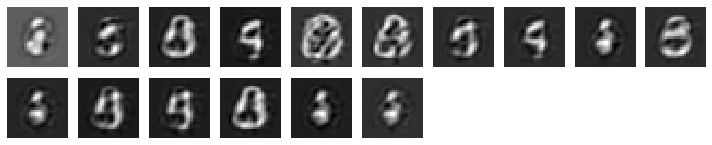

results after iter  6900  loss =  0.21893419325351715  support =  372.5


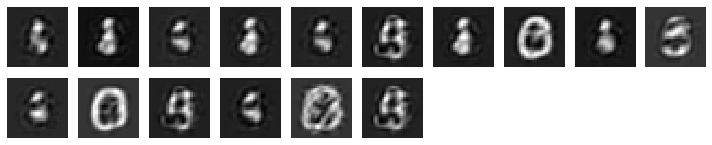

results after iter  7000  loss =  0.2186720371246338  support =  349.1875


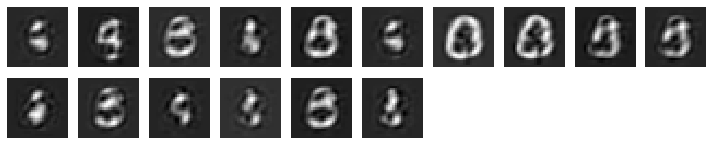

results after iter  7100  loss =  0.2481197863817215  support =  443.1875


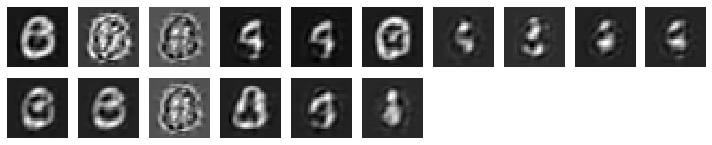

results after iter  7200  loss =  0.22123903036117554  support =  503.9375


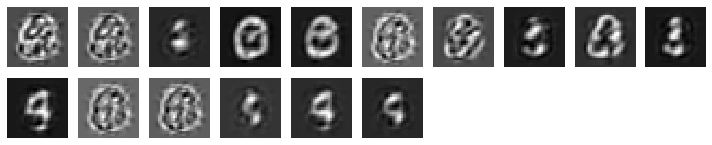

results after iter  7300  loss =  0.22674429416656494  support =  392.125


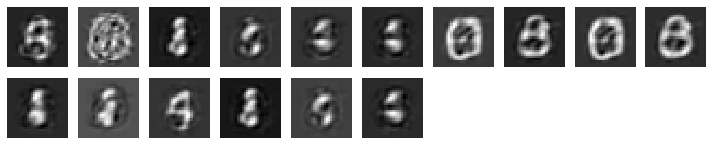

results after iter  7400  loss =  0.2576507329940796  support =  356.75


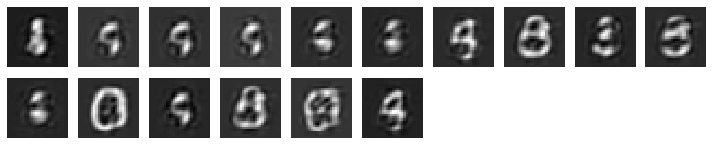

Epoch: 1 	 Discriminator Loss_fake: 0.3407849073410034 	 Discriminator Loss_real: 0.01350296102464199		 Generator Loss: [10.329506, 7.165398, 0.3151492] 		 Reconstructor Loss:0.9883341193199158


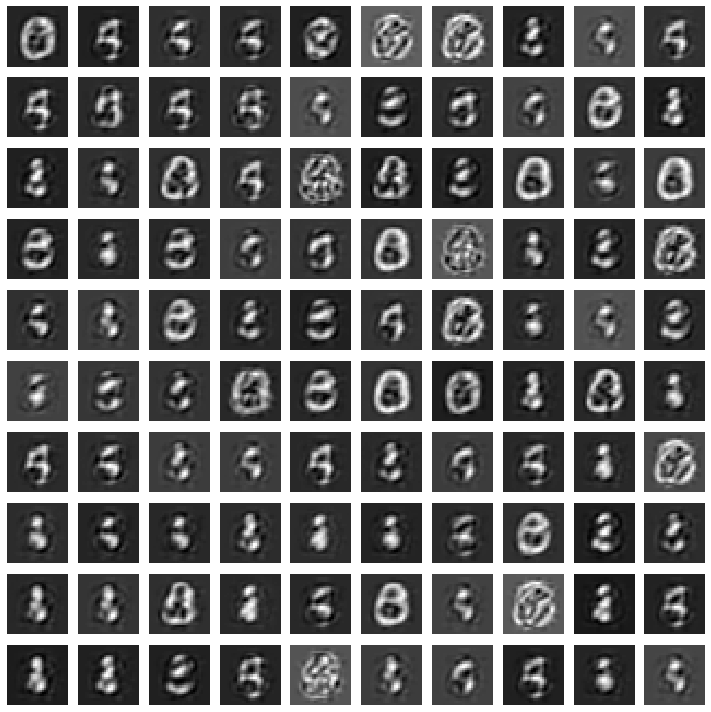

results after iter  7500  loss =  0.232809916138649  support =  475.1875


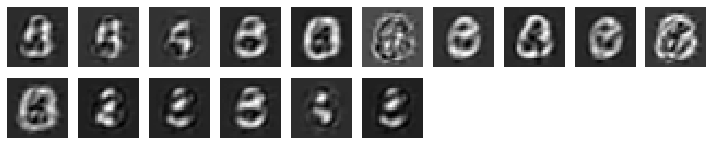

results after iter  7600  loss =  0.23789772391319275  support =  371.5


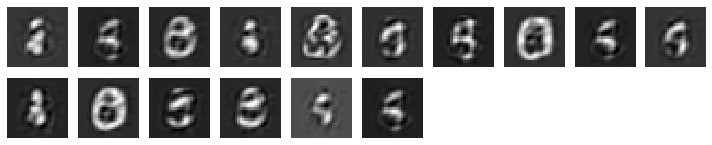

results after iter  7700  loss =  0.22908185422420502  support =  386.5625


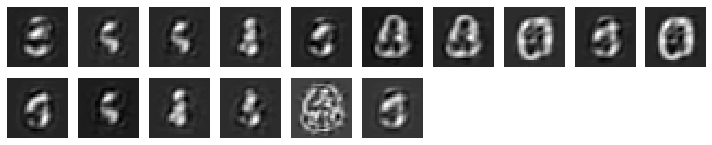

results after iter  7800  loss =  0.22619643807411194  support =  369.9375


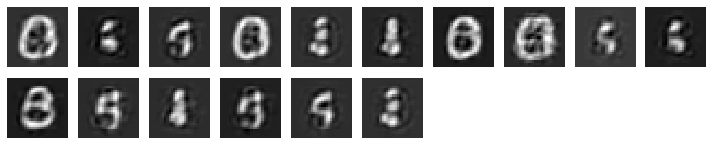

results after iter  7900  loss =  0.24229463934898376  support =  363.0


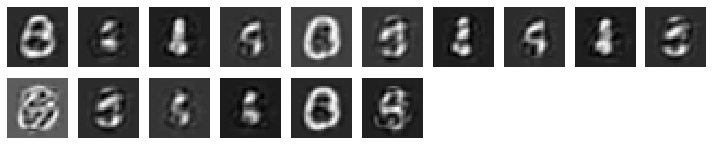

results after iter  8000  loss =  0.22425025701522827  support =  357.1875


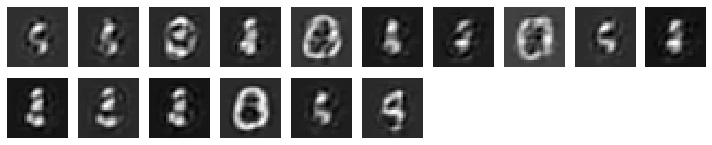

results after iter  8100  loss =  0.22798073291778564  support =  459.125


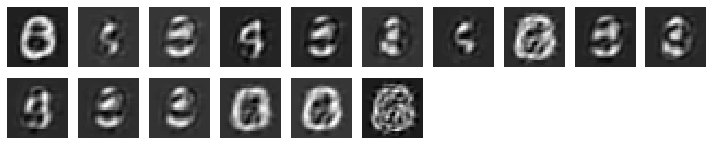

results after iter  8200  loss =  0.25445592403411865  support =  376.25


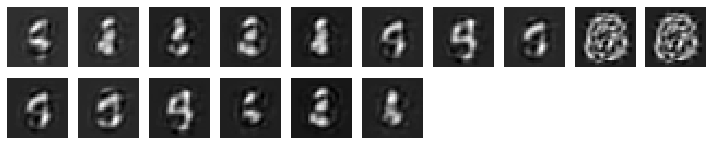

results after iter  8300  loss =  0.22536686062812805  support =  391.75


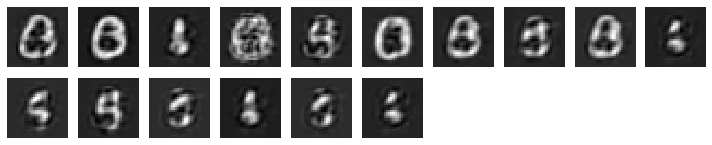

results after iter  8400  loss =  0.23299282789230347  support =  370.6875


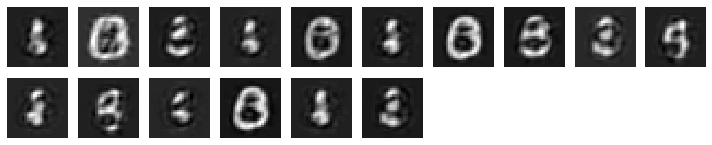

results after iter  8500  loss =  0.2280985414981842  support =  378.8125


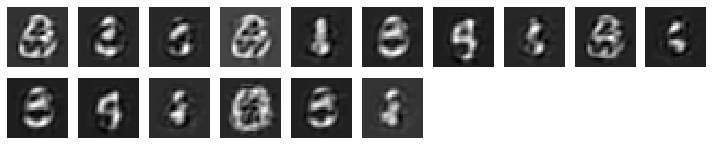

results after iter  8600  loss =  0.21870070695877075  support =  351.125


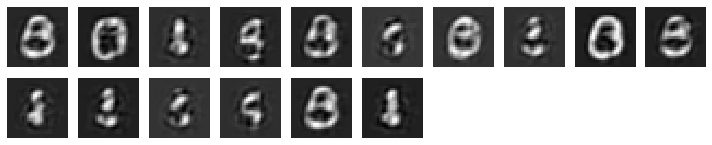

results after iter  8700  loss =  0.2233121693134308  support =  363.0


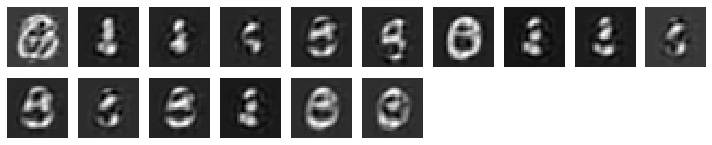

results after iter  8800  loss =  0.23345321416854858  support =  380.4375


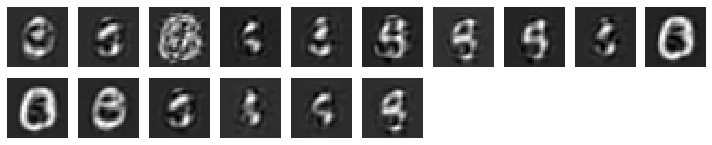

results after iter  8900  loss =  0.24086707830429077  support =  354.125


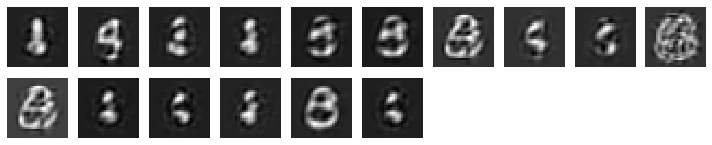

results after iter  9000  loss =  0.22025179862976074  support =  435.5


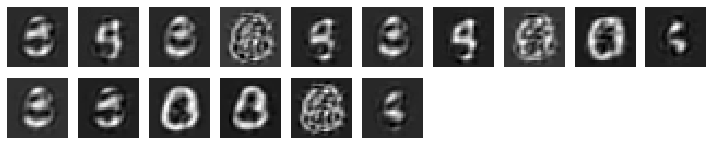

results after iter  9100  loss =  0.2252521812915802  support =  370.125


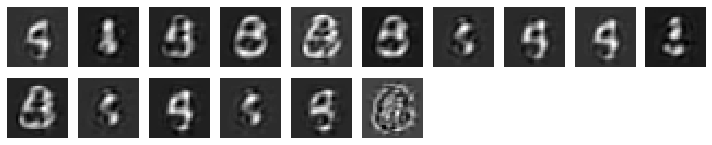

results after iter  9200  loss =  0.26224029064178467  support =  331.8125


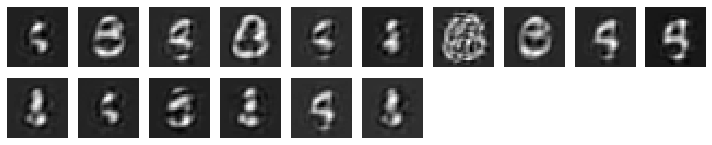

results after iter  9300  loss =  0.24913644790649414  support =  416.8125


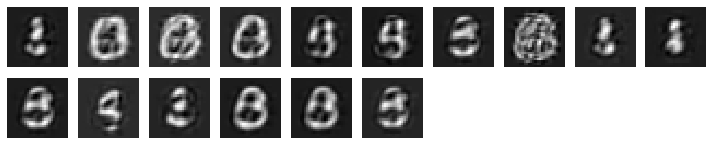

results after iter  9400  loss =  0.2594790756702423  support =  343.5


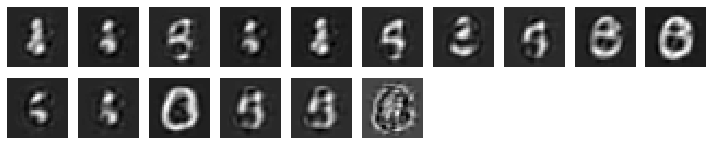

results after iter  9500  loss =  0.24810510873794556  support =  420.125


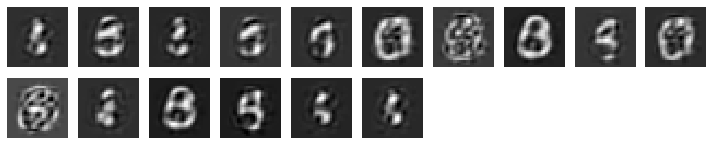

results after iter  9600  loss =  0.24486684799194336  support =  369.8125


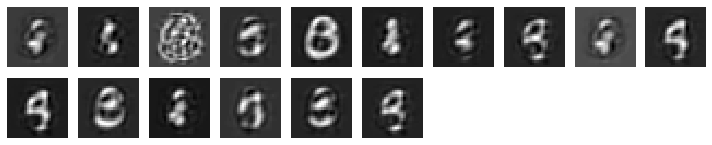

results after iter  9700  loss =  0.22320157289505005  support =  400.0625


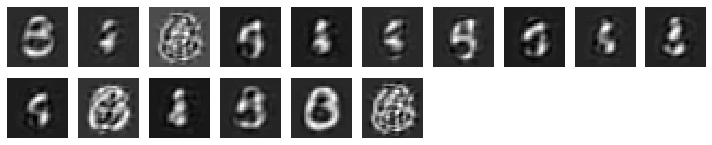

results after iter  9800  loss =  0.2338467836380005  support =  389.25


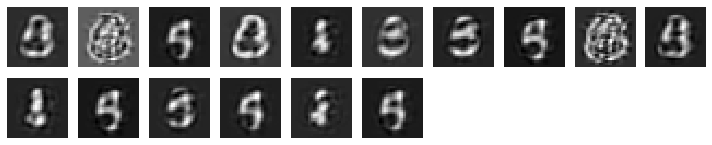

results after iter  9900  loss =  0.25457072257995605  support =  370.375


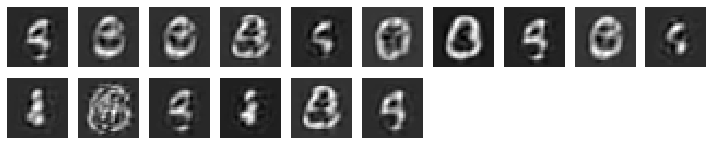

results after iter  10000  loss =  0.2774769365787506  support =  351.875


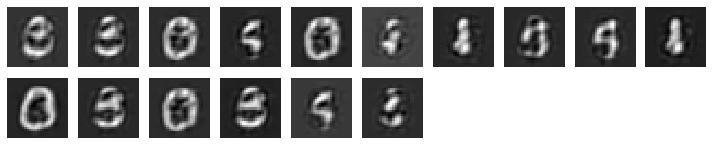

results after iter  10100  loss =  0.2591736912727356  support =  336.875


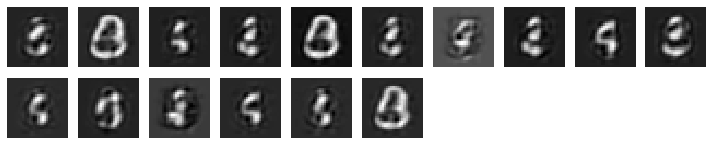

results after iter  10200  loss =  0.2326747477054596  support =  344.625


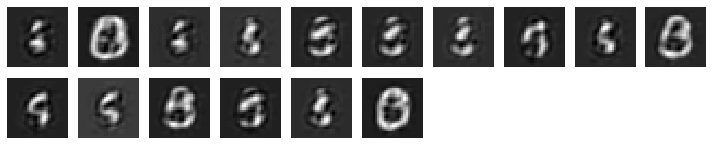

results after iter  10300  loss =  0.2547752261161804  support =  384.75


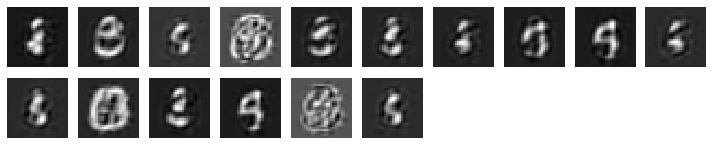

results after iter  10400  loss =  0.25849440693855286  support =  379.3125


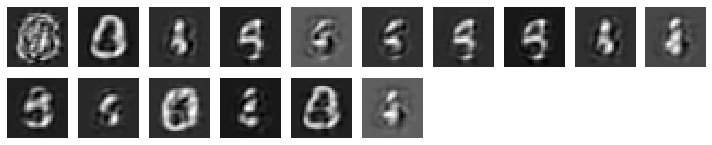

results after iter  10500  loss =  0.2598329484462738  support =  414.1875


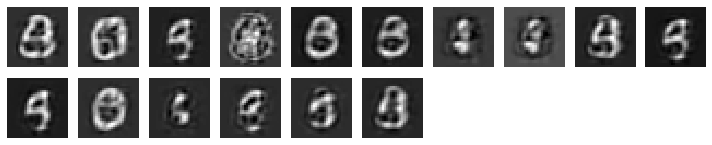

results after iter  10600  loss =  0.24692583084106445  support =  368.4375


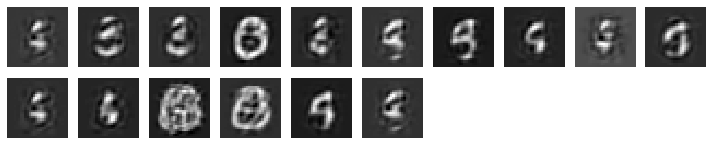

results after iter  10700  loss =  0.2223963588476181  support =  347.0


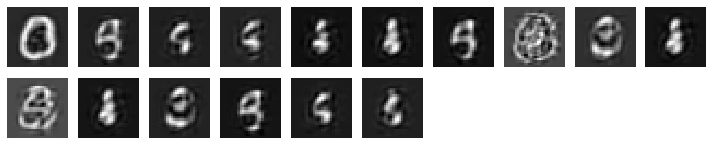

results after iter  10800  loss =  0.2763926386833191  support =  406.5625


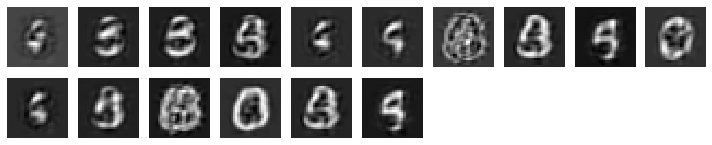

results after iter  10900  loss =  0.25920626521110535  support =  338.375


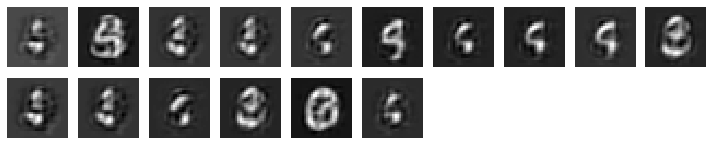

results after iter  11000  loss =  0.23897475004196167  support =  357.9375


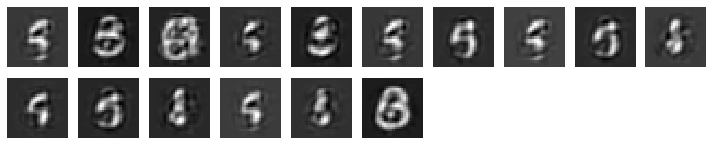

results after iter  11100  loss =  0.22379706799983978  support =  345.9375


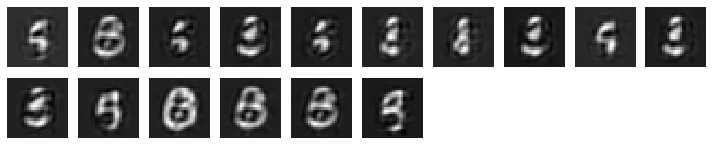

results after iter  11200  loss =  0.21888482570648193  support =  381.625


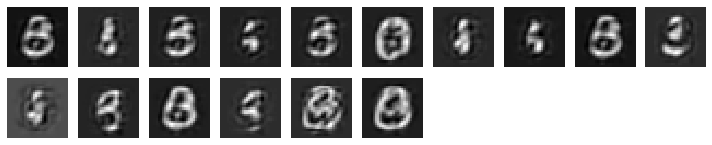

Epoch: 2 	 Discriminator Loss_fake: 0.34852445125579834 	 Discriminator Loss_real: 0.017213545739650726		 Generator Loss: [8.401648, 5.9325056, 0.24553728] 		 Reconstructor Loss:0.9666565656661987


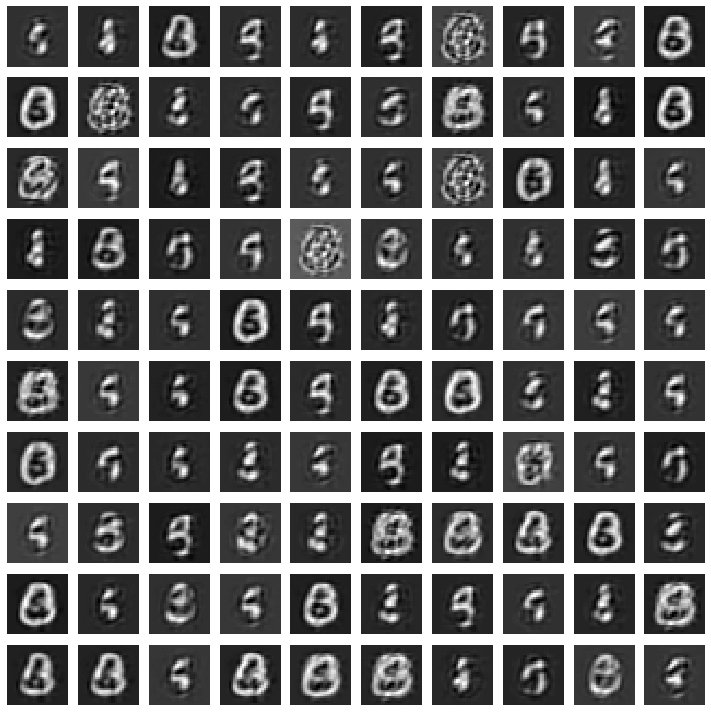

results after iter  11300  loss =  0.21799692511558533  support =  337.875


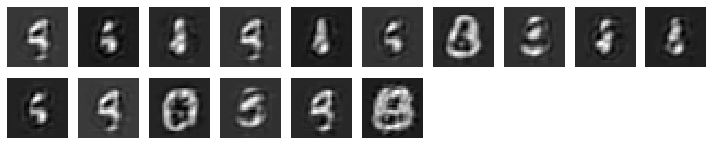

results after iter  11400  loss =  0.22412431240081787  support =  378.0


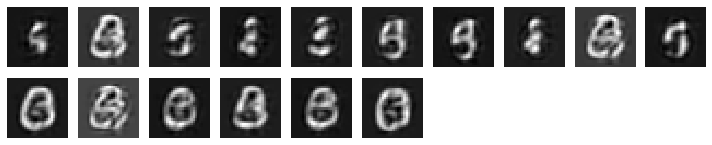

results after iter  11500  loss =  0.2383958101272583  support =  367.625


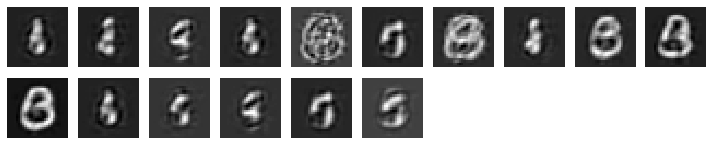

results after iter  11600  loss =  0.24437153339385986  support =  362.9375


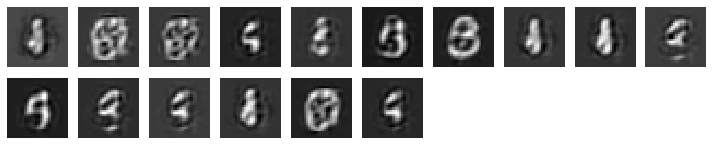

results after iter  11700  loss =  0.24303817749023438  support =  397.5


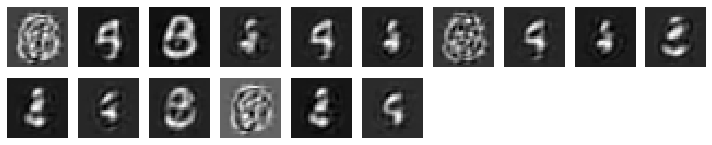

results after iter  11800  loss =  0.2422516942024231  support =  382.375


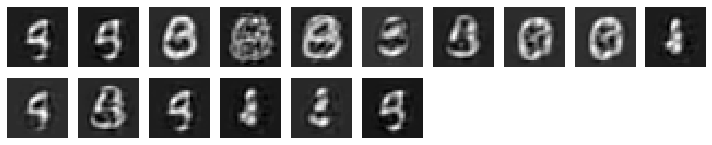

results after iter  11900  loss =  0.2502565383911133  support =  421.9375


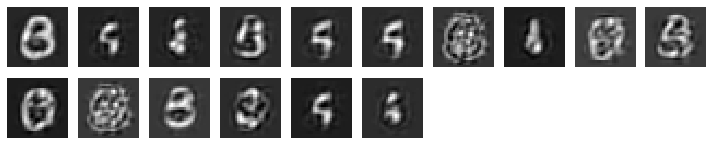

results after iter  12000  loss =  0.2313287854194641  support =  444.75


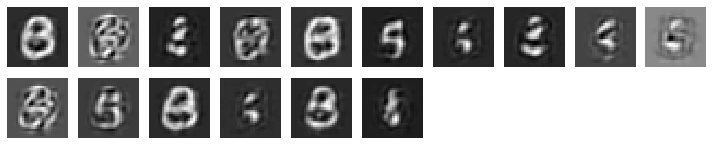

results after iter  12100  loss =  0.2121271938085556  support =  335.3125


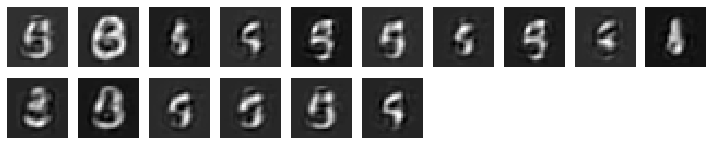

results after iter  12200  loss =  0.23510058224201202  support =  365.375


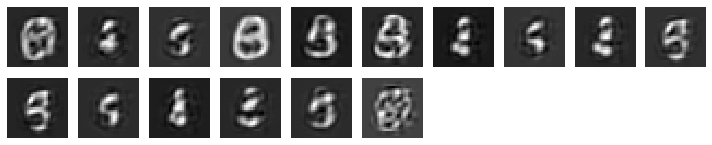

results after iter  12300  loss =  0.24152226746082306  support =  353.4375


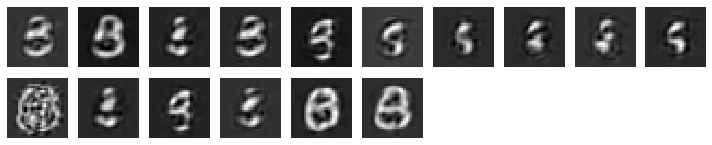

results after iter  12400  loss =  0.21114176511764526  support =  429.5


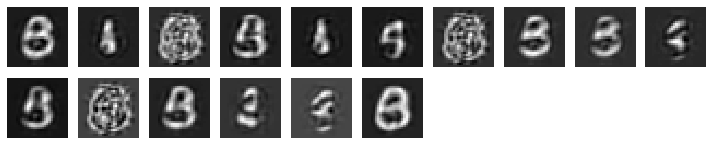

results after iter  12500  loss =  0.2556118667125702  support =  390.9375


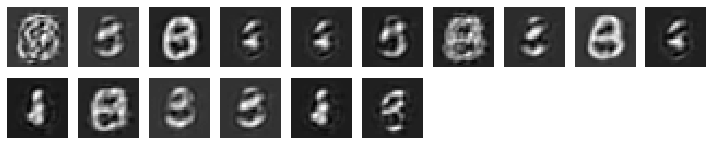

results after iter  12600  loss =  0.23254019021987915  support =  333.6875


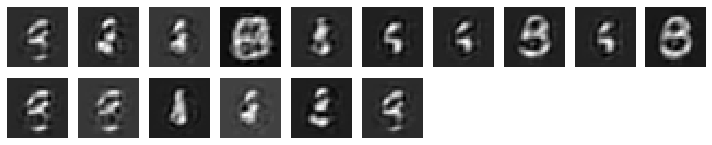

results after iter  12700  loss =  0.2924719452857971  support =  324.0625


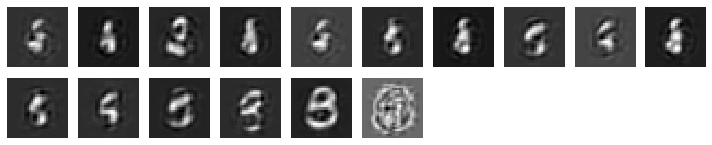

results after iter  12800  loss =  0.24420630931854248  support =  358.125


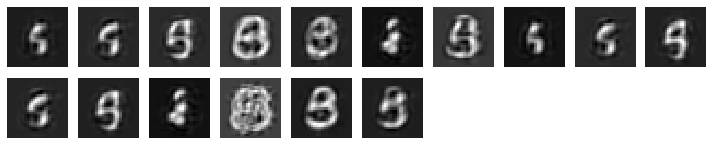

results after iter  12900  loss =  0.22890131175518036  support =  363.1875


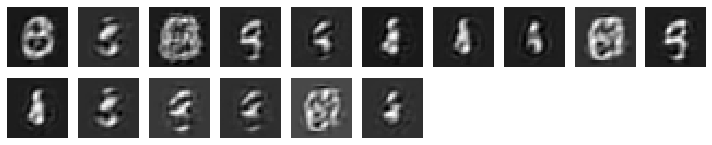

results after iter  13000  loss =  0.24229606986045837  support =  388.125


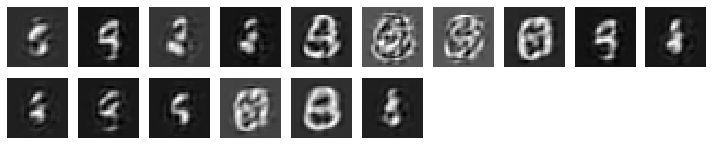

results after iter  13100  loss =  0.23211723566055298  support =  359.8125


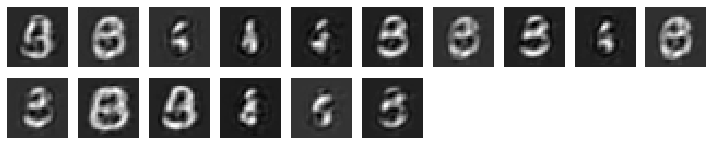

results after iter  13200  loss =  0.21929417550563812  support =  326.4375


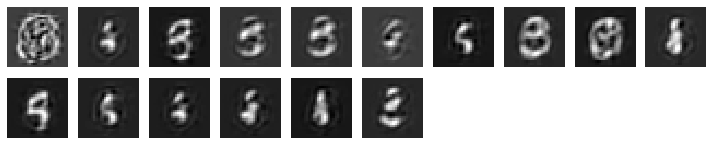

results after iter  13300  loss =  0.2170274555683136  support =  380.5


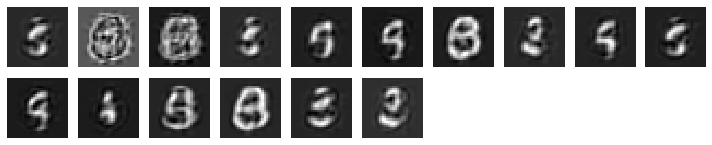

results after iter  13400  loss =  0.24869397282600403  support =  345.375


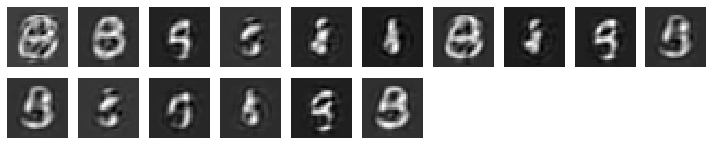

results after iter  13500  loss =  0.2488916516304016  support =  405.8125


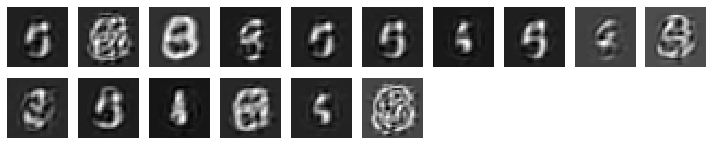

results after iter  13600  loss =  0.2317303717136383  support =  318.0625


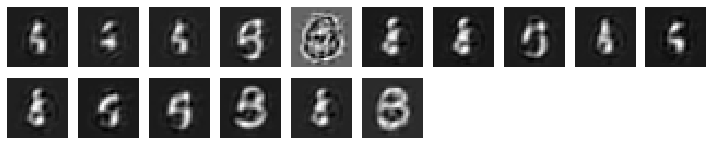

results after iter  13700  loss =  0.23569759726524353  support =  321.5


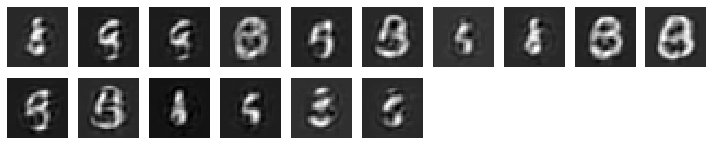

results after iter  13800  loss =  0.245143324136734  support =  398.8125


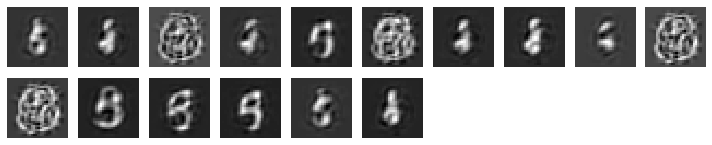

results after iter  13900  loss =  0.22831960022449493  support =  340.125


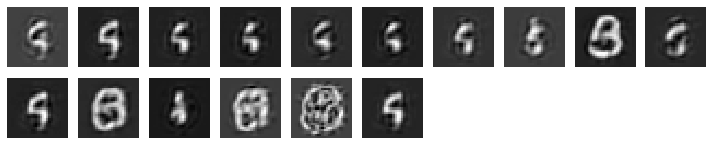

results after iter  14000  loss =  0.23736244440078735  support =  349.4375


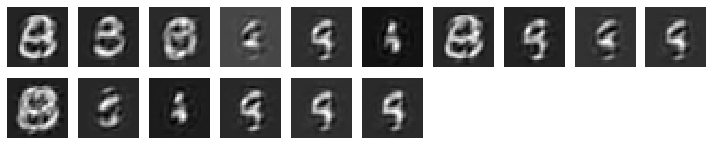

results after iter  14100  loss =  0.23577485978603363  support =  322.875


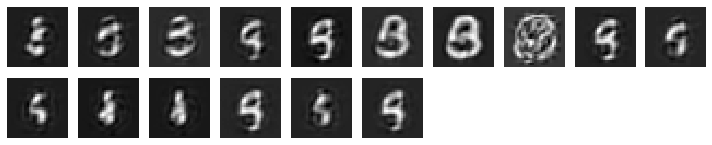

results after iter  14200  loss =  0.27579158544540405  support =  362.5


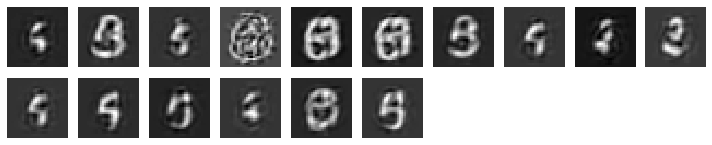

results after iter  14300  loss =  0.2514919638633728  support =  400.1875


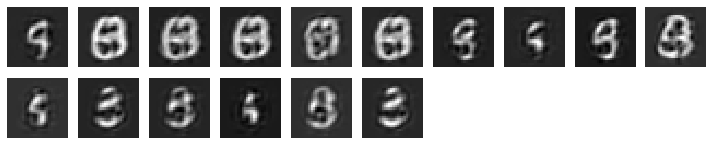

results after iter  14400  loss =  0.2815271019935608  support =  392.5625


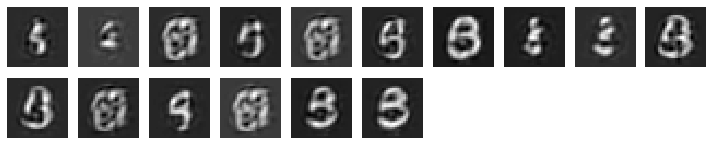

results after iter  14500  loss =  0.2530826926231384  support =  348.1875


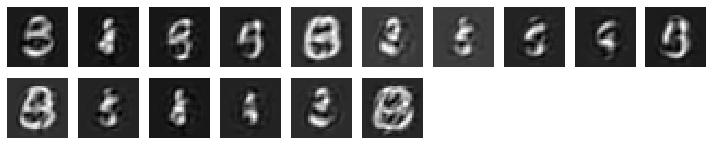

results after iter  14600  loss =  0.2688446044921875  support =  381.8125


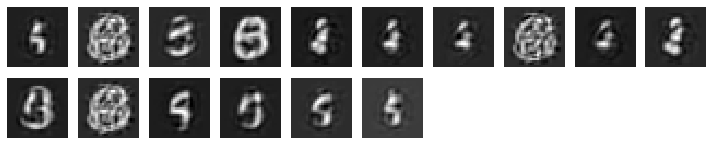

results after iter  14700  loss =  0.2574129104614258  support =  363.5


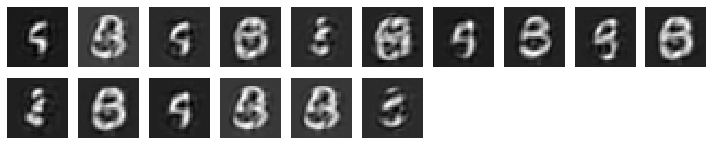

results after iter  14800  loss =  0.3027345538139343  support =  334.8125


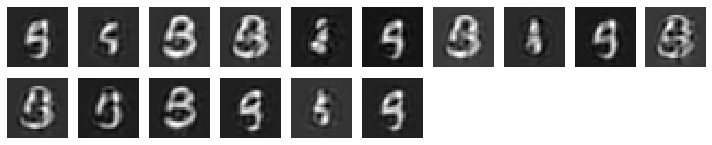

results after iter  14900  loss =  0.3089280128479004  support =  427.75


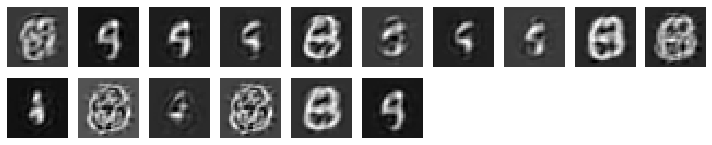

Epoch: 3 	 Discriminator Loss_fake: 0.3459850251674652 	 Discriminator Loss_real: 0.015294509008526802		 Generator Loss: [9.029731, 6.798423, 0.2217201] 		 Reconstructor Loss:0.9520173072814941


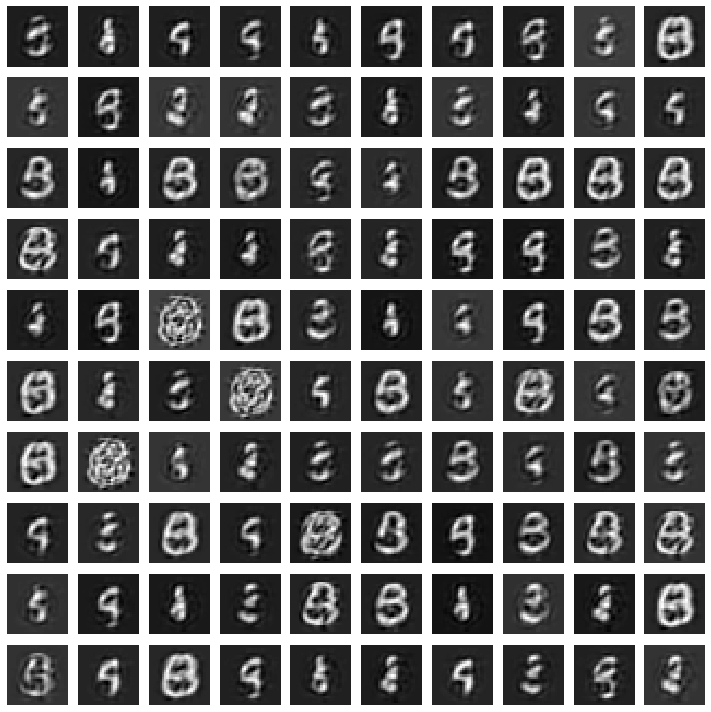

results after iter  15000  loss =  0.2675371766090393  support =  281.5625


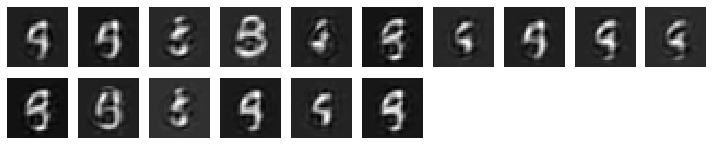

results after iter  15100  loss =  0.2610614001750946  support =  372.3125


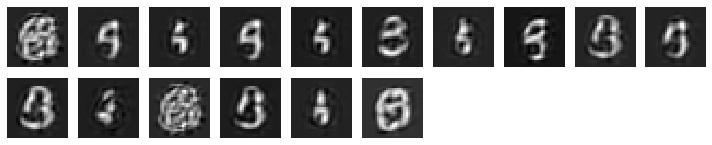

results after iter  15200  loss =  0.2823871374130249  support =  340.625


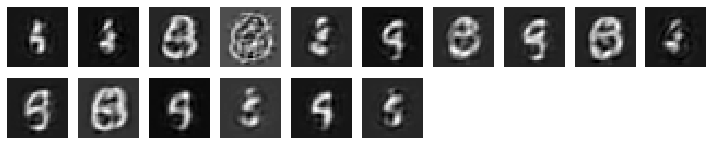

results after iter  15300  loss =  0.2684341073036194  support =  334.375


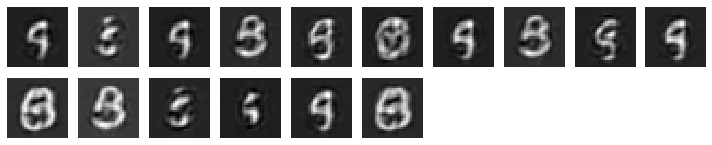

results after iter  15400  loss =  0.2769886553287506  support =  375.25


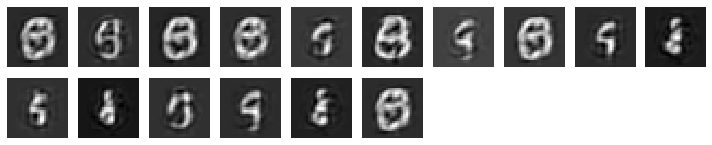

results after iter  15500  loss =  0.26647886633872986  support =  339.1875


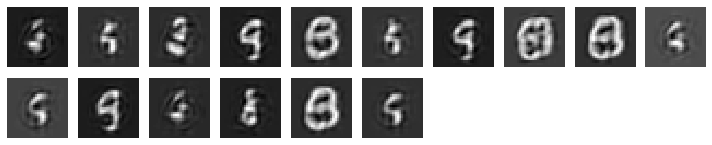

results after iter  15600  loss =  0.2535918354988098  support =  385.9375


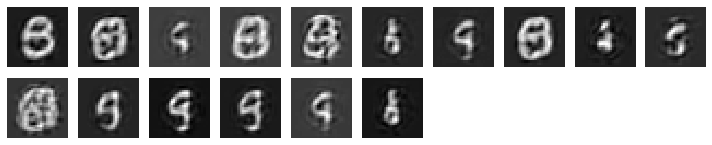

results after iter  15700  loss =  0.2389400452375412  support =  370.5


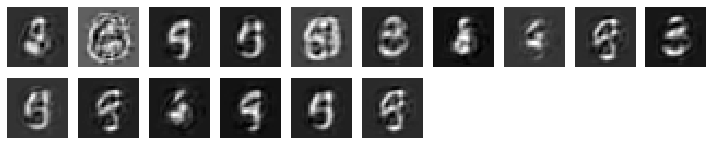

results after iter  15800  loss =  0.24309253692626953  support =  476.5


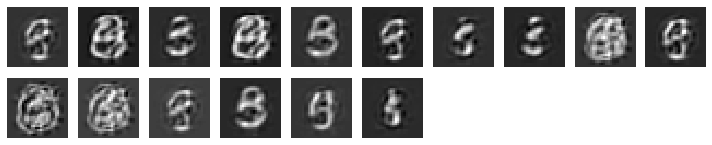

results after iter  15900  loss =  0.29954713582992554  support =  377.75


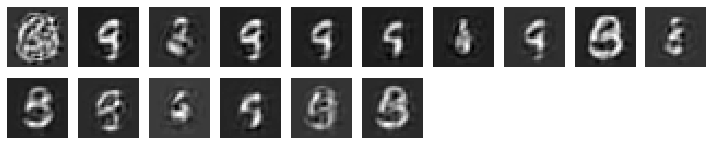

results after iter  16000  loss =  0.25287380814552307  support =  417.5625


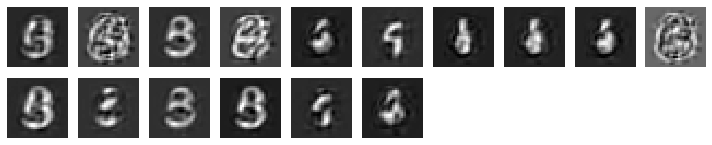

results after iter  16100  loss =  0.24799001216888428  support =  378.5


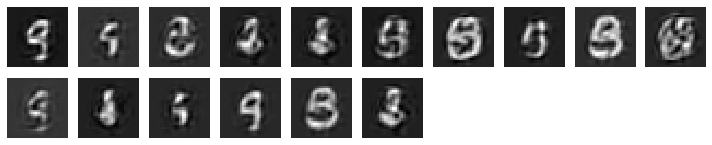

results after iter  16200  loss =  0.24387335777282715  support =  371.75


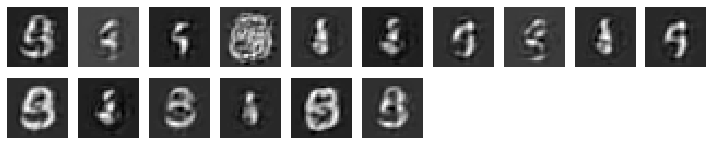

results after iter  16300  loss =  0.23422229290008545  support =  361.4375


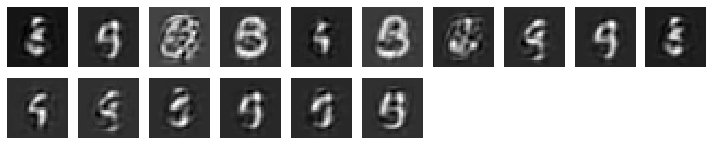

results after iter  16400  loss =  0.236007958650589  support =  346.0625


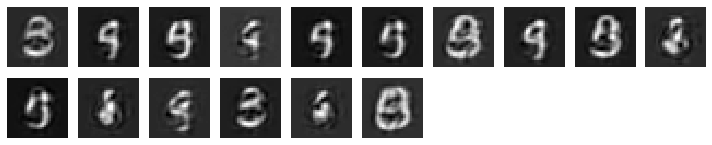

results after iter  16500  loss =  0.2243034392595291  support =  369.375


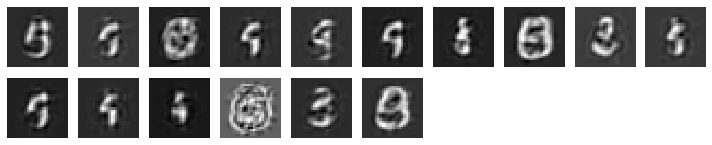

results after iter  16600  loss =  0.22458672523498535  support =  343.625


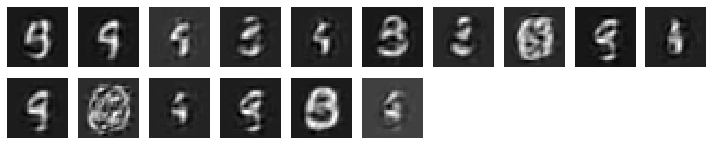

results after iter  16700  loss =  0.2190895825624466  support =  406.25


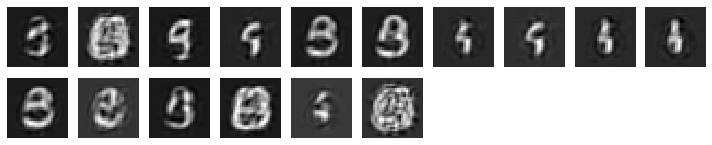

results after iter  16800  loss =  0.2706669867038727  support =  422.25


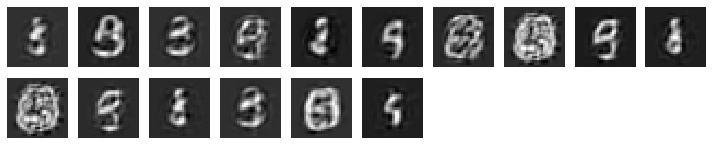

results after iter  16900  loss =  0.2195020616054535  support =  438.75


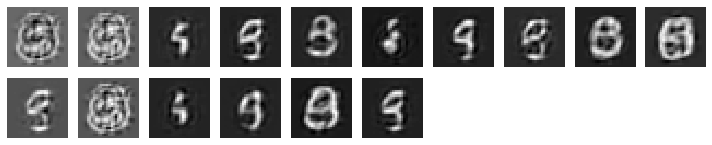

results after iter  17000  loss =  0.21885624527931213  support =  310.8125


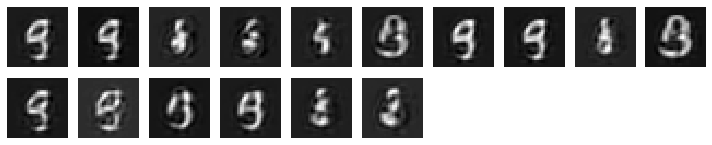

results after iter  17100  loss =  0.21356141567230225  support =  453.6875


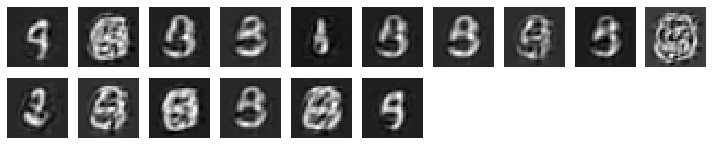

results after iter  17200  loss =  0.24051210284233093  support =  307.5


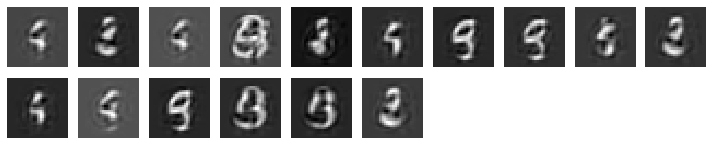

results after iter  17300  loss =  0.27103671431541443  support =  353.25


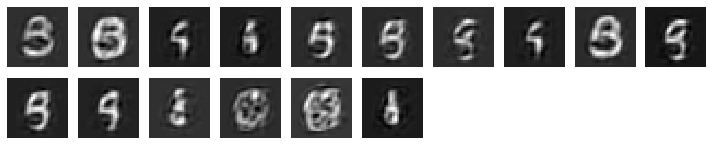

results after iter  17400  loss =  0.22167231142520905  support =  370.625


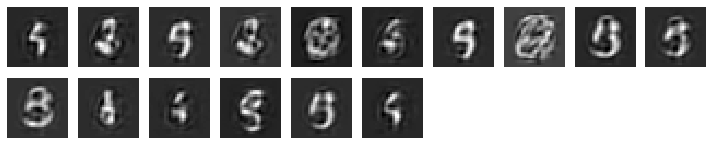

results after iter  17500  loss =  0.19927722215652466  support =  388.125


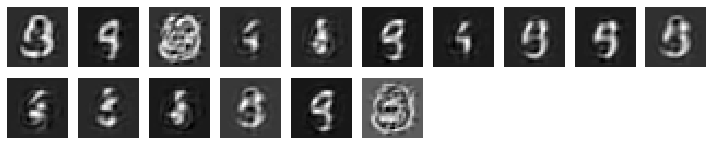

results after iter  17600  loss =  0.2114306390285492  support =  396.375


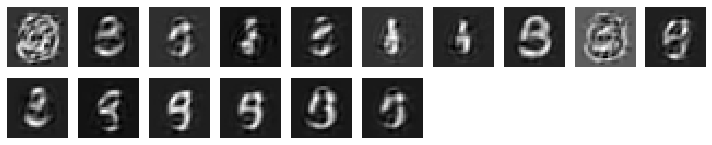

results after iter  17700  loss =  0.20011305809020996  support =  358.5625


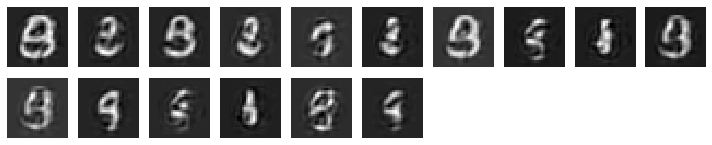

results after iter  17800  loss =  0.1948738694190979  support =  395.375


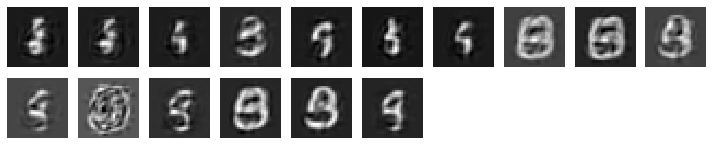

results after iter  17900  loss =  0.20766857266426086  support =  395.9375


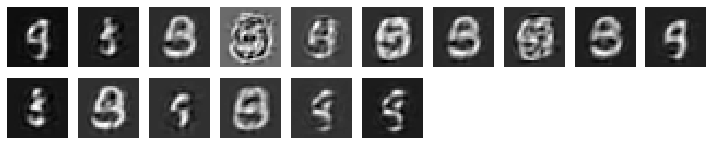

results after iter  18000  loss =  0.23310840129852295  support =  391.25


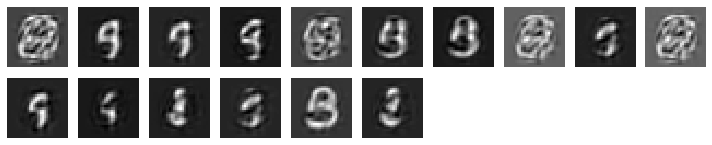

results after iter  18100  loss =  0.22322285175323486  support =  394.4375


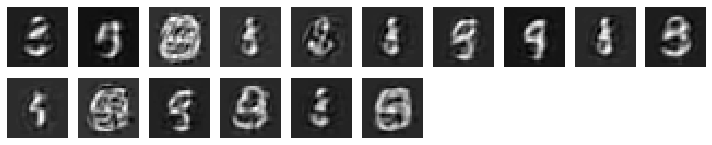

results after iter  18200  loss =  0.23371736705303192  support =  378.375


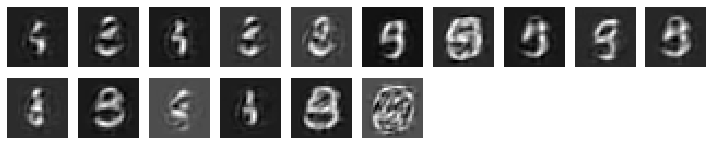

results after iter  18300  loss =  0.22135940194129944  support =  345.375


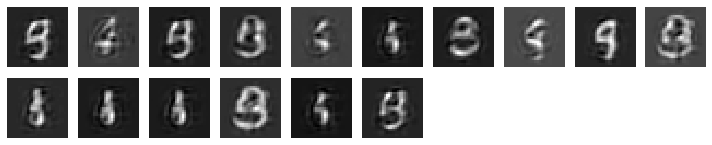

results after iter  18400  loss =  0.22552049160003662  support =  344.0


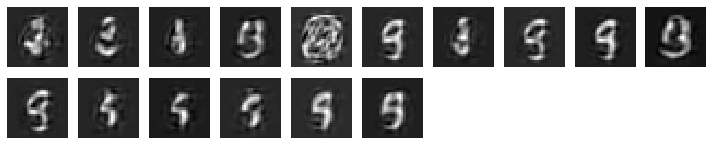

results after iter  18500  loss =  0.21929451823234558  support =  399.0


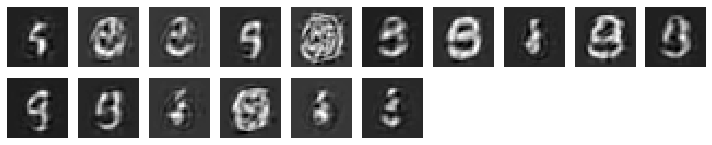

results after iter  18600  loss =  0.2522205114364624  support =  387.625


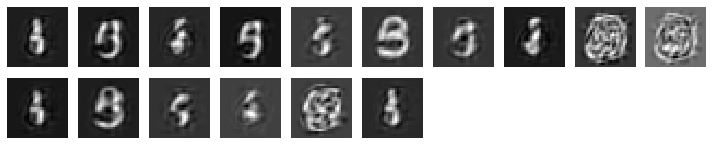

results after iter  18700  loss =  0.2364988923072815  support =  397.9375


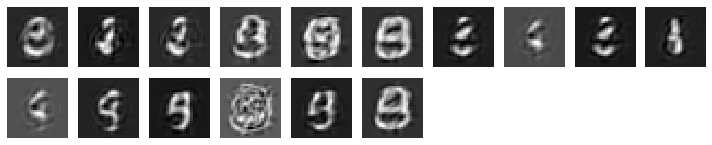

Epoch: 4 	 Discriminator Loss_fake: 0.33384308218955994 	 Discriminator Loss_real: 0.00899304635822773		 Generator Loss: [9.269721, 6.6886477, 0.25736248] 		 Reconstructor Loss:1.0156608819961548


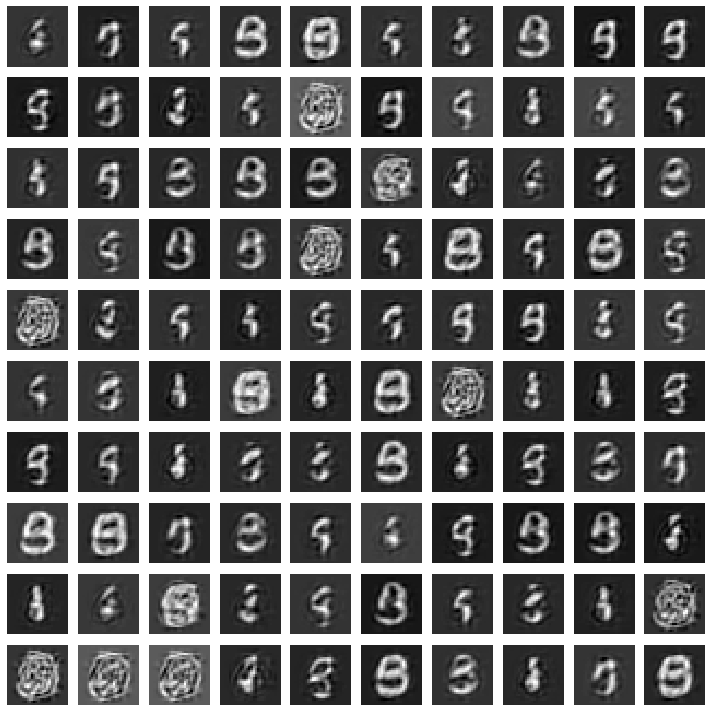

results after iter  18800  loss =  0.24043340981006622  support =  362.3125


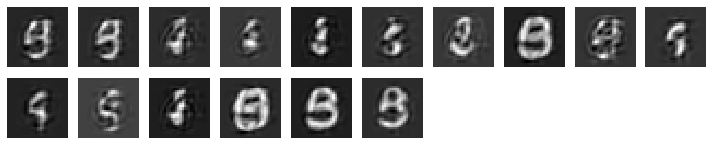

results after iter  18900  loss =  0.23372076451778412  support =  417.375


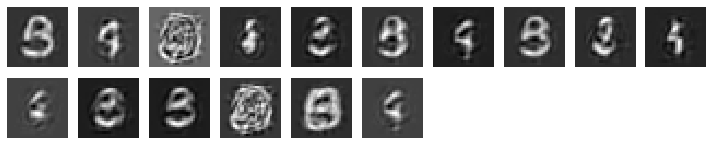

results after iter  19000  loss =  0.23582947254180908  support =  403.0


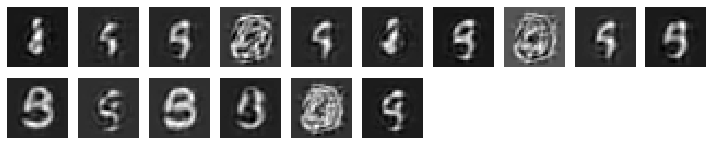

results after iter  19100  loss =  0.27657052874565125  support =  336.4375


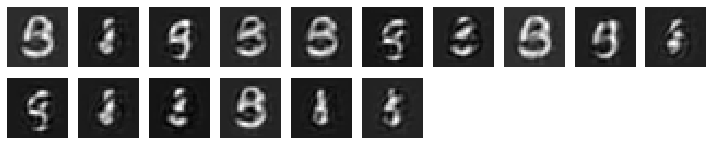

results after iter  19200  loss =  0.24895158410072327  support =  344.0


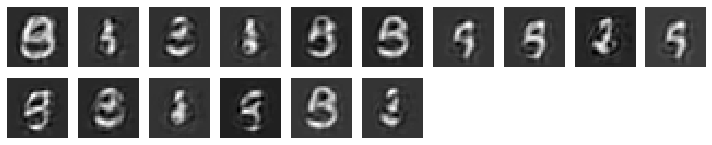

results after iter  19300  loss =  0.23520725965499878  support =  389.875


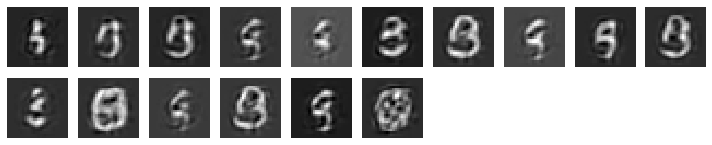

results after iter  19400  loss =  0.23176303505897522  support =  407.5


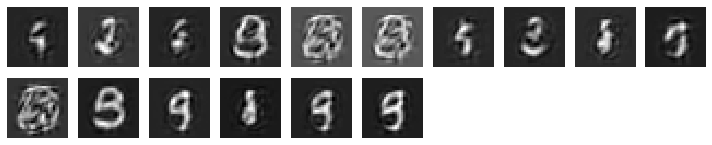

results after iter  19500  loss =  0.2617642283439636  support =  355.625


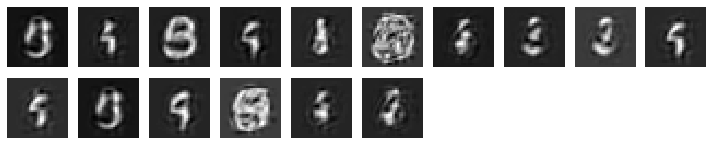

results after iter  19600  loss =  0.22559960186481476  support =  359.875


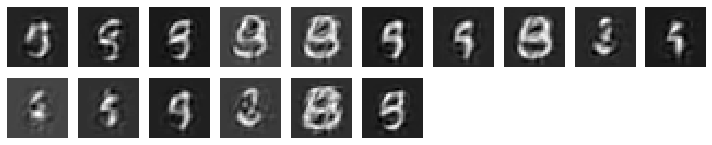

results after iter  19700  loss =  0.25688475370407104  support =  351.9375


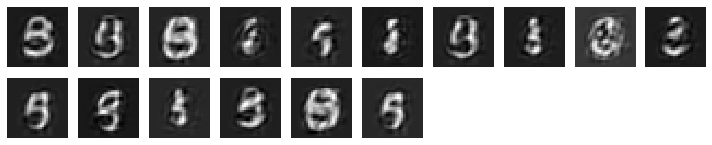

results after iter  19800  loss =  0.2208525389432907  support =  332.9375


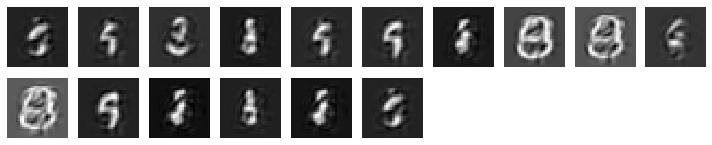

results after iter  19900  loss =  0.22228845953941345  support =  322.1875


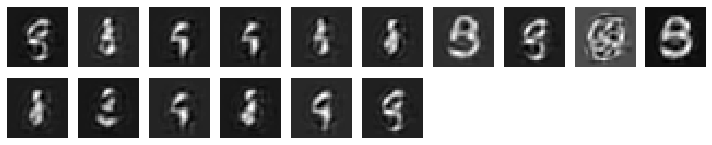

results after iter  20000  loss =  0.24885275959968567  support =  424.0625


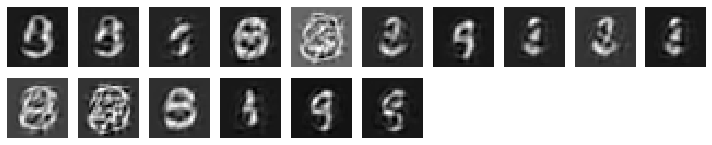

results after iter  20100  loss =  0.238697350025177  support =  339.4375


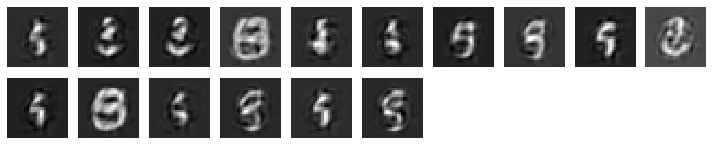

results after iter  20200  loss =  0.24200642108917236  support =  395.5


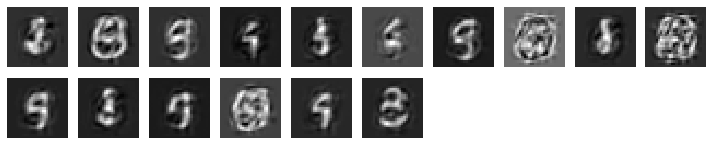

results after iter  20300  loss =  0.24067634344100952  support =  357.0


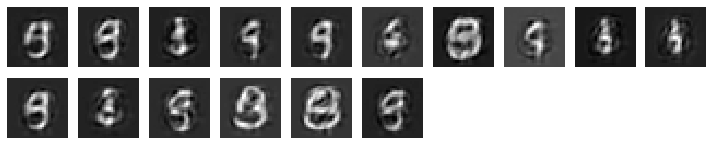

results after iter  20400  loss =  0.2659876048564911  support =  341.5625


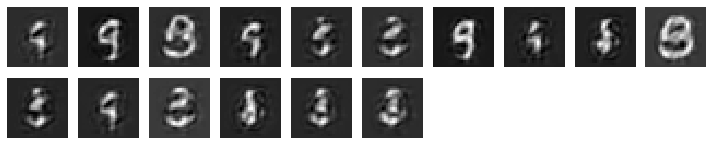

results after iter  20500  loss =  0.22585326433181763  support =  376.3125


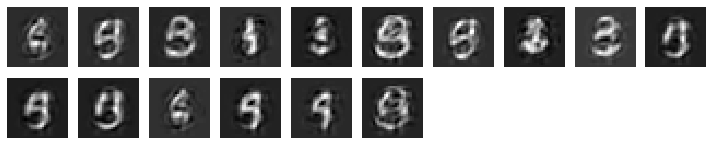

results after iter  20600  loss =  0.24089837074279785  support =  414.8125


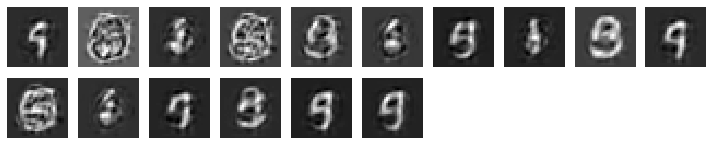

results after iter  20700  loss =  0.24138811230659485  support =  354.0625


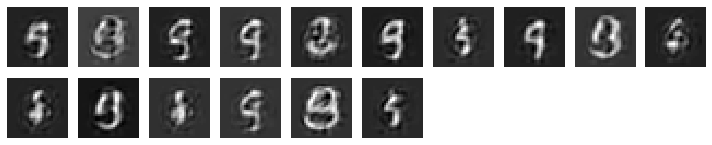

results after iter  20800  loss =  0.2280157506465912  support =  376.8125


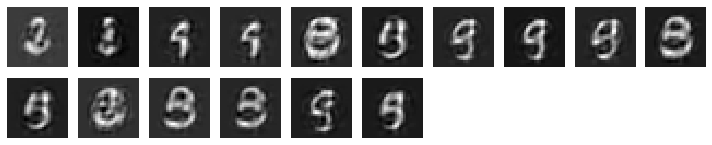

results after iter  20900  loss =  0.21918249130249023  support =  304.75


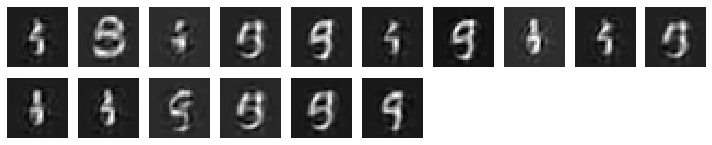

results after iter  21000  loss =  0.20903614163398743  support =  369.9375


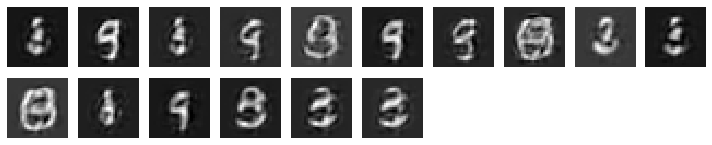

results after iter  21100  loss =  0.2121639847755432  support =  396.625


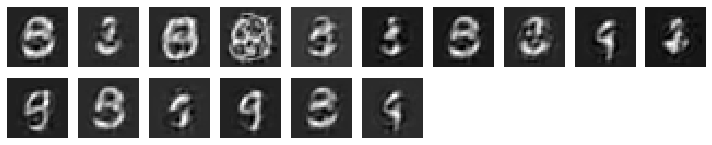

results after iter  21200  loss =  0.1994701772928238  support =  345.3125


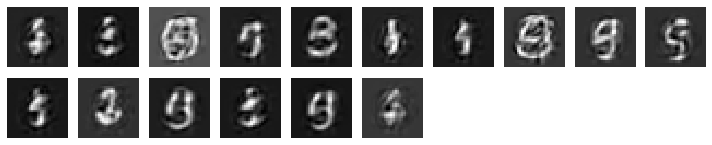

results after iter  21300  loss =  0.1972978115081787  support =  389.3125


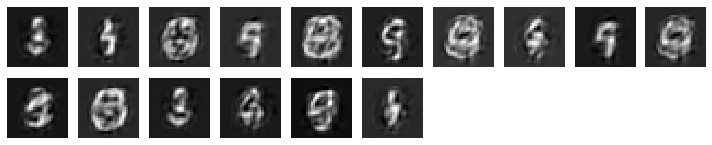

results after iter  21400  loss =  0.2070143073797226  support =  382.8125


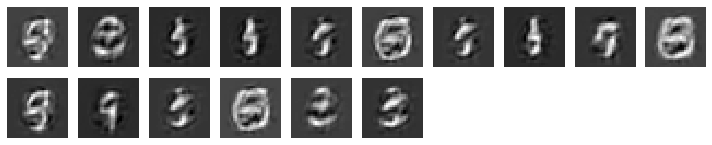

results after iter  21500  loss =  0.1974269151687622  support =  411.5625


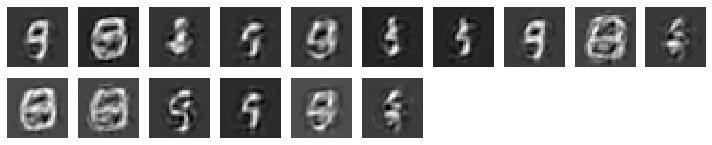

results after iter  21600  loss =  0.2253706157207489  support =  379.5


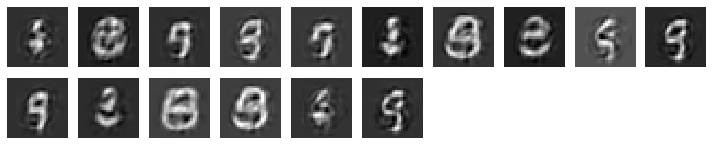

results after iter  21700  loss =  0.21710097789764404  support =  434.0


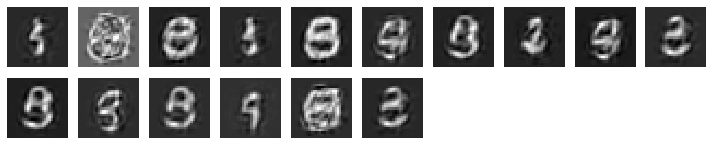

results after iter  21800  loss =  0.2171376496553421  support =  351.25


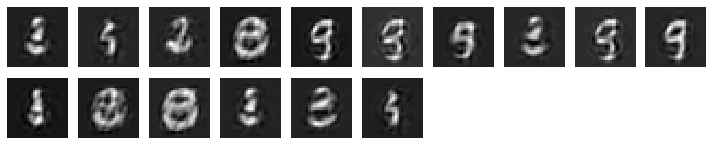

results after iter  21900  loss =  0.30652278661727905  support =  368.8125


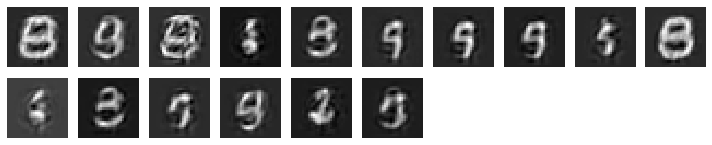

results after iter  22000  loss =  0.26533210277557373  support =  331.9375


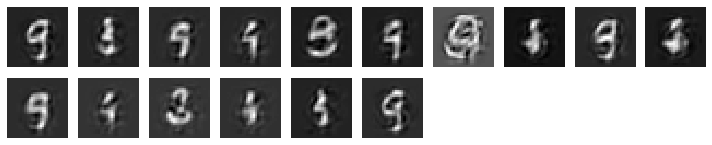

results after iter  22100  loss =  0.2549065947532654  support =  408.1875


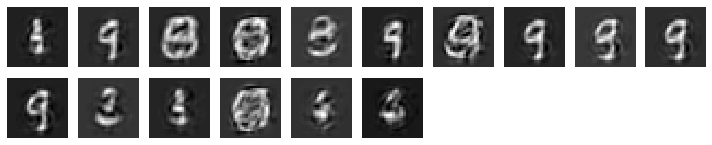

results after iter  22200  loss =  0.24232986569404602  support =  410.3125


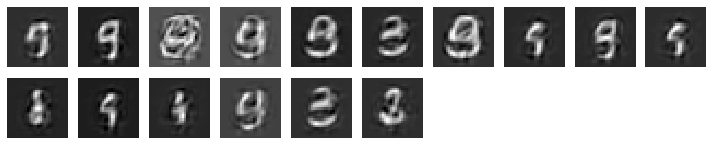

results after iter  22300  loss =  0.25292062759399414  support =  391.75


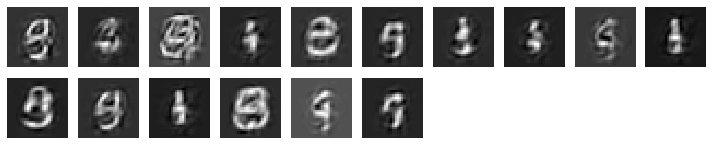

results after iter  22400  loss =  0.21475787460803986  support =  349.5625


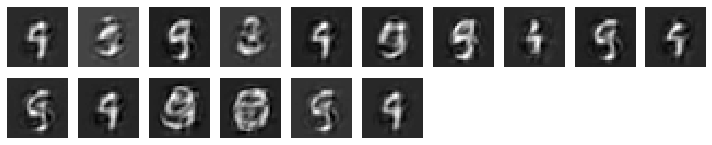

Epoch: 5 	 Discriminator Loss_fake: 0.3376260995864868 	 Discriminator Loss_real: 0.01028215978294611		 Generator Loss: [9.543529, 7.1788087, 0.23554072] 		 Reconstructor Loss:0.9784243702888489


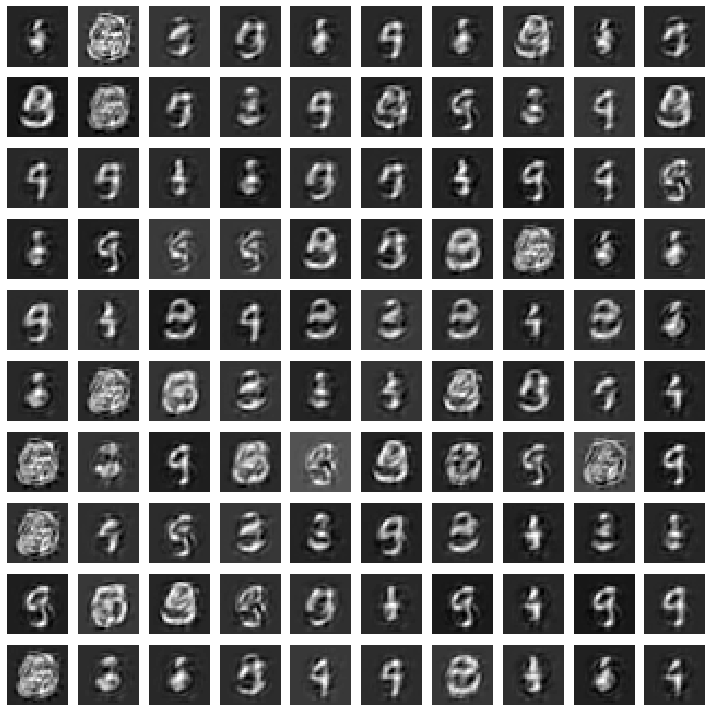

results after iter  22500  loss =  0.21661952137947083  support =  354.125


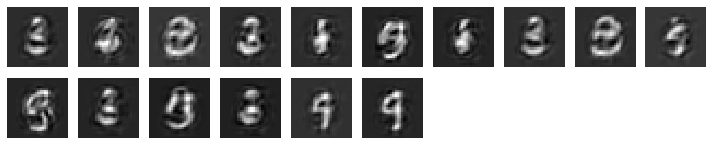

results after iter  22600  loss =  0.21769869327545166  support =  419.1875


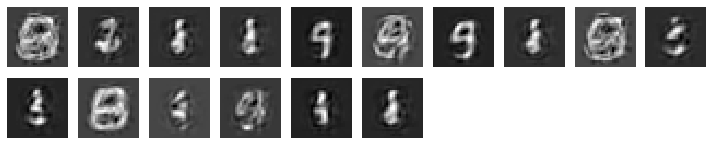

results after iter  22700  loss =  0.22889041900634766  support =  361.0


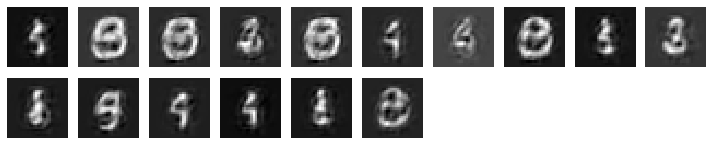

results after iter  22800  loss =  0.21142295002937317  support =  407.25


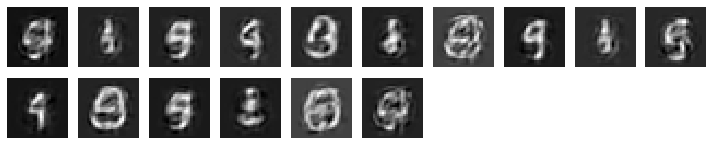

results after iter  22900  loss =  0.20042243599891663  support =  421.625


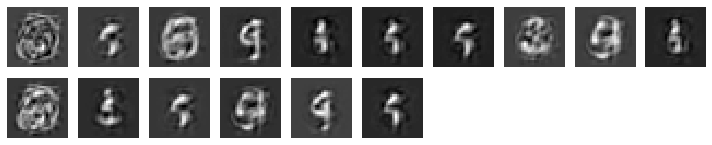

results after iter  23000  loss =  0.22286446392536163  support =  386.875


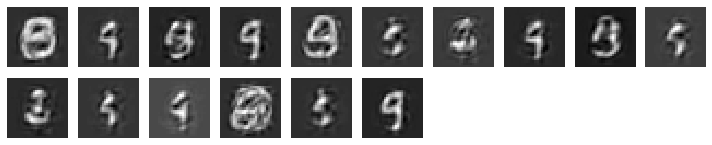

results after iter  23100  loss =  0.21860679984092712  support =  449.4375


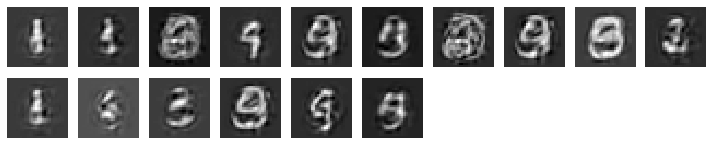

results after iter  23200  loss =  0.18957620859146118  support =  381.4375


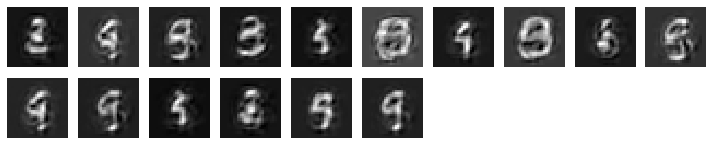

results after iter  23300  loss =  0.18168224394321442  support =  389.125


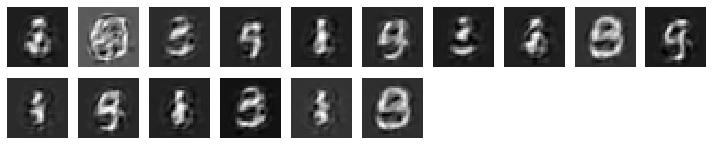

results after iter  23400  loss =  0.163627028465271  support =  439.25


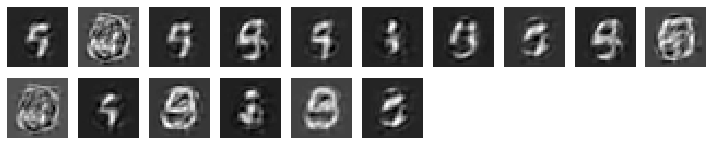

results after iter  23500  loss =  0.18220184743404388  support =  408.875


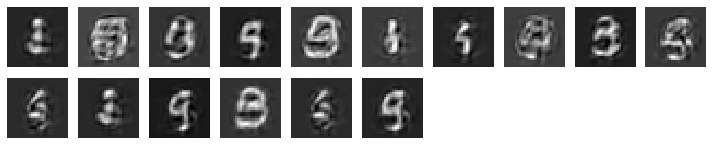

results after iter  23600  loss =  0.19660300016403198  support =  313.6875


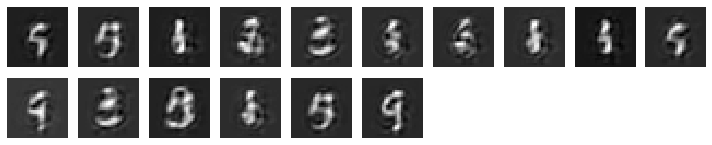

results after iter  23700  loss =  0.2124241292476654  support =  418.4375


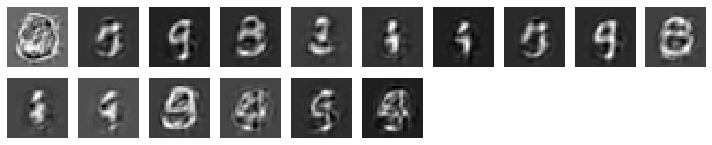

results after iter  23800  loss =  0.20791137218475342  support =  371.125


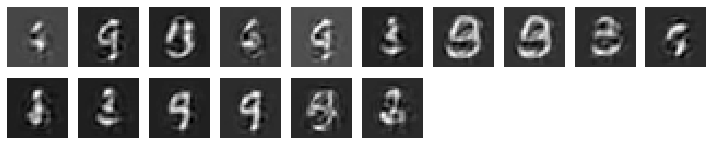

results after iter  23900  loss =  0.21506986021995544  support =  427.0


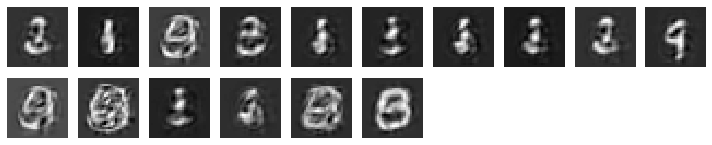

results after iter  24000  loss =  0.26663053035736084  support =  326.75


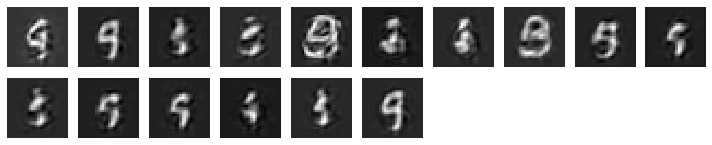

results after iter  24100  loss =  0.2176823765039444  support =  321.25


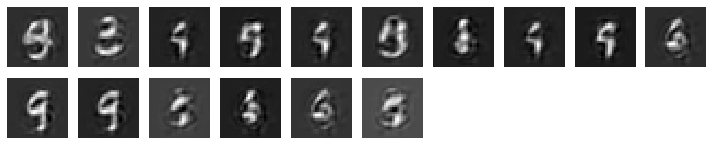

results after iter  24200  loss =  0.21934321522712708  support =  440.9375


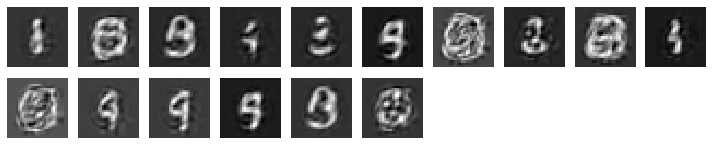

results after iter  24300  loss =  0.2247469127178192  support =  378.375


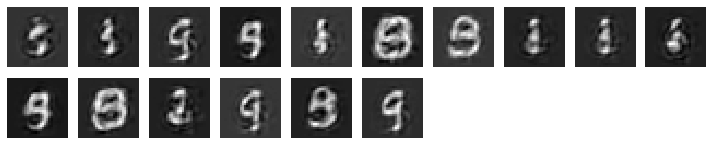

results after iter  24400  loss =  0.19095070660114288  support =  348.875


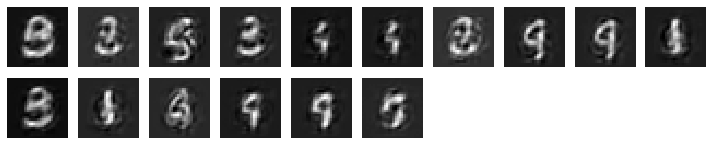

results after iter  24500  loss =  0.17237485945224762  support =  403.0


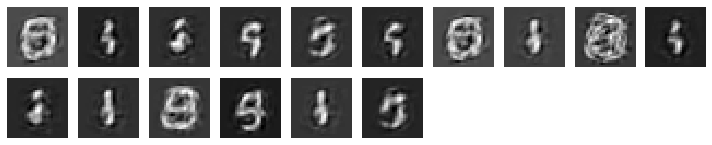

results after iter  24600  loss =  0.17574286460876465  support =  397.375


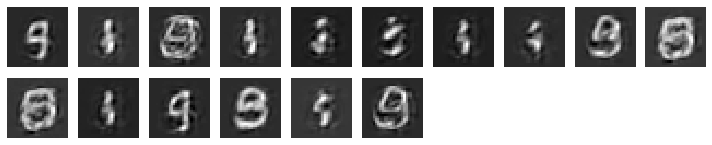

results after iter  24700  loss =  0.18618398904800415  support =  364.5


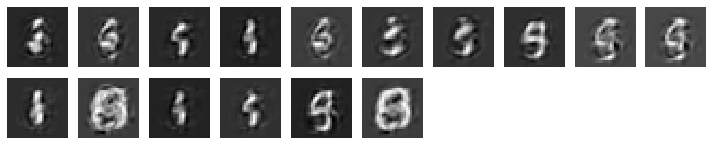

results after iter  24800  loss =  0.1763710379600525  support =  443.625


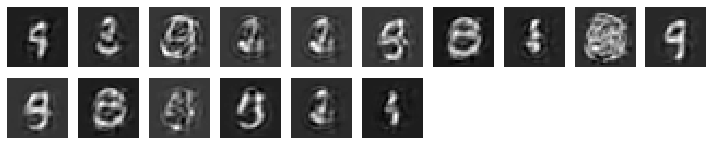

results after iter  24900  loss =  0.17755921185016632  support =  388.0


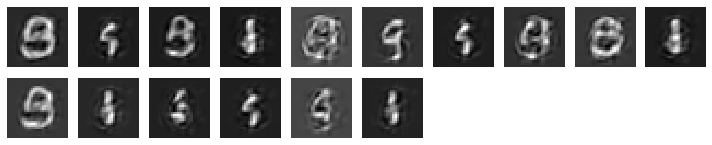

results after iter  25000  loss =  0.1558416485786438  support =  384.6875


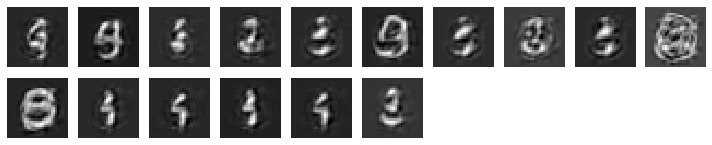

results after iter  25100  loss =  0.13767465949058533  support =  416.125


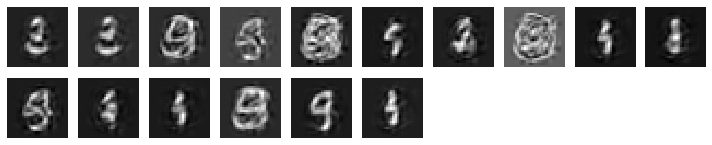

results after iter  25200  loss =  0.15804147720336914  support =  384.4375


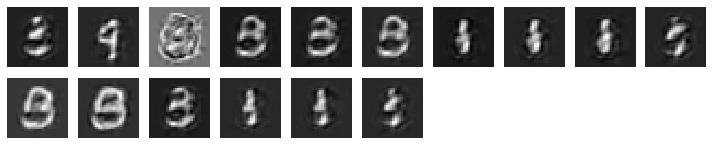

results after iter  25300  loss =  0.16271039843559265  support =  333.0625


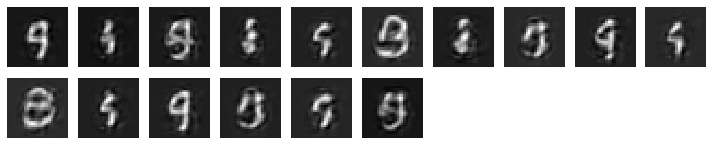

results after iter  25400  loss =  0.1805419921875  support =  398.25


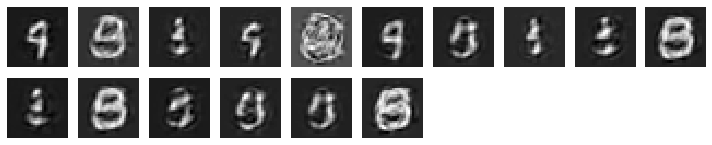

results after iter  25500  loss =  0.165198415517807  support =  381.5625


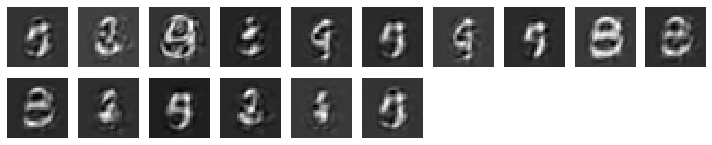

results after iter  25600  loss =  0.16219881176948547  support =  423.1875


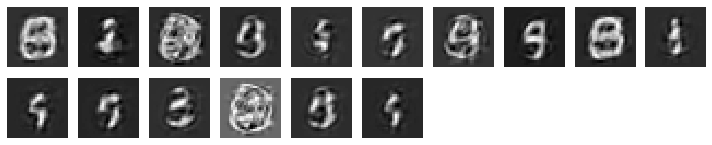

results after iter  25700  loss =  0.17511118948459625  support =  447.6875


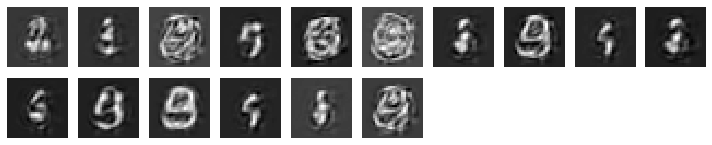

results after iter  25800  loss =  0.2262788861989975  support =  395.1875


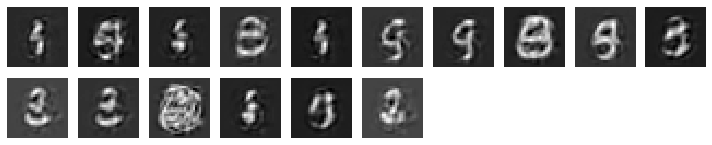

results after iter  25900  loss =  0.17087295651435852  support =  441.125


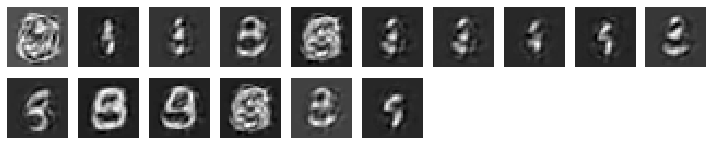

results after iter  26000  loss =  0.14444804191589355  support =  387.375


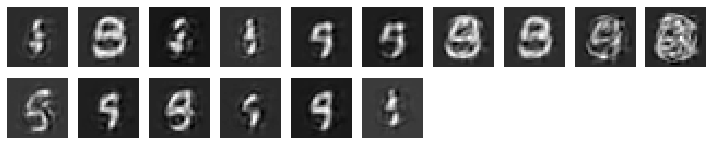

results after iter  26100  loss =  0.15751560032367706  support =  387.125


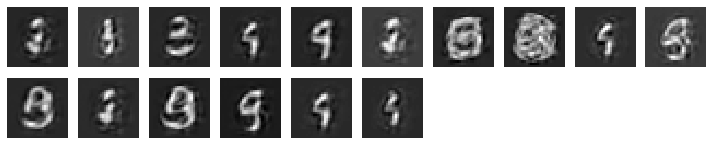

results after iter  26200  loss =  0.15933066606521606  support =  444.875


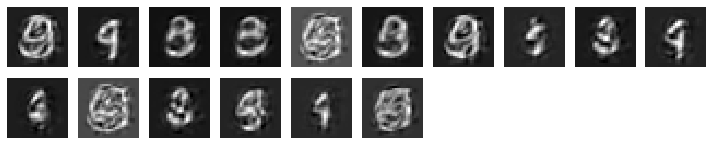

Epoch: 6 	 Discriminator Loss_fake: 0.33662083745002747 	 Discriminator Loss_real: 0.010533389635384083		 Generator Loss: [9.945682, 7.5555935, 0.23801392] 		 Reconstructor Loss:1.0052380561828613


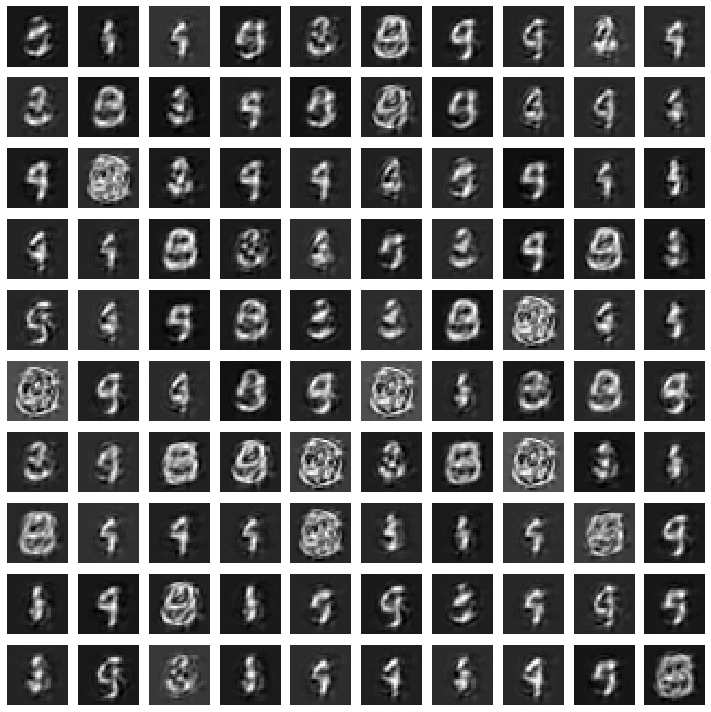

results after iter  26300  loss =  0.18626189231872559  support =  369.125


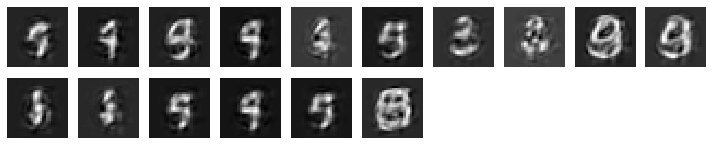

results after iter  26400  loss =  0.13406893610954285  support =  376.625


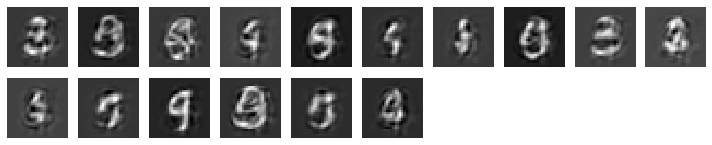

results after iter  26500  loss =  0.13996762037277222  support =  426.5625


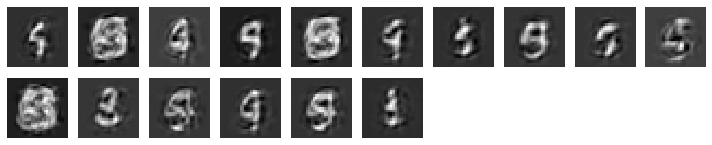

results after iter  26600  loss =  0.15213598310947418  support =  427.8125


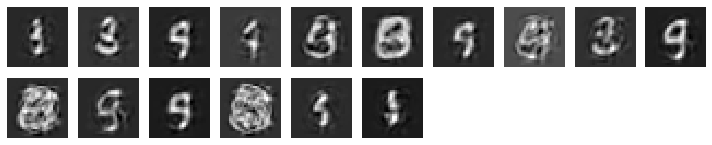

results after iter  26700  loss =  0.15462741255760193  support =  379.875


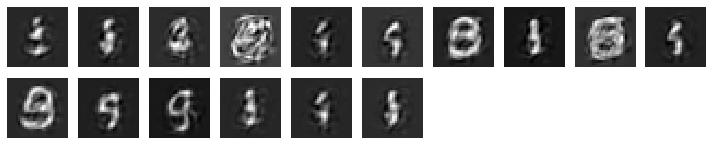

results after iter  26800  loss =  0.15759623050689697  support =  371.5


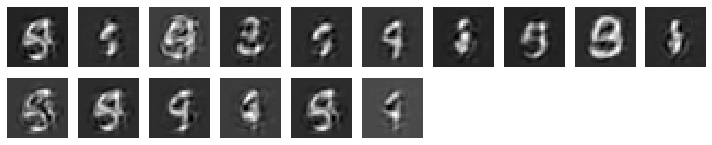

results after iter  26900  loss =  0.1534993052482605  support =  407.9375


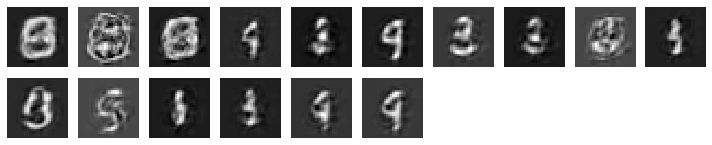

results after iter  27000  loss =  0.15859654545783997  support =  376.875


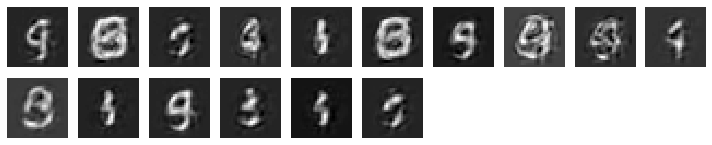

results after iter  27100  loss =  0.14919567108154297  support =  399.25


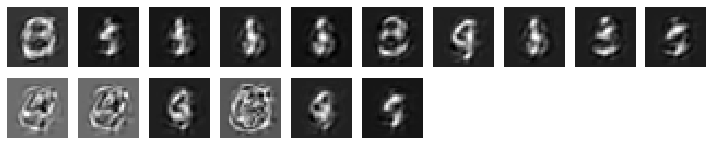

results after iter  27200  loss =  0.15510299801826477  support =  396.5


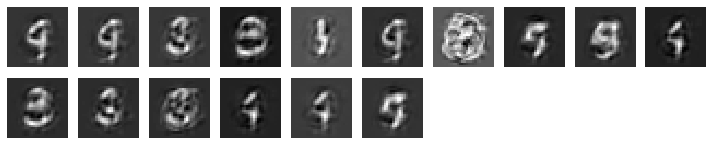

results after iter  27300  loss =  0.15707895159721375  support =  507.8125


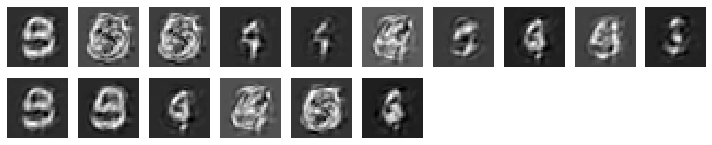

results after iter  27400  loss =  0.1338898241519928  support =  445.9375


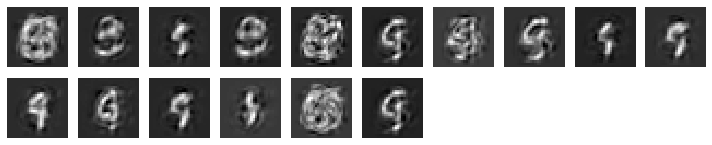

results after iter  27500  loss =  0.1339256763458252  support =  480.5


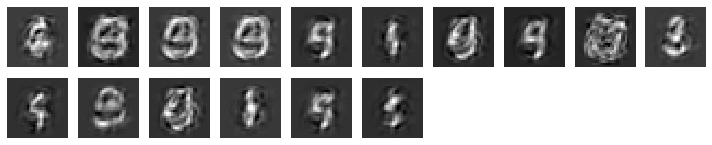

results after iter  27600  loss =  0.1461266726255417  support =  491.125


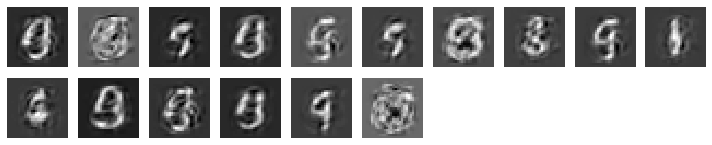

results after iter  27700  loss =  0.14921458065509796  support =  394.125


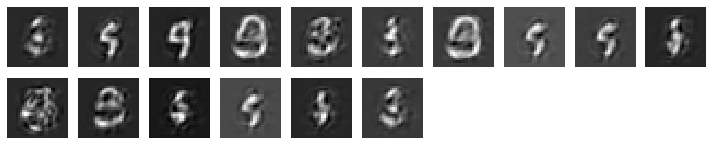

results after iter  27800  loss =  0.1591172218322754  support =  420.625


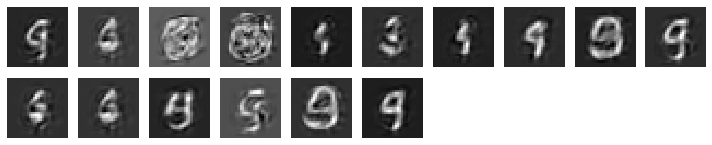

results after iter  27900  loss =  0.16440504789352417  support =  451.9375


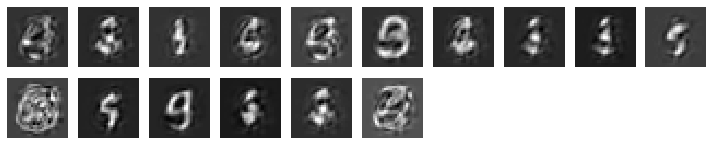

results after iter  28000  loss =  0.1499747931957245  support =  395.8125


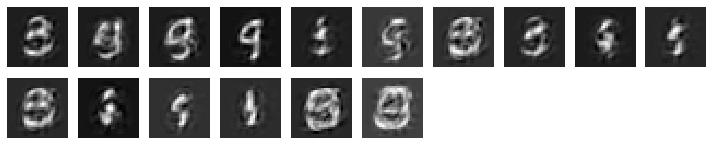

results after iter  28100  loss =  0.13942445814609528  support =  446.3125


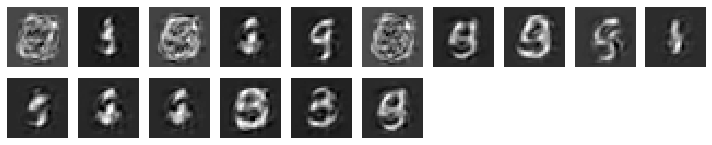

results after iter  28200  loss =  0.14096716046333313  support =  381.5625


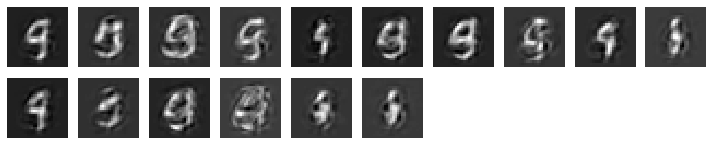

results after iter  28300  loss =  0.14832402765750885  support =  387.75


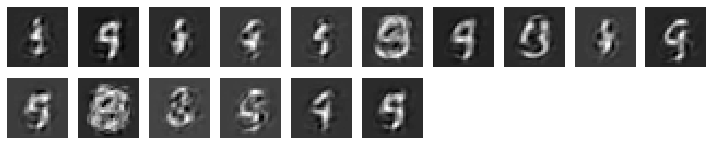

results after iter  28400  loss =  0.1460782140493393  support =  397.6875


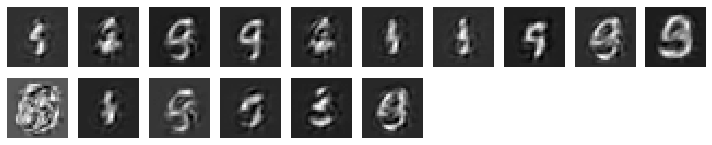

results after iter  28500  loss =  0.17454734444618225  support =  470.0


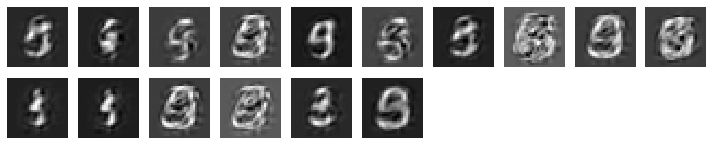

results after iter  28600  loss =  0.17374348640441895  support =  382.4375


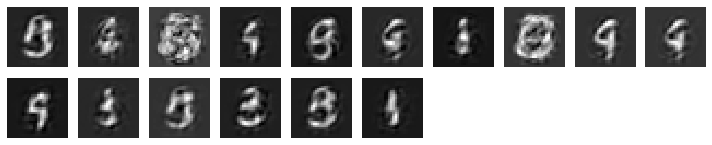

results after iter  28700  loss =  0.23789441585540771  support =  373.6875


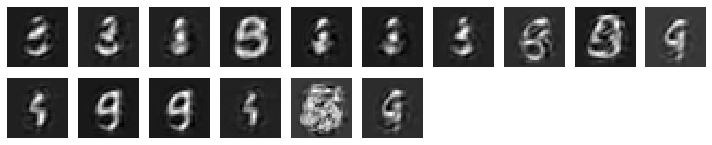

results after iter  28800  loss =  0.17688924074172974  support =  441.375


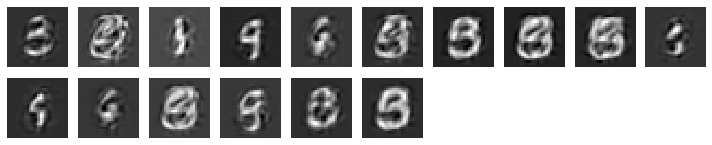

results after iter  28900  loss =  0.19321931898593903  support =  387.375


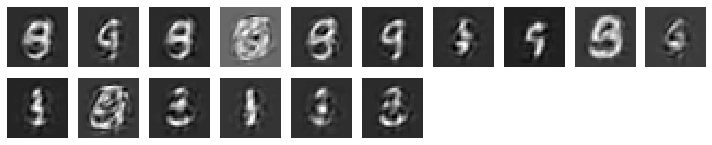

results after iter  29000  loss =  0.19239717721939087  support =  354.25


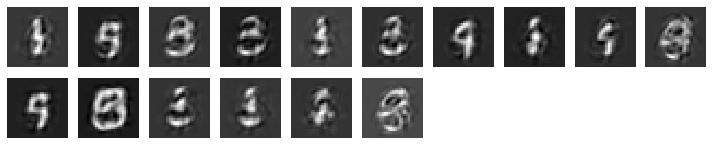

results after iter  29100  loss =  0.18045109510421753  support =  367.3125


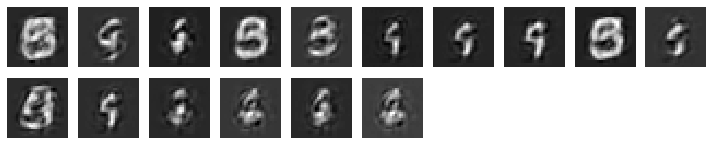

results after iter  29200  loss =  0.1620907038450241  support =  376.875


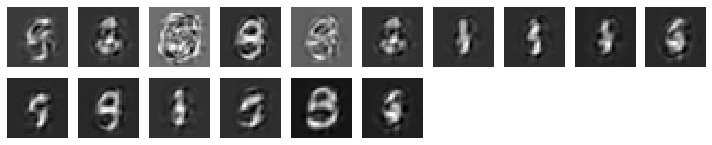

results after iter  29300  loss =  0.17850646376609802  support =  412.625


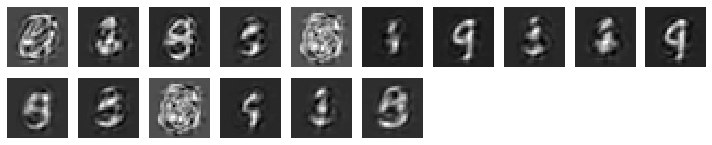

results after iter  29400  loss =  0.18458035588264465  support =  439.6875


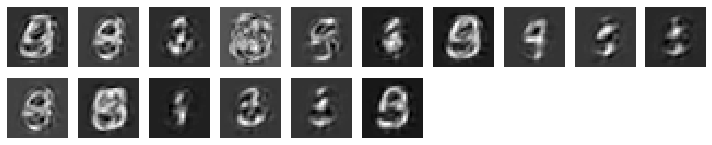

results after iter  29500  loss =  0.16916151344776154  support =  395.3125


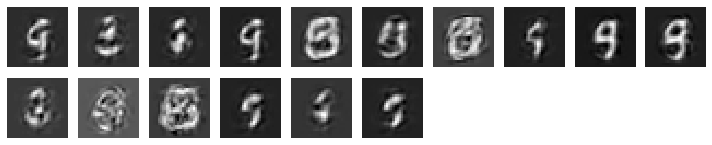

results after iter  29600  loss =  0.17088504135608673  support =  392.4375


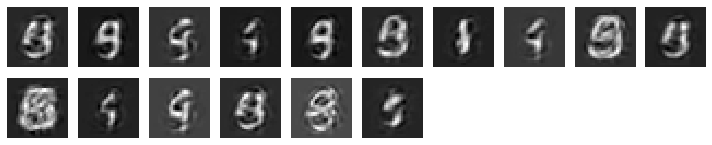

results after iter  29700  loss =  0.149671733379364  support =  390.5


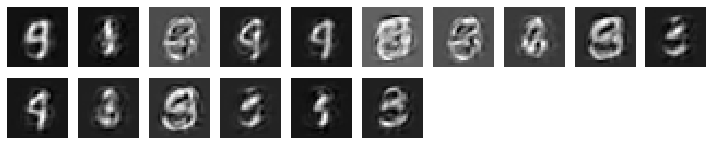

results after iter  29800  loss =  0.13965867459774017  support =  402.5625


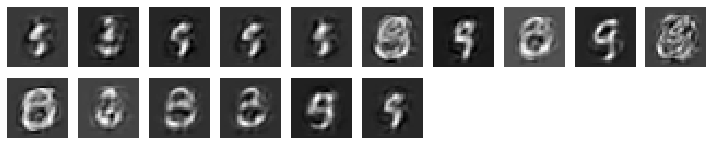

results after iter  29900  loss =  0.14076633751392365  support =  401.375


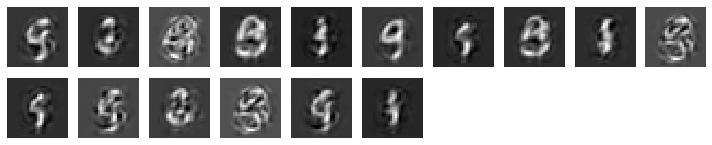

Epoch: 7 	 Discriminator Loss_fake: 0.3589479327201843 	 Discriminator Loss_real: 0.0305334459990263		 Generator Loss: [8.442949, 6.001012, 0.24288411] 		 Reconstructor Loss:1.0104758739471436


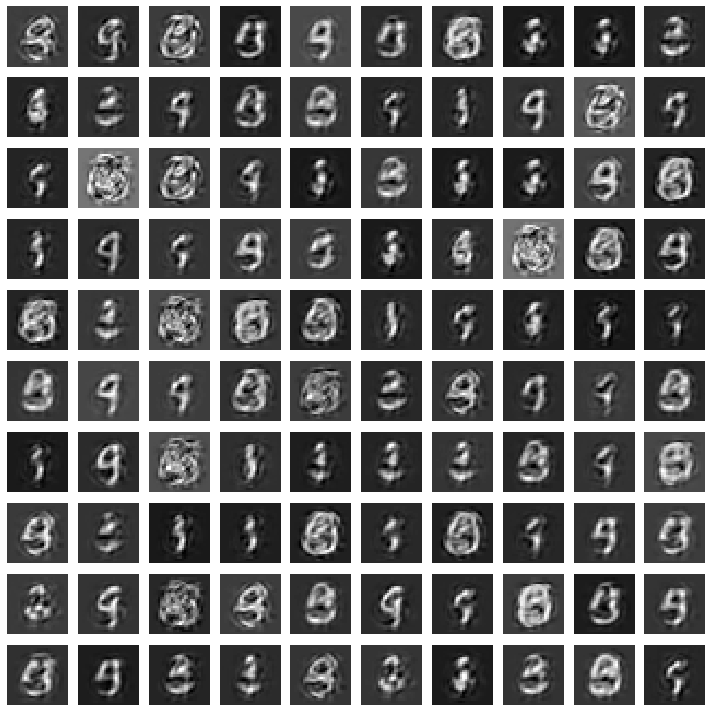

results after iter  30000  loss =  0.14890128374099731  support =  407.0625


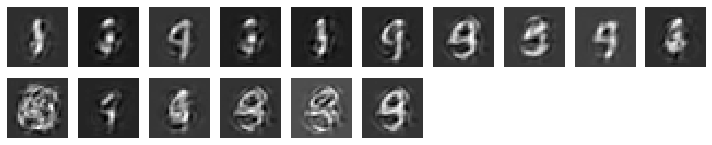

results after iter  30100  loss =  0.15660995244979858  support =  434.625


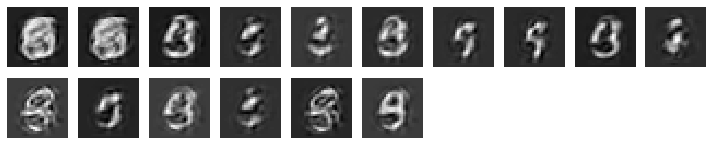

results after iter  30200  loss =  0.14870698750019073  support =  410.375


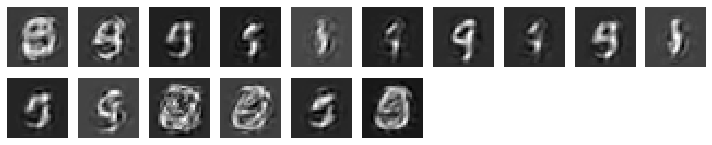

results after iter  30300  loss =  0.1376132071018219  support =  402.4375


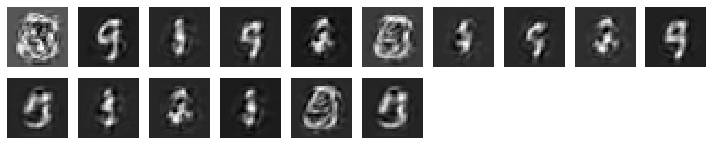

results after iter  30400  loss =  0.15640857815742493  support =  364.3125


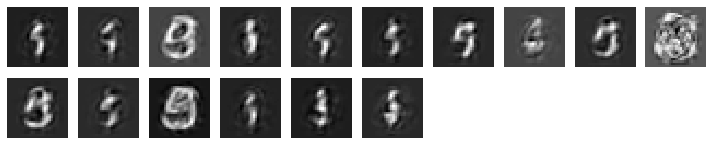

results after iter  30500  loss =  0.14685887098312378  support =  375.1875


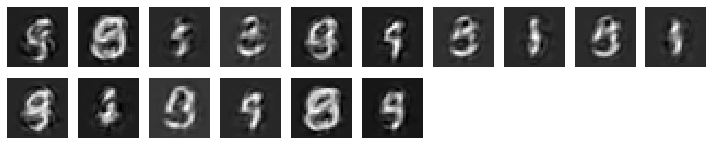

results after iter  30600  loss =  0.15751416981220245  support =  430.1875


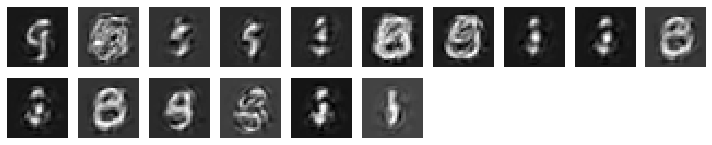

results after iter  30700  loss =  0.1429174244403839  support =  395.8125


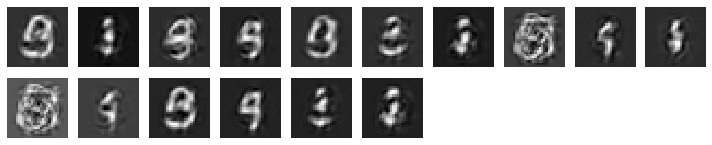

results after iter  30800  loss =  0.15554146468639374  support =  435.0625


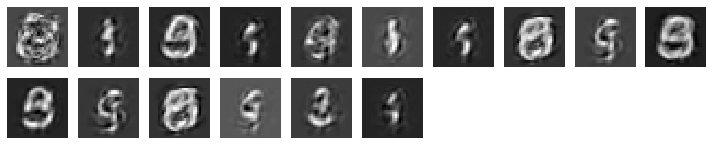

results after iter  30900  loss =  0.14068128168582916  support =  397.3125


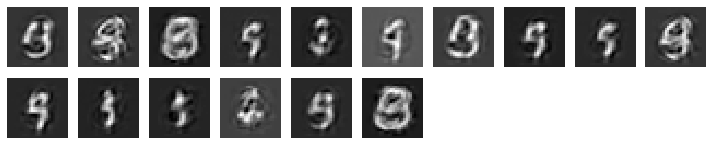

results after iter  31000  loss =  0.15397033095359802  support =  366.875


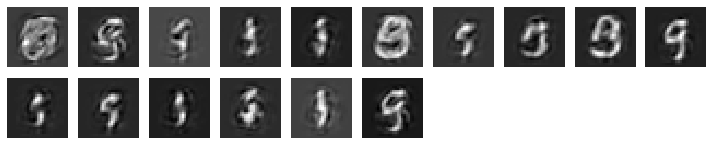

results after iter  31100  loss =  0.17752963304519653  support =  396.25


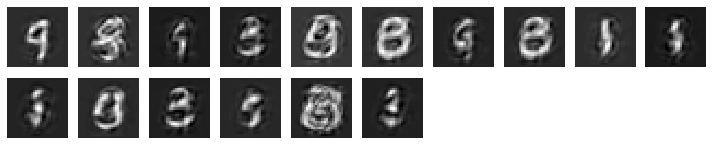

results after iter  31200  loss =  0.15646719932556152  support =  362.5625


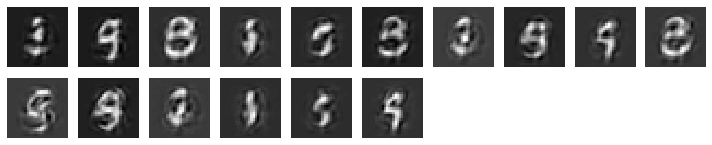

results after iter  31300  loss =  0.16326871514320374  support =  463.4375


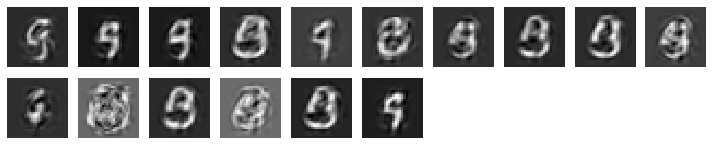

results after iter  31400  loss =  0.16952994465827942  support =  380.75


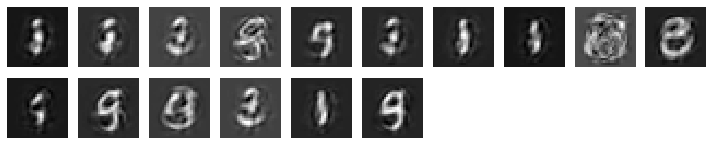

results after iter  31500  loss =  0.10677477717399597  support =  401.9375


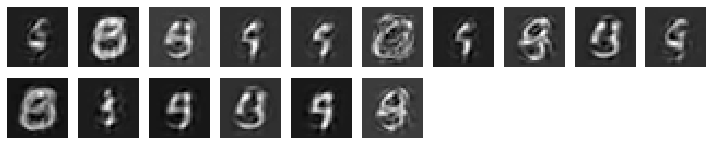

results after iter  31600  loss =  0.12047240138053894  support =  416.375


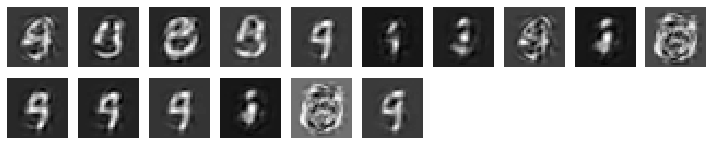

results after iter  31700  loss =  0.11487625539302826  support =  431.0


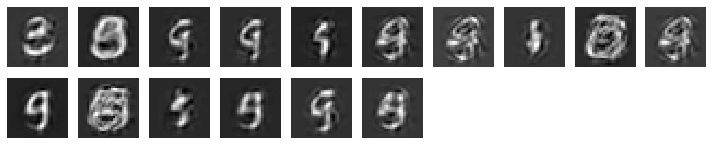

results after iter  31800  loss =  0.12657764554023743  support =  400.375


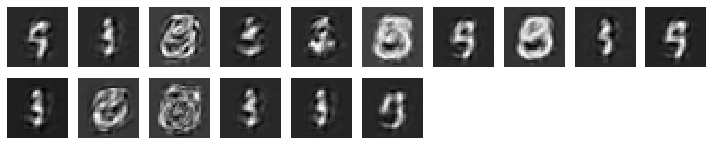

results after iter  31900  loss =  0.13333502411842346  support =  415.125


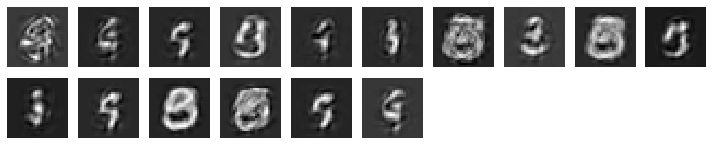

results after iter  32000  loss =  0.15117540955543518  support =  373.6875


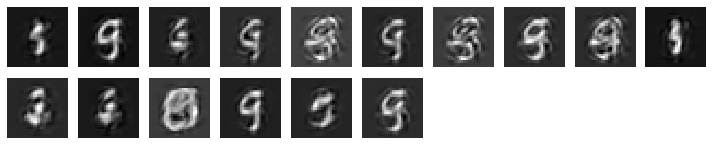

results after iter  32100  loss =  0.1544457972049713  support =  381.8125


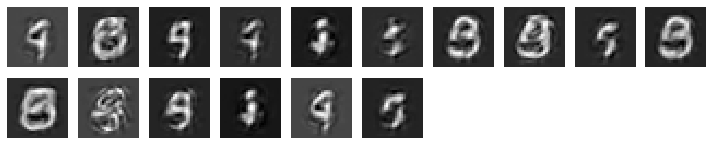

results after iter  32200  loss =  0.1606202870607376  support =  404.875


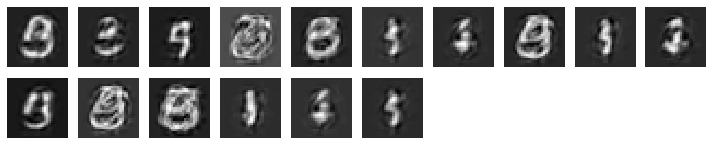

results after iter  32300  loss =  0.15384186804294586  support =  324.9375


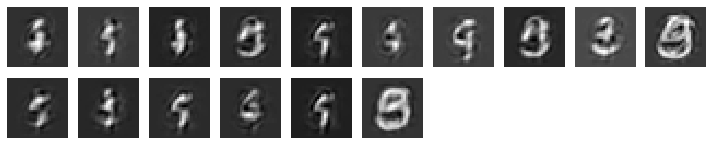

results after iter  32400  loss =  0.14119812846183777  support =  378.1875


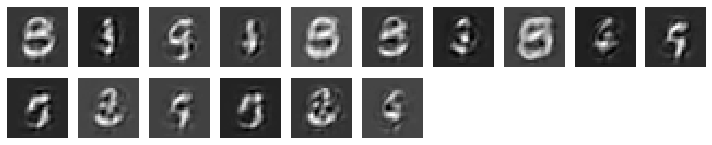

results after iter  32500  loss =  0.14766034483909607  support =  412.625


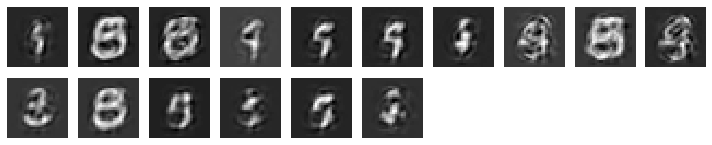

results after iter  32600  loss =  0.10241422057151794  support =  368.0625


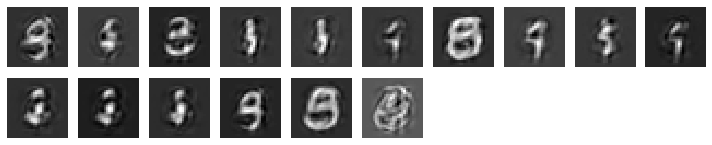

results after iter  32700  loss =  0.1314558982849121  support =  398.0625


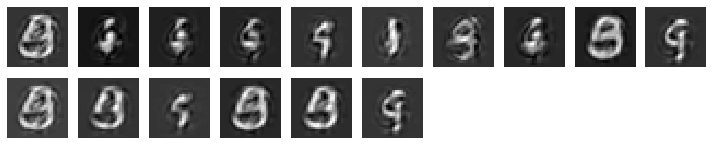

results after iter  32800  loss =  0.14925023913383484  support =  354.5


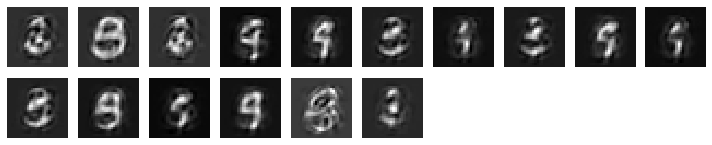

results after iter  32900  loss =  0.11487546563148499  support =  362.6875


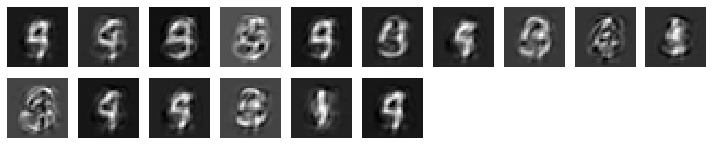

results after iter  33000  loss =  0.10525579750537872  support =  490.125


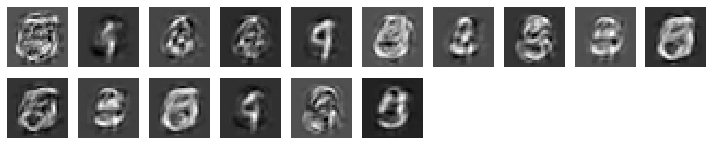

results after iter  33100  loss =  0.12166522443294525  support =  420.5625


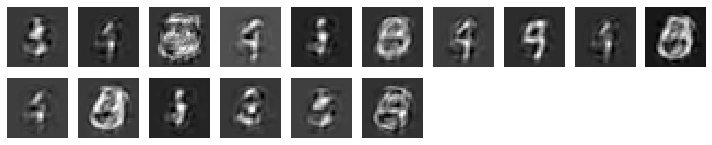

results after iter  33200  loss =  0.11151453852653503  support =  424.3125


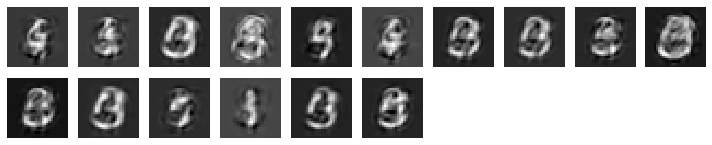

results after iter  33300  loss =  0.10825000703334808  support =  407.9375


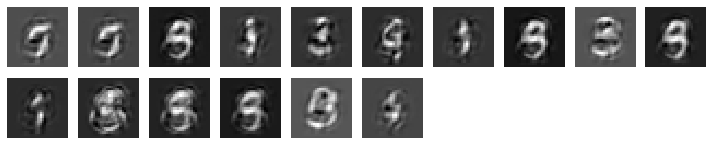

results after iter  33400  loss =  0.13035249710083008  support =  410.5


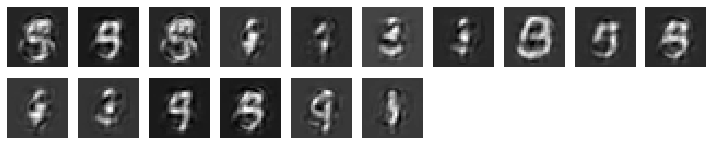

results after iter  33500  loss =  0.11974329501390457  support =  413.5


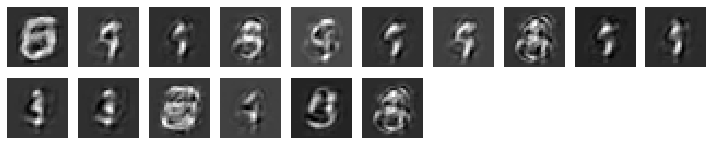

results after iter  33600  loss =  0.12431616336107254  support =  423.625


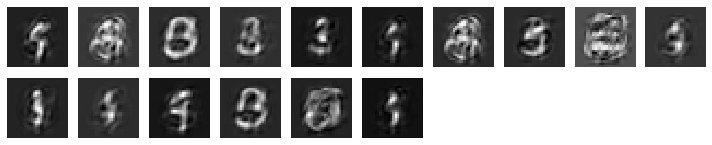

results after iter  33700  loss =  0.1577027142047882  support =  449.4375


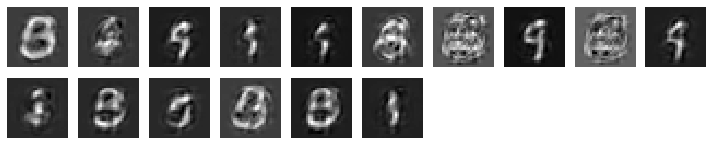

Epoch: 8 	 Discriminator Loss_fake: 0.33467671275138855 	 Discriminator Loss_real: 0.008525854907929897		 Generator Loss: [11.496458, 8.887579, 0.26010394] 		 Reconstructor Loss:0.9755595922470093


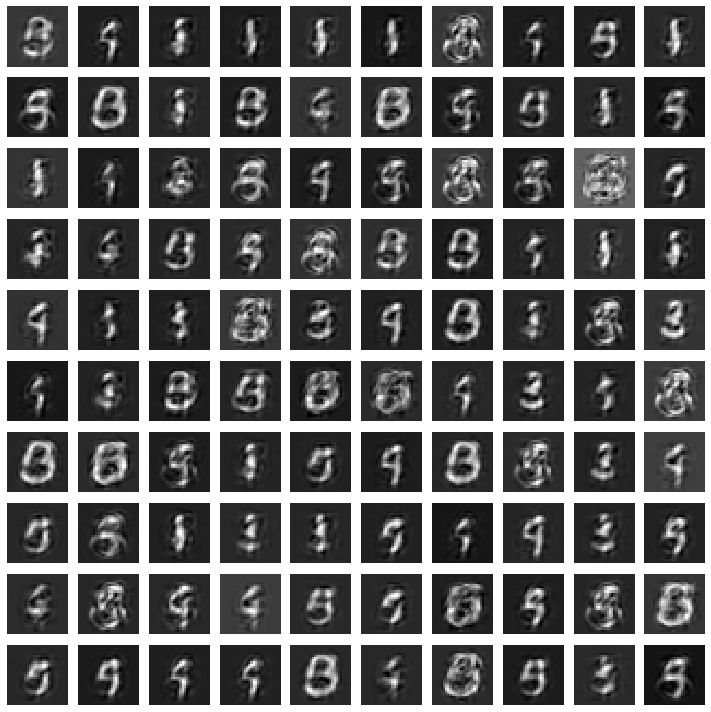

results after iter  33800  loss =  0.17685090005397797  support =  381.75


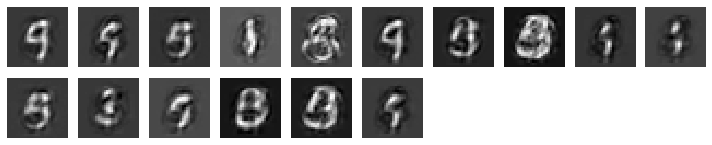

results after iter  33900  loss =  0.19645345211029053  support =  400.9375


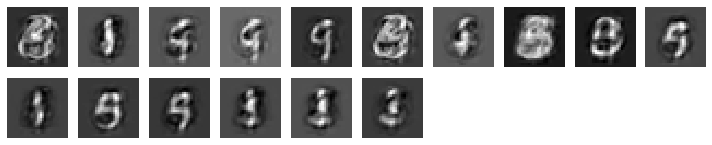

results after iter  34000  loss =  0.07831645756959915  support =  400.8125


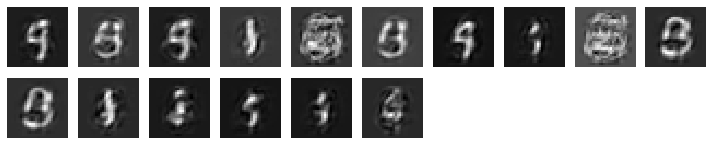

results after iter  34100  loss =  0.09184427559375763  support =  459.625


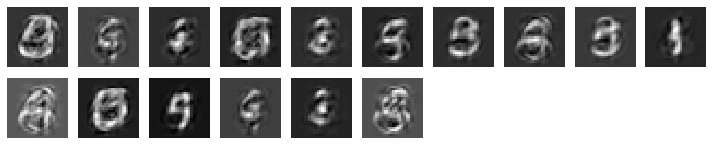

results after iter  34200  loss =  0.11757725477218628  support =  406.3125


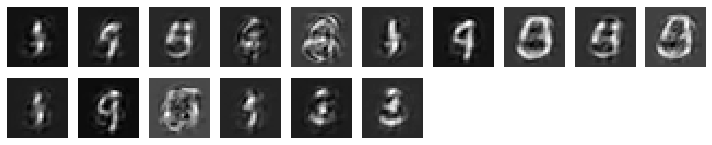

results after iter  34300  loss =  0.13139685988426208  support =  447.8125


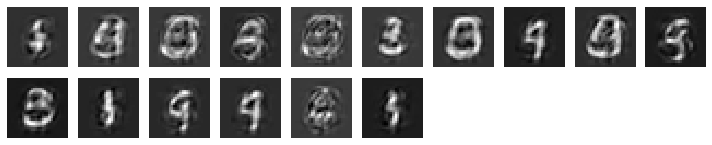

results after iter  34400  loss =  0.14236600697040558  support =  413.0625


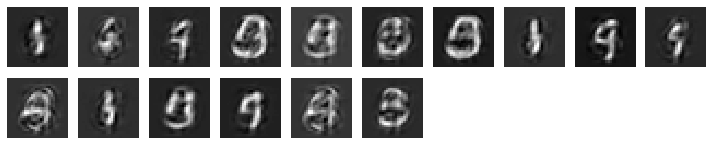

results after iter  34500  loss =  0.15367180109024048  support =  370.375


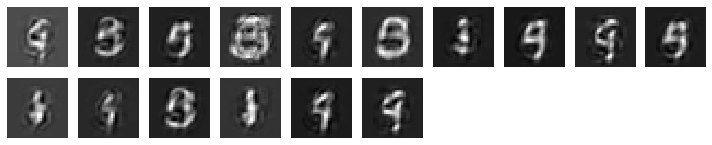

results after iter  34600  loss =  0.10561297833919525  support =  382.125


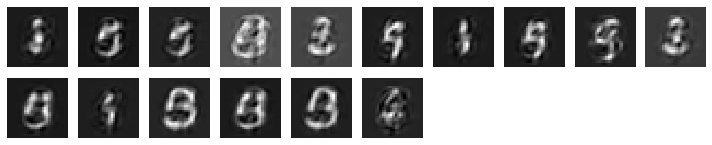

results after iter  34700  loss =  0.12458659708499908  support =  377.25


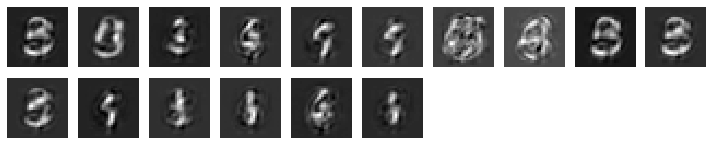

results after iter  34800  loss =  0.14124661684036255  support =  327.5625


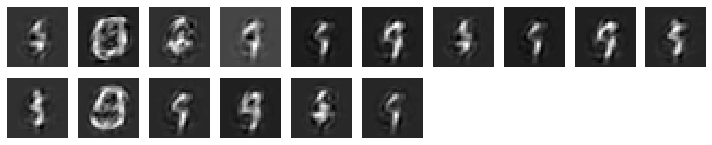

results after iter  34900  loss =  0.1507846713066101  support =  427.625


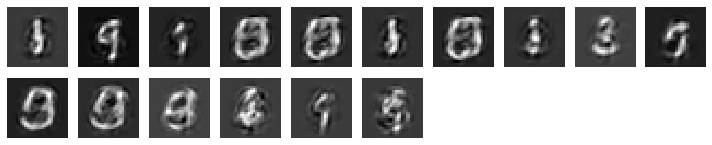

results after iter  35000  loss =  0.14848102629184723  support =  404.875


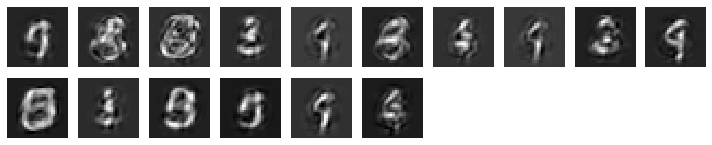

results after iter  35100  loss =  0.15227589011192322  support =  438.375


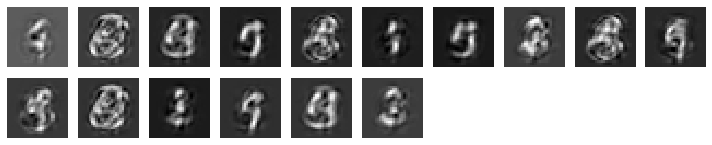

results after iter  35200  loss =  0.1389908343553543  support =  423.25


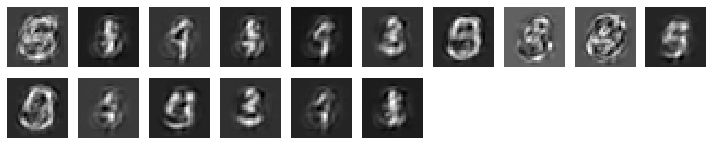

results after iter  35300  loss =  0.11979129165410995  support =  404.625


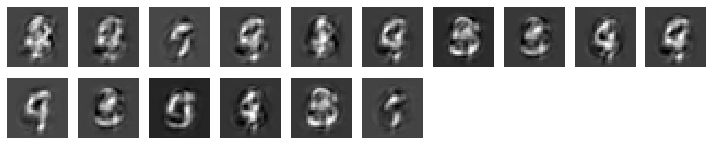

results after iter  35400  loss =  0.12791305780410767  support =  473.375


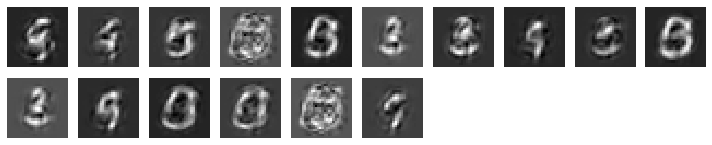

results after iter  35500  loss =  0.1269712895154953  support =  425.875


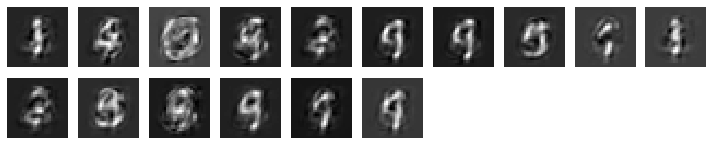

results after iter  35600  loss =  0.12860900163650513  support =  455.5


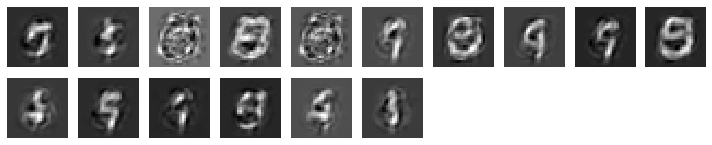

results after iter  35700  loss =  0.12585316598415375  support =  512.5625


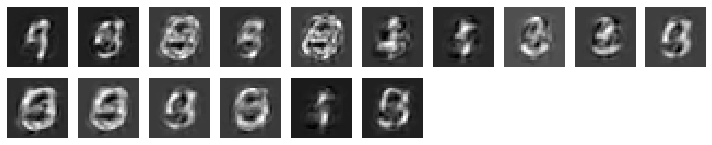

results after iter  35800  loss =  0.14106221497058868  support =  467.9375


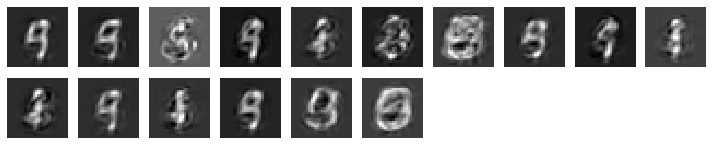

results after iter  35900  loss =  0.1274721622467041  support =  471.4375


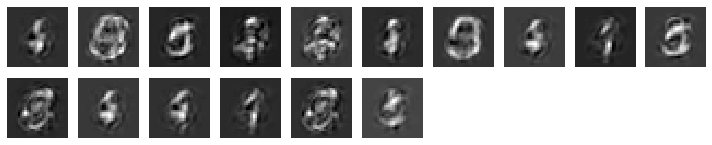

results after iter  36000  loss =  0.11692816764116287  support =  518.625


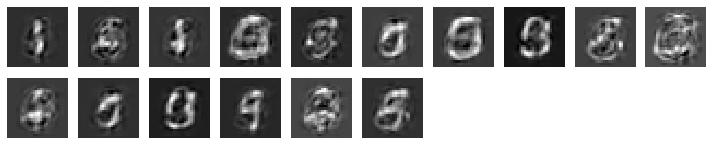

results after iter  36100  loss =  0.11441447585821152  support =  500.4375


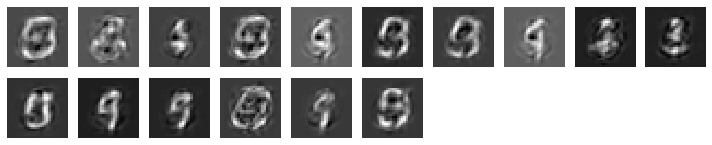

results after iter  36200  loss =  0.1286207139492035  support =  508.8125


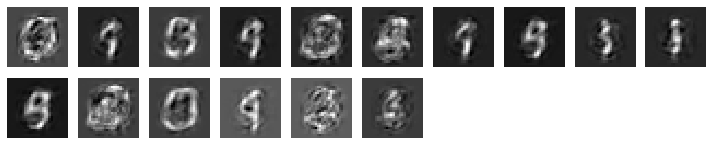

results after iter  36300  loss =  0.11945667862892151  support =  482.375


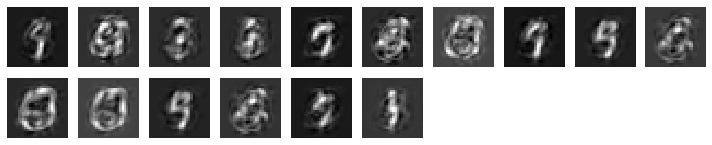

results after iter  36400  loss =  0.1296635866165161  support =  487.625


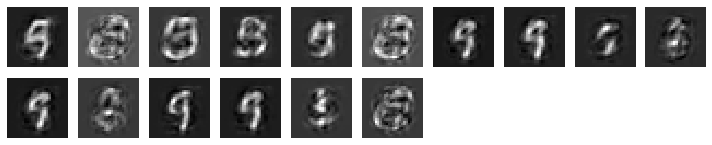

results after iter  36500  loss =  0.1548633575439453  support =  480.9375


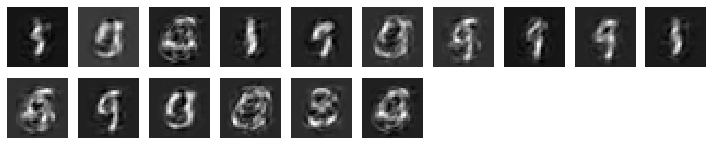

results after iter  36600  loss =  0.14022335410118103  support =  457.75


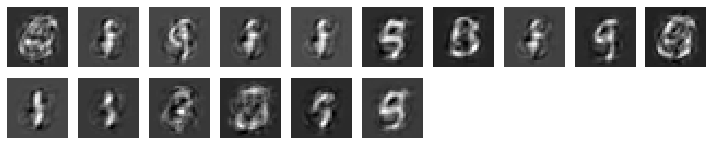

results after iter  36700  loss =  0.13291028141975403  support =  495.625


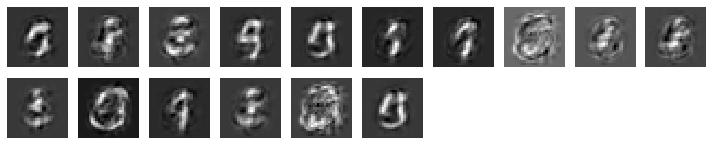

results after iter  36800  loss =  0.14231109619140625  support =  505.0625


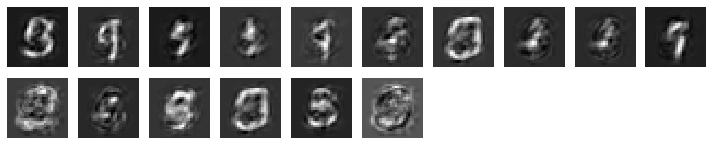

results after iter  36900  loss =  0.14803582429885864  support =  461.75


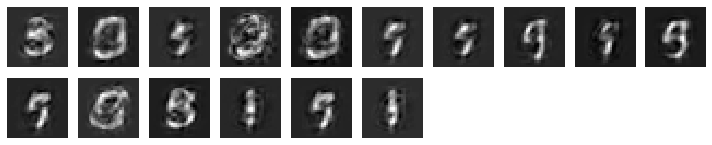

results after iter  37000  loss =  0.1508578360080719  support =  480.9375


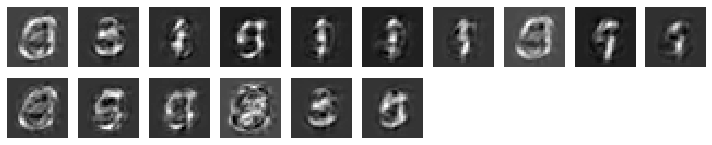

results after iter  37100  loss =  0.15775585174560547  support =  465.0625


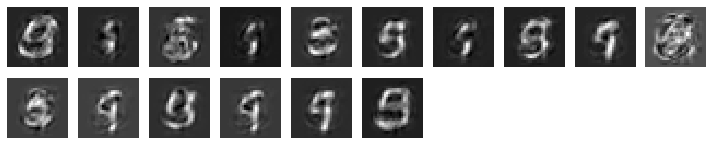

results after iter  37200  loss =  0.14203289151191711  support =  480.25


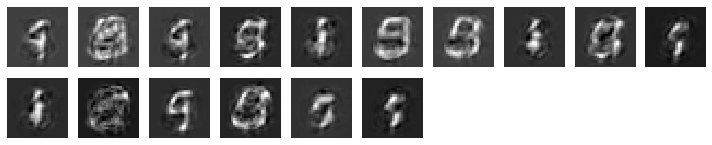

results after iter  37300  loss =  0.15040728449821472  support =  453.5625


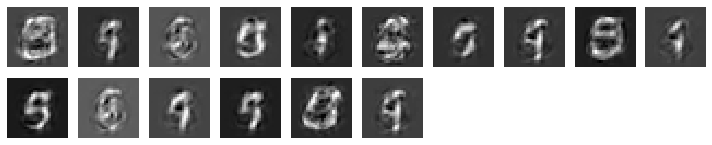

results after iter  37400  loss =  0.1258266270160675  support =  450.125


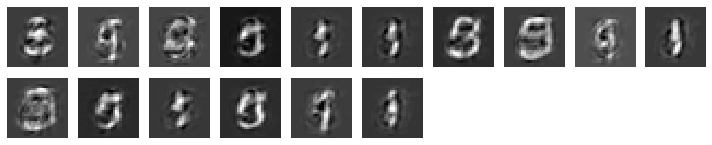

Epoch: 9 	 Discriminator Loss_fake: 0.34515854716300964 	 Discriminator Loss_real: 0.015014935284852982		 Generator Loss: [9.461345, 6.49041, 0.29566783] 		 Reconstructor Loss:1.0280284881591797


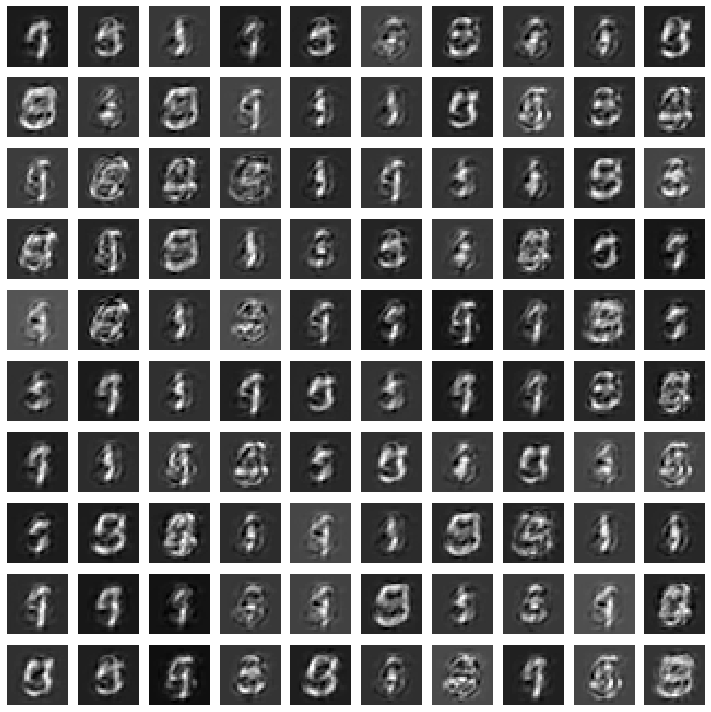

In [25]:
import matplotlib.pyplot as plt

n_d = 5 # 1 10 100
n_g = 1  # 1 10 100
n_r = 1  # 1 10 100

def count_support(sparse_mat):
  return (np.count_nonzero(sparse_mat))/batch_size

num_runs_percentage = int((epochs * steps_per_epoch)/100)

def show_images(noise):
    generated_images = generator.predict(noise)
    generated_images = np.matmul(dictionary_loaded2,np.transpose(generated_images))
    generated_images = np.transpose(generated_images)
    plt.figure(figsize=(10, 10))
    
    for i, image in enumerate(generated_images):
        plt.subplot(10, 10, i+1)
        if channels == 1:
            plt.imshow(image.reshape((img_rows, img_cols)), cmap='gray')
        else:
            plt.imshow(image.reshape((img_rows, img_cols, channels)))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

stop = False
fake_x = 0
def stop_criteria(fake_x):
  d_pred = np.sum(discriminator.predict(fake_x))/batch_size
  return d_pred >= 0.499

def d_ratio_on_fake(fake_x):
  return np.sum(discriminator.predict(fake_x))/batch_size
losses =[]
iters= []

for epoch in range(10):  #epochs
    for iter in range(int(steps_per_epoch)):
      i = iter + int(epoch*(steps_per_epoch))
    # train D
      for batch in range(n_d):  #steps_per_epoch
          noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
          fake_x = generator.predict(noise) # create G(z)
          # fake is (batch_size,sparse_dim)
          
          fake_x = np.transpose(fake_x)
          # multiply by dict
          fake_x = np.matmul(dictionary_loaded2,fake_x)

          fake_x = np.transpose(fake_x)
          fake_x = fake_x.reshape(batch_size,img_rows,img_cols,channels)
          # fake_x is of size (batch,rows,cols,channels)

          real_x = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)] # sample real image
          #remove below to return to FC scheme
          real_x = real_x.reshape(fake_x.shape)

          x = np.concatenate((real_x, fake_x))
          # x is of size (2*batch,rows,cols,channels)
          
          disc_y = np.zeros(2*batch_size)
          disc_y[:batch_size] = 0.9

          # train_on_batch recieves data and desired output
          d_loss_fake = discriminator.train_on_batch(x[:batch_size], disc_y[:batch_size])
          d_loss_real = discriminator.train_on_batch(x[batch_size:], disc_y[batch_size:])
          
          # check stop criteria
          if(epoch>0 and stop_criteria(x[:batch_size])):
            print("converged in epoch "+str(epoch))
            show_images(noise)
            stop = True
            break
      if(stop):
        break
      # print temp results
      if(i%100==0):
        losses = losses + d_ratio_on_fake(fake_x)
        iters = iters + i
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        print("results after iter ",i," loss = ",d_ratio_on_fake(fake_x)," support = " ,count_support(generator.predict(noise)))
        show_images(noise)
      # train G
      for batch in range(n_g):  #steps_per_epoch
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        # train GAN (descriminator weights are fixed)
        y_gen_1 = np.ones(batch_size)
        y_gen_2 = np.zeros(batch_size * sparse_dim)
        y_gen_2 = y_gen_2.reshape(batch_size,sparse_dim)
        # TODO train the two outputs
        g_loss = gan.train_on_batch(noise, [y_gen_1,y_gen_2])
            
      # train R
      for batch in range(n_r):  #steps_per_epoch
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))  # will generate batch amount of noise vectors (gaussian distribution)
        r_loss = vae.train_on_batch(noise[:batch_size],noise[:batch_size])

    if(stop):
        break
    print(f'Epoch: {epoch} \t Discriminator Loss_fake: {d_loss_fake} \t Discriminator Loss_real: {d_loss_real}\t\t Generator Loss: {g_loss} \t\t Reconstructor Loss:{r_loss}')
    noise = np.random.normal(0, 1, size=(100, noise_dim))
    show_images(noise)







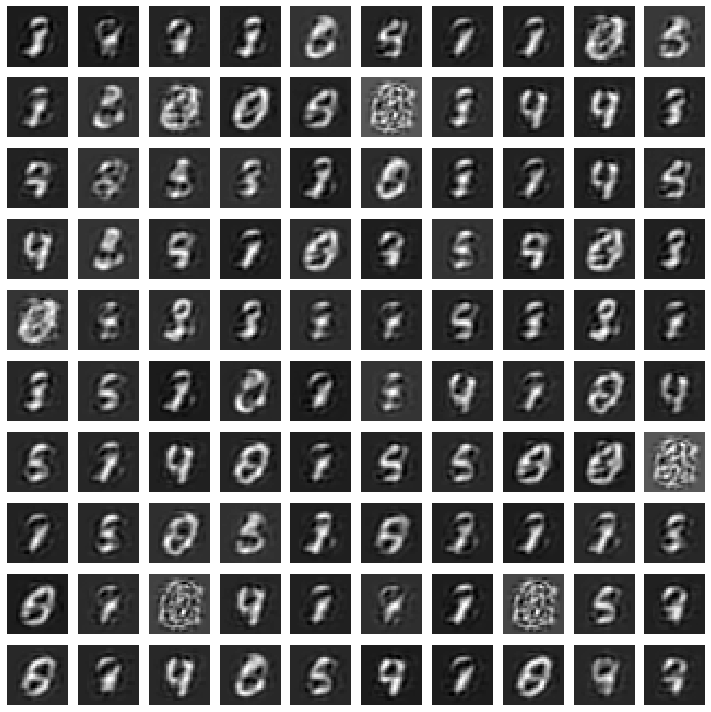

In [12]:
noise = np.random.normal(0, 1, size=(100, noise_dim))
show_images(noise)